# 前処理

## 一般

In [ ]:
!pip install catboost

In [ ]:
!pip install shap

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import numpy as np
import polars as pl
import pandas as pd
from pathlib import Path
import pickle
import matplotlib.pyplot as plt

import gc
import os
import sys
import io
import itertools
import re
# import shap
import joblib

from tqdm import tqdm
from IPython.display import clear_output

import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans


import lightgbm as lgb
from catboost import CatBoostRegressor, Pool,CatBoostClassifier
from sklearn.model_selection import *
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import VotingRegressor
from sklearn.inspection import permutation_importance
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD

In [ ]:
train = pl.read_csv("/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/train.csv")
test = pl.read_csv("/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/test.csv")
concept = pl.read_csv("/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/concepts.csv")

In [ ]:
def get_outlier(train):
    df = train.drop(['utility_agent1','num_losses_agent1','num_wins_agent1', 'num_draws_agent1',"fold"])
    # train = train.with_columns([
    #     sum([(df[col] > df[col].quantile(0.95)).cast(pl.Int8) for col in df.columns if df.schema[col] != pl.String]).alias("outlier_95_sum")
    # ])
    train = train.with_columns([
        sum([(df[col] > df[col].quantile(0.99)).cast(pl.Int8) for col in df.columns if df.schema[col] != pl.String]).alias("outlier_99_sum")
    ])
    # train = train.with_columns([
    #     sum([(df[col] < df[col].quantile(0.05)).cast(pl.Int8) for col in df.columns if df.schema[col] != pl.String]).alias("outlier_5_sum")
    # ])
    # train = train.with_columns([
    #     sum([(df[col] < df[col].quantile(0.01)).cast(pl.Int8) for col in df.columns if df.schema[col] != pl.String]).alias("outlier_1_sum")
    # ])
    return train

In [ ]:
# アンダーサンプリング後の各ゲームの最大サンプル数を設定
def undersample(train,samplenum):
    max_samples_per_game = samplenum
    train = train.to_pandas()
    train["Game"] = train["LudRules"].str.split('"').str.get(1)
    # アンダーサンプリングを実行
    def undersample(group):
        if len(group) > max_samples_per_game:
            return group.sample(max_samples_per_game,random_state=42)
        else:
            return group

    train = train.groupby('Game', group_keys=False).apply(undersample)
    train = train.reset_index(drop=True)
    # train = train.drop("Game",axis=1)
    train = pl.from_pandas(train)
    return train

In [ ]:
def get_fold(train,random_state):
    n_splits = 5
    train = train.to_pandas()
    train["Game"] = train["LudRules"].str.split('"').str.get(1)
    group_col = train['Game']
    group_kfold = StratifiedGroupKFold(n_splits=n_splits,shuffle=True,random_state = random_state)
    # group_kfold = GroupKFold(n_splits=n_splits)

    # train["groupcut"] = np.abs(train["utility_agent1"] - (train["AdvantageP1"]*2-1))
    # train["groupbin"] = pd.cut(train["groupcut"],bins=10,labels=False)

    train["fold"] = -1
    # train["G"] = (train["utility_agent1"] == 1).astype("str")
    for fold, (train_idx, test_idx) in enumerate(group_kfold.split(train, train["utility_agent1"].astype("str"), groups=group_col),
                                                      ):
        train.loc[test_idx, "fold"] = fold
    # train = train.drop("groupcut",axis=1)
    # train = train.drop("groupbin",axis=1)
    # train = train.drop("G",axis=1)
    train = train.drop("Game",axis=1)
    train = pl.from_pandas(train)
    return train

In [ ]:
# train = get_fold(train,16)
# for i in range(5):
#     dd = train[train["fold"]==i]
#     df = train[train["fold"]!=i]
#     data1 = dd["utility_agent1"]
#     data2 = df["utility_agent1"]

#     fig, axs = plt.subplots(1, 2, figsize=(10, 5))
#     axs[0].hist(data1, bins=20, edgecolor='black')
#     axs[1].hist(data2,bins=20,edgecolor='black')

In [ ]:
# Englishruleから特徴量作成
def extract_from_engrule(df,n_component):
    tfidf = TfidfVectorizer()
    tfidf_matrix = tfidf.fit_transform(df['EnglishRules'])
    svd = TruncatedSVD(n_components=n_component)
    svd_matrix = svd.fit_transform(tfidf_matrix)
    svd_df = pd.DataFrame(svd_matrix, columns=[f'svd_component_{i+1}' for i in range(n_component)])
    scaler = StandardScaler()
    svd_df_scaled = scaler.fit_transform(svd_df)

    kmeans = KMeans(n_clusters=15, random_state=42)
    labels = kmeans.fit_predict(svd_df_scaled)

    train = df.to_pandas()
    train["svd_cluster"] = labels
    # train = pd.concat([train, svd_df], axis=1)
    train = pl.from_pandas(train)

    filename = f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline14/0921_tfidf.pickle"

    with open(filename, mode='wb') as fp:
        pickle.dump(tfidf, fp)

    filename = f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline14/0921_svd.pickle"

    with open(filename, mode='wb') as fp:
        pickle.dump(svd, fp)

    return train

In [ ]:
# GameRulesetNameからゲーム名で特徴量を作成する
def extract_game_name(df):
    # 文字列長
    df = df.with_columns(pl.col("GameRulesetName").str.len_chars().alias("GameRulesetName_len"))
    # _で区切られた単語数
    df = df.with_columns(pl.col("GameRulesetName").str.count_matches("_").alias("GameRulesetName_count"))
    #アルファベットと数字の割合
    # train = train.with_columns([
    #     pl.col("GameRulesetName").str.count_match(r"[A-Za-z]").alias("alpha_count"),
    #     pl.col("GameRulesetName").str.count_match(r"\d").alias("digit_count")
    # ])

    # 頻出単語があるかないかフラグ
    frequent_word = ["Suggested"]
    for keyword in frequent_word:
        df = df.with_columns([
            pl.col("GameRulesetName").str.contains(keyword).cast(pl.Int8).alias(f"contains_{keyword.lower()}")
        ])
    frequent_word_column = [f"contains_{keyword.lower()}" for keyword in frequent_word]

    return df

frequent_word = ["Suggested"]
frequent_word_column = [f"contains_{keyword.lower()}" for keyword in frequent_word]

In [ ]:
nomean_cols = []
for col,dtype in train.schema.items():
    # 列ですべての値が等しいカラムについては取り除く
    if dtype != pl.Utf8:
        if train[col].n_unique() == 1:
            nomean_cols.append(col)
    # nullしかないカラムも取り除く
    elif train[col].is_null().sum() == len(train):
        nomean_cols.append(col)

print(len(nomean_cols))

216


In [ ]:
# 語尾にfrequencyをつけると同じカラムが出現するやつ
freq_df = pd.read_csv(io.StringIO('''
VoteDecision
SwapPlayersDecision
PassDecision
ProposeDecision
AddDecision
PromotionDecision
RemoveDecision
RotationDecision
StepDecision
StepDecisionToEmpty
StepDecisionToFriend
StepDecisionToEnemy
SlideDecision
SlideDecisionToEmpty
SlideDecisionToEnemy
SlideDecisionToFriend
LeapDecision
LeapDecisionToEmpty
LeapDecisionToEnemy
HopDecision
HopDecisionMoreThanOne
HopDecisionEnemyToEmpty
HopDecisionFriendToEmpty
HopDecisionEnemyToEnemy
HopDecisionFriendToEnemy
FromToDecision
FromToDecisionEmpty
FromToDecisionEnemy
FromToDecisionFriend
SwapPiecesDecision
ShootDecision
VoteEffect
SwapPlayersEffect
PassEffect
Roll
ProposeEffect
AddEffect
Sow
SowCapture
SowRemove
SowBacktracking
PromotionEffect
RemoveEffect
PushEffect
Flip
SetNextPlayer
MoveAgain
SetValue
SetCount
SetRotation
StepEffect
SlideEffect
LeapEffect
HopEffect
FromToEffect
ReplacementCapture
HopCapture
HopCaptureMoreThanOne
DirectionCapture
EncloseCapture
CustodialCapture
InterveneCapture
SurroundCapture
CaptureSequence
LineEnd
LineWin
LineLoss
LineDraw
ConnectionEnd
ConnectionWin
ConnectionLoss
GroupEnd
GroupWin
GroupLoss
GroupDraw
LoopEnd
LoopWin
LoopLoss
PatternEnd
PatternWin
PathExtentEnd
PathExtentWin
PathExtentLoss
TerritoryEnd
TerritoryWin
Checkmate
CheckmateWin
NoTargetPieceEnd
NoTargetPieceWin
EliminatePiecesEnd
EliminatePiecesWin
EliminatePiecesLoss
EliminatePiecesDraw
NoOwnPiecesEnd
NoOwnPiecesWin
NoOwnPiecesLoss
FillEnd
FillWin
ReachEnd
ReachWin
ReachLoss
ReachDraw
ScoringEnd
ScoringWin
ScoringLoss
ScoringDraw
NoMovesEnd
NoMovesWin
NoMovesLoss
NoMovesDraw
NoProgressEnd
NoProgressDraw
Draw
'''), header=None, )
freq_cols = list(freq_df.iloc[:,0])
print(len(freq_cols))

113


In [ ]:
duplicate_cols =['AsymmetricForces','AsymmetricPiecesType','PieceDirection','Team','SpiralTiling','CircleTiling','ShibumiStyle','MancalaStyle','NumPerimeterSites', 'SwapOption',
                 'SetRotationFrequency','PathExtent','SowOriginFirst','SetRotationFrequency','LeftwardDirection','LeftwardsDirection','ForwardLeftDirection','BackwardLeftDirection','LoopEndFrequency',
                 'PatternEndFrequency','TerritoryEndFrequency','NoProgressEndFrequency''StateType']

In [ ]:
%%time

def remove_useless(df: pl.DataFrame, nomean_cols : list, freq_cols : list,duplicate_cols : list) -> pl.DataFrame:

    drop_cols = nomean_cols + freq_cols + ["GameRulesetName","Id",]+duplicate_cols

    Dropped = [col for col in drop_cols if col in df.columns]

    df = df.drop(Dropped)

    return df

CPU times: user 6 µs, sys: 1e+03 ns, total: 7 µs
Wall time: 10.7 µs


In [ ]:
# 一塊にしてワンホットを一つの列にしたほうがよさそうなやつ
# 一回やめてみる
shape_list = [ 'Shape',
 'SquareShape',
 'HexShape',
 'TriangleShape',
 'DiamondShape',
 'RectangleShape',
 'SpiralShape',
 'CircleShape',
 'StarShape',
 'SquarePyramidalShape',
#  'RegularShape',
#  'PolygonShape',
]

tiling_list = ["Tiling",
 'SquareTiling',
 'HexTiling',
 'TriangleTiling',
 'SemiRegularTiling',
 'MorrisTiling',
#  'CircleTiling',
#  'ConcentricTiling',
#  'SpiralTiling',
 'AlquerqueTiling',]

mancala_list = [ 'MancalaBoard',
#  'MancalaStores',
 'MancalaTwoRows',
 'MancalaThreeRows',
 'MancalaFourRows',
 'MancalaSixRows',
 'MancalaCircular']

alquerque_list = [ 'AlquerqueBoard',
 'AlquerqueBoardWithOneTriangle',
 'AlquerqueBoardWithTwoTriangles',
 'AlquerqueBoardWithFourTriangles',
 'AlquerqueBoardWithEightTriangles',]

board_list = [ 'ThreeMensMorrisBoard',
 'ThreeMensMorrisBoardWithTwoTriangles',
 'NineMensMorrisBoard',
 'StarBoard',
 'CrossBoard',
 'KintsBoard',
 'PachisiBoard',
 'FortyStonesWithFourGapsBoard']

dice_list = [  'Dice',
 'DiceD2',
 'DiceD4',
 'DiceD6',]

category_list = [shape_list , tiling_list ,mancala_list , alquerque_list ,board_list ,dice_list]
addcat_list = ["Shape_category","Tiling_category","Mancala_category","Alquerque_category","Board_category","Dice_category"]
def create_category(df,category_list, addcat_list):
    for i,col_list in enumerate(category_list):
        addcat_name = addcat_list[i]
        df = df.with_columns(pl.lit("none").alias(addcat_name))
        for col in col_list:
            df = df.with_columns(pl.col(col).cast(pl.Utf8))
            df = df.with_columns(pl.col(col).replace(1, col).alias(col))
            df = df.with_columns(
                      pl.when(pl.col(col) == col).then(pl.col(col)).otherwise(pl.col(addcat_name)).alias(addcat_name)
                  )
        df = df.drop(col_list)
    return df

In [ ]:
filtered_columns = train.select([
    col for col in train.columns
    if train[col].dtype in [pl.Int64, pl.Float64] and train[col].is_in([0, 1]).all()
]).columns


In [ ]:
# ゲームの複雑さを表現したい
def create_category_sum(df):
    directions_col = ['Directions','AbsoluteDirections','AllDirections','AdjacentDirection','OrthogonalDirection','DiagonalDirection','RotationalDirection','SameLayerDirection','RelativeDirections',
                      'ForwardDirection','BackwardDirection','ForwardsDirection','BackwardsDirection','SameDirection','OppositeDirection',]

    style_cols = [ 'Style','BoardStyle','GraphStyle','ChessStyle','GoStyle','PenAndPaperStyle',
                   'BackgammonStyle','JanggiStyle','XiangqiStyle','ShogiStyle','TableStyle','SurakartaStyle','TaflStyle',]

    # component_cols = ['ComponentStyle','AnimalComponent','ChessComponent','FairyChessComponent','PloyComponent','ShogiComponent','XiangqiComponent',
    #                   'StrategoComponent','JanggiComponent','CheckersComponent','BallComponent','TaflComponent','DiscComponent','MarkerComponent']

    spacecondition_cols = ['Line','Connection','Group','Contains','Loop','Pattern','Territory','Fill','Distance',]

    checc_cols = ["KingComponent","QueenComponent","KnightComponent","RookComponent","BishopComponent","PawnComponent"]

    logic_cols = ["Logic", "Conjunction", "Disjunction",  "Negation"]


    df = df.with_columns(sum([pl.col(c) for c in directions_col]).alias("DirectionSum"))
    df = df.with_columns(sum([pl.col(c) for c in style_cols]).alias("StyleSum"))
    # df = df.with_columns(sum([pl.col(c) for c in component_cols]).alias("ComponentSum"))
    df = df.with_columns(sum([pl.col(c) for c in spacecondition_cols]).alias("SpaceConditionSum"))
    df = df.with_columns(sum([pl.col(c) for c in checc_cols]).alias("CheccSum"))
    df = df.with_columns(sum([pl.col(c) for c in logic_cols]).alias("LogicSum"))


    # df = df.drop(directions_col)
    # # df = df.drop(style_cols)
    # # df = df.drop(component_cols)
    # df = df.drop(spacecondition_cols)
    # df = df.drop(checc_cols)
    # df = df.drop(logic_cols)



    return df


In [ ]:
import numpy as np
import pandas as pd
from multiprocessing import Pool, cpu_count
from tqdm import tqdm

def symbol_match(rule):
    stack = []
    data = []
    for i in range(len(rule)):
        if rule[i] in ['(', '{']:
            stack.append(rule[i])
        elif rule[i] in [')', '}']:
            stack = stack[:-1]
        elif (rule[i] == '"') and (len(stack) > 0) and (stack[-1] == '"'):
            stack = stack[:-1]
        elif rule[i] == '"':
            stack.append('"')
        data.append(rule[i])
        if len(stack) == 0:
            return ''.join(data).strip(), rule[i + 1:].strip()
    return '', ''

def get_ruledata(rule):
    rule = rule[len('(game '):-1].strip()
    datas = []
    while len(rule):
        data, rule = symbol_match(rule)
        datas.append(data)
    return datas

def process_rules(rules, chunk_size=100):
    with Pool(cpu_count()) as pool:
        # tqdm for progress bar, use imap_unordered for faster return of results
        result = list(tqdm(pool.imap(get_ruledata, rules, chunksize=chunk_size), total=len(rules)))
    return result

def split_rule(df):
    df = df.to_pandas()

    rules = df['LudRules'].values
    rule_datas = process_rules(rules)
    rule_datas = np.array(rule_datas, dtype=object)
    rule_datas = pd.DataFrame(rule_datas,columns =['game', 'players', 'equipment', 'rules'] )
    rule_datas = rule_datas.drop(columns=["game","equipment","rules"])
    df = pd.concat([df, rule_datas], axis=1)
    df = pl.from_pandas(df)

    return df

In [ ]:
def parse_prefix_tree(s):
    stack = []
    indent = 0
    current_line = ''
    indent_box_equipment = []
    indent_box_phase = []
    indent_box_rule_start = []
    indent_box_rule_play = []
    indent_box_rule_end = []
    flag = ""

    def flush_line():
        nonlocal current_line,indent_box_equipment,indent_box_phase,indent_box_rule_start,indent_box_rule_play,indent_box_rule_end,flag
        if current_line.strip():
            # print(f'Level {indent:02} - ' + '. ' * indent, current_line.strip())
            if indent == 2 and current_line.strip() == "equipment":
              flag = "equipment"
            if indent == 2 and current_line.strip() == "phases:":
              flag = "phases"
            if indent == 3 and current_line.strip() == "start":
              flag = "start"
            if indent == 3 and current_line.strip() == "play":
              flag = "play"
            if indent == 3 and current_line.strip() == "end":
              flag  = "end"

            if flag == "equipment":
              indent_box_equipment.append(indent)
            elif flag == "phases":
              indent_box_phase.append(indent)
            elif flag == "start":
              indent_box_rule_start.append(indent)
            elif flag == "play":
              indent_box_rule_play.append(indent)
            elif flag == "end":
              indent_box_rule_end.append(indent)
        current_line = ''
    i = 0
    while i < len(s):
        char = s[i]
        if char == '(' or char == '{':
            flush_line()
            stack.append(char)
            indent += 1
        elif char == ')' or char == '}':
            flush_line()
            indent -= 1
        elif char not in '(){}':
            j = i
            while j < len(s) and s[j] not in '(){}':
                j += 1
            current_line += s[i:j].strip()
            i = j - 1
        if current_line and (char == ')' or char == '}'):
            flush_line()
        i += 1
    flush_line()

    if len(indent_box_phase) == 0:
      indent_box_phase.append(0)
    if len(indent_box_rule_start) == 0:
      indent_box_rule_start.append(0)
    if len(indent_box_rule_play) == 0:
      indent_box_rule_play.append(0)
    if len(indent_box_rule_end) == 0:
      indent_box_rule_end.append(0)

    return [max(indent_box_equipment),np.mean(indent_box_equipment),len(indent_box_equipment) ,max(indent_box_phase),np.mean(indent_box_phase),len(indent_box_phase)
    ,max(indent_box_rule_start),np.mean(indent_box_rule_start),len(indent_box_rule_start),max(indent_box_rule_play),np.mean(indent_box_rule_play),len(indent_box_rule_play),max(indent_box_rule_end),np.mean(indent_box_rule_end),len(indent_box_rule_end)]

In [ ]:
# ルールから特徴量を作成
def make_rule_features(df):
    row_list = []
    for i in df["LudRules"]:
      row_list.append(parse_prefix_tree(i))

    LudRules_df = pd.DataFrame(row_list,columns=["LudRules_equipment_max","LudRules_equipment_mean","LudRules_equipment_num","LudRules_phase_max","LudRules_phase_mean","LudRules_phase_num","LudRules_rule_start_max","LudRules_rule_start_mean","LudRules_rule_start_num",
                                                 "LudRules_rule_play_max","LudRules_rule_play_mean","LudRules_rule_play_num","LudRules_rule_end_max","LudRules_rule_end_mean","LudRules_rule_end_num"])

    df = df.to_pandas()
    df = pd.concat([df,LudRules_df],axis=1)
    df = df.drop(["EnglishRules","LudRules"],axis = 1)
    df = pl.from_pandas(df)

    return df

In [ ]:
def drop_cols_conceptwise(df, concepts):

    concepts = concepts.drop(['Id', 'Description', 'TypeId', 'DataTypeId', 'ComputationTypeId', 'LeafNode', 'ShowOnWebsite'])
    concepts = concepts.with_columns([pl.col(col).cast(pl.String) for col in concepts.columns])

    concepts = concepts.filter(pl.col('TaxonomyString').str.starts_with('2.2.5.1') |
                                pl.col('TaxonomyString').str.starts_with('2.2.5.2') |
                                pl.col('TaxonomyString').str.starts_with('2.2.5.3') |
                                pl.col('TaxonomyString').str.starts_with('2.2.5.4') |
                                pl.col('TaxonomyString').str.starts_with('2.2.5.5') |
                                pl.col('TaxonomyString').str.starts_with('5.1.1')
                                # pl.col('TaxonomyString').str.starts_with('3.3.1') |
                                # pl.col('TaxonomyString').str.starts_with('3.3.2') |
                                # pl.col('TaxonomyString').str.starts_with('3.4.1') |
                                # pl.col('TaxonomyString').str.starts_with('3.4.2')
                                )

    concept_cols = concepts['Name'].to_list()

    return df.drop([col for col in concept_cols if col in df.columns])


In [ ]:
# non_str_columns = train.select(pl.exclude(pl.Utf8))
# non_str_columns = non_str_columns.drop(['utility_agent1',"fold"])
# svd = TruncatedSVD(n_components=10)
# svd_matrix = svd.fit_transform(non_str_columns)
# svd_df = pd.DataFrame(svd_matrix, columns=[f'game_component_{i+1}' for i in range(10)])
# train = train.to_pandas()
# train = pd.concat([train, svd_df], axis=1)
# train = pl.from_pandas(train)

In [ ]:
# 正規化
def normalize_columns(df):
  # df = df.with_columns([
  #     (pl.col("AdvantageP1") * 2 - 1).alias("AdvantageP1")
  # ])
  df["AdvantageP1"]  = df["AdvantageP1"]*2-1
  return df

In [ ]:
%%time
do_cat_col = [
    'Stochastic','Asymmetric','AsymmetricForces','OpeningContract','Repetition','Phase',
]
def process_agent_cols(df):

    df = df.with_columns(
        pl.col('agent1').str.extract(r'MCTS-(.*)-(.*)-(.*)-(.*)', 1).alias('p1_selection'),
        pl.col('agent1').str.extract(r'MCTS-(.*)-(.*)-(.*)-(.*)', 2).alias('p1_exploration').cast(pl.Float32),
        pl.col('agent1').str.extract(r'MCTS-(.*)-(.*)-(.*)-(.*)', 3).alias('p1_playout'),
        pl.col('agent1').str.extract(r'MCTS-(.*)-(.*)-(.*)-(.*)', 4).alias('p1_bounds'),
        pl.col('agent2').str.extract(r'MCTS-(.*)-(.*)-(.*)-(.*)', 1).alias('p2_selection'),
        pl.col('agent2').str.extract(r'MCTS-(.*)-(.*)-(.*)-(.*)', 2).alias('p2_exploration').cast(pl.Float32),
        pl.col('agent2').str.extract(r'MCTS-(.*)-(.*)-(.*)-(.*)', 3).alias('p2_playout'),
        pl.col('agent2').str.extract(r'MCTS-(.*)-(.*)-(.*)-(.*)', 4).alias('p2_bounds')
    ).with_columns(
        pl.concat_str('p1_selection', 'p2_selection', separator=' - ').alias('p_selection'),
        pl.concat_str('p1_playout', 'p2_playout', separator=' - ').alias('p_playout'),
        pl.concat_str('p1_exploration', 'p2_exploration', separator=' - ').alias('p_exploration'),
        pl.concat_str('p1_bounds', 'p2_bounds', separator=' - ').alias('p_bounds'),
    )

    df = df.drop(["agent1","agent2"])

    df = df.with_columns(
        [pl.col(col).cast(pl.Utf8).cast(pl.Categorical) for col in df.columns if col in ['p1_selection','p1_playout','p1_bounds','p2_selection','p2_playout','p2_bounds','p_selection', 'p_exploration', "p_bounds",'p_playout',"players","game","svd_cluster"]+addcat_list+frequent_word_column]
    )

    df = df.with_columns(
        [pl.col(col).cast(pl.Float32) for col in df.columns if col not in ['p1_selection','p1_playout','p1_bounds','p2_selection','p2_playout','p2_bounds','p_selection', 'p_exploration', "p_bounds", 'p_playout',"players","game","svd_cluster"]+addcat_list+frequent_word_column]
    )


    return df.to_pandas()

CPU times: user 6 µs, sys: 0 ns, total: 6 µs
Wall time: 10.3 µs


In [ ]:
def add_agentcol(df):
    df["same_selection"] = (df["p1_selection"].astype("str") == df["p2_selection"].astype("str")).astype("category")
    df["diff_exploration"] = (df["p1_exploration"] - df["p2_exploration"]).astype("float32")
    df["same_playout"] = (df["p1_playout"].astype("str") == df["p2_playout"].astype("str")).astype("category")
    df["same_bounds"] = (df["p1_bounds"].astype("str") == df["p2_bounds"].astype("str")).astype("category")
    df["same_exploration"] = (df["p1_exploration"].astype("str") == df["p2_exploration"].astype("str")).astype("category")
    df["agent_pair_fit"] = df["same_selection"].astype("int") + df["same_playout"].astype("int") + df["same_exploration"].astype("int") + df["same_bounds"].astype("int")
    df = df.drop(["same_selection","same_playout","same_bounds","same_exploration"],axis=1)
    df["p1_selection_playout"] = (df["p1_selection"].astype("str") + " -" +df["p1_playout"].astype("str")).astype("category")
    df["p2_selection_playout"] = (df["p2_selection"].astype("str") + " -" +df["p2_playout"].astype("str")).astype("category")
    df["p1_selection_exploration"] = (df["p1_selection"].astype("str") + " -" +df["p1_exploration"].astype("str")).astype("category")
    df["p2_selection_exploration"] = (df["p2_selection"].astype("str") + " -" +df["p2_exploration"].astype("str")).astype("category")
    # df["p1_selection_bounds"] = (df["p1_selection"].astype("str") + " -" +df["p1_bounds"].astype("str")).astype("category")
    # df["p2_selection_bounds"] = (df["p2_selection"].astype("str") + " -" +df["p2_bounds"].astype("str")).astype("category")
    # df["p1_playout_exploration"] = (df["p1_playout"].astype("str") + " -" +df["p1_exploration"].astype("str")).astype("category")
    # df["p2_playout_exploration"] = (df["p2_playout"].astype("str") + " -" +df["p2_exploration"].astype("str")).astype("category")
    # df["p1_exploration_bounds"] = (df["p1_exploration"].astype("str") + " -" +df["p1_bounds"].astype("str")).astype("category")
    # df["p2_exploration_bounds"] = (df["p2_exploration"].astype("str") + " -" +df["p2_bounds"].astype("str")).astype("category")
    # df["p1_playout_bounds"] = (df["p1_playout"].astype("str") + " -" +df["p1_bounds"].astype("str")).astype("category")
    # df["p2_playout_bounds"] = (df["p2_playout"].astype("str") + " -" +df["p2_bounds"].astype("str")).astype("category")
    # df["p_selection_exploration"] = (df["p1_selection_exploration"].astype("str") + " -" +df["p2_selection_exploration"].astype("str")).astype("category")
    # df["p_selection_playout"] = (df["p1_selection_playout"].astype("str") + " -" +df["p2_selection_playout"].astype("str")).astype("category")
    # #df["p_selection_bounds"] = (df["p_selection"].astype("str") + " -" +df["p_bounds"].astype("str")).astype("category")
    # df["p_playout_exploration"] = (df["p1_playout_exploration"].astype("str") + " -" +df["p2_playout_exploration"].astype("str")).astype("category")
    # #df["p_playout_bounds"] = (df["p_playout"].astype("str") + " -" +df["p_bounds"].astype("str")).astype("category")
    # df["same_selection_playout"] = (df["p1_selection_playout"].astype("str") == df["p2_selection_playout"].astype("str")).astype("category")
    df["same_selection_exploration"] = (df["p1_selection_exploration"].astype("str") == df["p2_selection_exploration"].astype("str")).astype("category")
    # df["same_selection_bounds"] = (df["p1_selection_bounds"].astype("str") == df["p2_selection_bounds"].astype("str")).astype("category")
    # df["same_playout_exploration"] = (df["p1_playout_exploration"].astype("str") == df["p2_playout_exploration"].astype("str")).astype("category")
    # df["same_playout_bounds"] = (df["p1_playout_bounds"].astype("str") == df["p2_playout_bounds"].astype("str")).astype("category")
    # df = df.drop(["p1_selection","p1_playout","p2_selection","p2_playout"],axis = 1)
    return df


In [ ]:
# # binning処理してみるお
# complex_unique_cols = ['PlayoutsPerSecond', 'PieceNumberVariance', 'PieceNumberMedian', 'PieceNumberAverage', 'MovesPerSecond', 'GameTreeComplexity', 'DurationTurnsStdDev',
#  'DurationTurnsNotTimeouts', 'DurationTurns', 'DurationMoves', 'DurationActions', 'DecisionFactorVariance', 'DecisionFactorMedian', 'DecisionFactorMaximum',
#  'DecisionFactorMaxIncrease', 'DecisionFactorMaxDecrease', 'DecisionFactorAverage', 'BranchingFactorVariance', 'BranchingFactorMedian', 'BranchingFactorMaximum',
#  'BranchingFactorChangeMaxIncrease', 'BranchingFactorChangeMaxDecrease', 'BranchingFactorAverage']
# def create_bin(df,complex_unique_cols):
#     def extract_left_side(bin_range):
#         return float(str(bin_range).split(',')[0].strip('(').strip('['))
#     for col in complex_unique_cols:
#         col_name = col + "Bin"
#         bin = pd.qcut(df[col],q=500,duplicates="drop")
#         df[col_name] = bin.apply(extract_left_side)
#         # df = df.drop(col,axis=1)
#         df[col_name] = df[col_name].astype("float32")
#     return df

In [ ]:
# ある特定のゲームにしか登場しない特徴量(最大要素を除いた要素の数の合計が13個以下)
def drop_col_almostnomean(train):
    check = ['Cooperation',
 'TriangleShape',
 'DiamondShape',
 'SpiralShape',
 'StarShape',
 'SquarePyramidalShape',
 'SemiRegularTiling',
 'MancalaThreeRows',
 'MancalaSixRows',
 'MancalaCircular',
 'AlquerqueBoardWithOneTriangle',
 'AlquerqueBoardWithFourTriangles',
 'AlquerqueBoardWithEightTriangles',
 'ThreeMensMorrisBoard',
 'ThreeMensMorrisBoardWithTwoTriangles',
 'NineMensMorrisBoard',
 'StarBoard',
 'KintsBoard',
 'PachisiBoard',
 'FortyStonesWithFourGapsBoard',
 'Boardless',
 'NumOffDiagonalDirections',
 'NumLayers',
 'Piece',
 'PieceRotation',
 'LargePiece',
 'TurnKo',
 'AutoMove',
 'InitialRandomPlacement',
 'InitialCost',
 'Moves',
 'SwapPlayersDecisionFrequency',
 'ProposeDecisionFrequency',
 'RotationDecisionFrequency',
 'StepDecisionToFriendFrequency',
 'SlideDecisionToFriendFrequency',
 'HopDecisionFriendToFriendFrequency',
 'HopDecisionEnemyToEnemyFrequency',
 'HopDecisionFriendToEnemyFrequency',
 'FromToDecisionFrequency',
 'ShootDecisionFrequency',
 'ProposeEffectFrequency',
 'PushEffectFrequency',
 'FlipFrequency',
 'SetCountFrequency',
 'MaxDistance',
 'DirectionCaptureFrequency',
 'EncloseCaptureFrequency',
 'InterveneCaptureFrequency',
 'SurroundCaptureFrequency',
 'Loop',
 'Pattern',
 'Territory',
 'RotationalDirection',
 'SameLayerDirection',
 'BackwardsDirection',
 'RightwardsDirection',
 'SameDirection',
 'OppositeDirection',
 'LineLossFrequency',
 'ConnectionLossFrequency',
 'GroupEndFrequency',
 'GroupWinFrequency',
 'LoopWinFrequency',
 'PatternWinFrequency',
 'TerritoryWinFrequency',
 'NoTargetPieceWinFrequency',
 'EliminatePiecesLossFrequency',
 'EliminatePiecesDrawFrequency',
 'NoOwnPiecesLossFrequency',
 'FillEndFrequency',
 'FillWinFrequency',
 'ReachLossFrequency',
 'ReachDrawFrequency',
 'ScoringLossFrequency',
 'NoMovesLossFrequency',
 'NoMovesDrawFrequency',
 'BoardSitesOccupiedChangeNumTimes',
 'BranchingFactorChangeNumTimesn',
 'PieceNumberChangeNumTimes',
 'Absolute',
 'Exponentiation',
 'JanggiStyle',
 'XiangqiStyle',
 'TableStyle',
 'SurakartaStyle',
 'TaflStyle',
 'NoBoard',
 'PloyComponent',
 'ShogiComponent',
 'XiangqiComponent',
 'StrategoComponent',
 'JanggiComponent',
 'TaflComponent',
 'ShowPieceValue',
 'ShowPieceState',
 'VisitedSites']
    train = train.drop(check ,axis=1)
    return train

In [ ]:
def svd_feature(train):
    train = train.select_dtypes(include=['number'])
    svd = TruncatedSVD(n_components=30)
    for n in range(5):
        df = train[train["fold"] != n]
        svd_matrix = svd.fit_transform(df)
        svd_df = pd.DataFrame(svd_matrix, columns=[f'svd_component_{i+1}' for i in range(30)])
        train = pd.concat([train, svd_df], axis=1)
    return train



In [ ]:
def clusterbyagent(df):
    df["cluster-playout1"] = (df["cluster"].astype("str") + df["p1_playout"].astype("str")).astype("category")
    df["cluster-playout2"] = (df["cluster"].astype("str") + df["p2_playout"].astype("str")).astype("category")
    df["cluster-selection1"] = (df["cluster"].astype("str") + df["p1_selection"].astype("str")).astype("category")
    df["cluster-selection2"] = (df["cluster"].astype("str") + df["p2_selection"].astype("str")).astype("category")
    return df

In [ ]:
def feature_engineering(df):
    col42 = ["DurationActions","DurationMoves","DurationTurns","DurationTurnsStdDev","DurationTurnsNotTimeouts"]
    col43 = ["DecisionMoves","GameTreeComplexity","StateTreeComplexity"]
    col45 = ["AdvantageP1","Balance","Completion","Drawishness","Timeouts","OutcomeUniformity"]
    col72 = ["PlayoutsPerSecond","MovesPerSecond"]
    cols = [col42,col43,col45,col72]
    for col in cols:
      for pair in itertools.combinations(col, 2):
          col_name = f"{pair[0]}_{pair[1]}_ratio"
          df[col_name] = df[pair[0]]/(df[pair[1]]+1e-5)
          df[col_name] = df[col_name].astype("float32")
          col_name = f"{pair[0]}_{pair[1]}_diff"
          df[col_name] = df[pair[0]]-df[pair[1]]
          df[col_name] = df[col_name].astype("float32")
          # col_name = f"{pair[0]}_{pair[1]}_sum"
          # df[col_name] = df[pair[0]]+df[pair[1]]
          # df[col_name] = df[col_name].astype("float32")

    for cols in [col42,col43]:
      for col in cols:
        for b_col in col72:
          col_name = f"{col}_{b_col}_ratio"
          df[col_name] = df[col]/(df[b_col]+1e-5)
          df[col_name] = df[col_name].astype("float32")

    # df["AllComplexity"] = (df["GameTreeComplexity"] + df["StateTreeComplexity"]).astype("float32")

    # completion + timeout
    # completion と drawwishnessはほぼ意味ないかもy=-X上にすべてのデータが乗るので間に関係性が特にない
    # outcomeuniformity + commpletion
    return df


In [ ]:
cluster_column = [
 'Stochastic',
 'Asymmetric',
 'PlayersWithDirections',
 'Cooperation',
 'Shape',
 'SquareShape',
 'HexShape',
 'TriangleShape',
 'DiamondShape',
 'RectangleShape',
 'SpiralShape',
 'CircleShape',
 'StarShape',
 'SquarePyramidalShape',
 'RegularShape',
 'PolygonShape',
 'Tiling',
 'SquareTiling',
 'HexTiling',
 'TriangleTiling',
 'SemiRegularTiling',
 'MorrisTiling',
 'ConcentricTiling',
 'AlquerqueTiling',
 'MancalaBoard',
 'MancalaStores',
 'MancalaTwoRows',
 'MancalaThreeRows',
 'MancalaFourRows',
 'MancalaSixRows',
 'MancalaCircular',
 'AlquerqueBoard',
 'AlquerqueBoardWithOneTriangle',
 'AlquerqueBoardWithTwoTriangles',
 'AlquerqueBoardWithFourTriangles',
 'AlquerqueBoardWithEightTriangles',
 'ThreeMensMorrisBoard',
 'ThreeMensMorrisBoardWithTwoTriangles',
 'NineMensMorrisBoard',
 'StarBoard',
 'CrossBoard',
 'KintsBoard',
 'PachisiBoard',
 'FortyStonesWithFourGapsBoard',
 'Track',
 'TrackLoop',
 'TrackOwned',
 'Region',
 'Boardless',
 'Vertex',
 'Cell',
 'Edge',
 'NumPlayableSitesOnBoard',
 'NumColumns',
 'NumRows',
 'NumCorners',
 'NumDirections',
 'NumOrthogonalDirections',
 'NumDiagonalDirections',
 'NumAdjacentDirections',
 'NumOffDiagonalDirections',
 'NumOuterSites',
 'NumInnerSites',
 'NumLayers',
 'NumEdges',
 'NumCells',
 'NumVertices',
 'NumTopSites',
 'NumBottomSites',
 'NumRightSites',
 'NumLeftSites',
 'NumCentreSites',
 'NumConvexCorners',
 'NumConcaveCorners',
 'NumPhasesBoard',
 'Hand',
 'NumContainers',
 'NumPlayableSites',
 'Piece',
 'PieceValue',
 'PieceRotation',
 'Dice',
 'DiceD2',
 'DiceD4',
 'DiceD6',
 'LargePiece',
 'Tile',
 'NumComponentsType',
 'NumComponentsTypePerPlayer',
 'NumDice',
 'Meta',
 'OpeningContract',
 'Repetition',
 'TurnKo',
 'PositionalSuperko',
 'AutoMove',
 'Start',
 'PiecesPlacedOnBoard',
 'PiecesPlacedOutsideBoard',
 'InitialRandomPlacement',
 'InitialScore',
 'InitialCost',
 'NumStartComponentsBoard',
 'NumStartComponentsHand',
 'NumStartComponents',
 'NumStartComponentsBoardPerPlayer',
 'NumStartComponentsHandPerPlayer',
 'NumStartComponentsPerPlayer',
 'Moves',
 'MovesDecision',
 'NoSiteMoves',
 'SwapPlayersDecisionFrequency',
 'PassDecisionFrequency',
 'ProposeDecisionFrequency',
 'SingleSiteMoves',
 'AddDecisionFrequency',
 'PromotionDecisionFrequency',
 'RemoveDecisionFrequency',
 'RotationDecisionFrequency',
 'TwoSitesMoves',
 'StepDecisionFrequency',
 'StepDecisionToEmptyFrequency',
 'StepDecisionToFriendFrequency',
 'StepDecisionToEnemyFrequency',
 'SlideDecisionFrequency',
 'SlideDecisionToEmptyFrequency',
 'SlideDecisionToEnemyFrequency',
 'SlideDecisionToFriendFrequency',
 'LeapDecisionFrequency',
 'LeapDecisionToEmptyFrequency',
 'LeapDecisionToEnemyFrequency',
 'HopDecisionFrequency',
 'HopDecisionMoreThanOneFrequency',
 'HopDecisionEnemyToEmptyFrequency',
 'HopDecisionFriendToEmptyFrequency',
 'HopDecisionFriendToFriendFrequency',
 'HopDecisionEnemyToEnemyFrequency',
 'HopDecisionFriendToEnemyFrequency',
 'FromToDecisionFrequency',
 'FromToDecisionWithinBoardFrequency',
 'FromToDecisionBetweenContainersFrequency',
 'FromToDecisionEmptyFrequency',
 'FromToDecisionEnemyFrequency',
 'FromToDecisionFriendFrequency',
 'SwapPiecesDecisionFrequency',
 'ShootDecisionFrequency',
 'MovesNonDecision',
 'MovesEffects',
 'RollFrequency',
 'ProposeEffectFrequency',
 'AddEffectFrequency',
 'SowFrequency',
 'SowWithEffect',
 'SowCaptureFrequency',
 'SowRemoveFrequency',
 'SowBacktrackingFrequency',
 'SowProperties',
 'SowSkip',
 'SowCW',
 'SowCCW',
 'PromotionEffectFrequency',
 'RemoveEffectFrequency',
 'PushEffectFrequency',
 'FlipFrequency',
 'SetMove',
 'SetNextPlayerFrequency',
 'MoveAgainFrequency',
 'SetValueFrequency',
 'SetCountFrequency',
 'MovesOperators',
 'Priority',
 'ByDieMove',
 'MaxMovesInTurn',
 'MaxDistance',
 'Capture',
 'ReplacementCaptureFrequency',
 'HopCaptureFrequency',
 'HopCaptureMoreThanOneFrequency',
 'DirectionCaptureFrequency',
 'EncloseCaptureFrequency',
 'CustodialCaptureFrequency',
 'InterveneCaptureFrequency',
 'SurroundCaptureFrequency',
 'CaptureSequenceFrequency',
 'Conditions',
 'SpaceConditions',
 'Line',
 'Connection',
 'Group',
 'Contains',
 'Loop',
 'Pattern',
 'Territory',
 'Fill',
 'Distance',
 'MoveConditions',
 'NoMoves',
 'NoMovesMover',
 'NoMovesNext',
 'CanMove',
 'CanNotMove',
 'PieceConditions',
 'NoPiece',
 'NoPieceMover',
 'NoPieceNext',
 'NoTargetPiece',
 'Threat',
 'IsEmpty',
 'IsEnemy',
 'IsFriend',
 'IsPieceAt',
 'LineOfSight',
 'CountPiecesComparison',
 'CountPiecesMoverComparison',
 'CountPiecesNextComparison',
 'ProgressCheck',
 'Directions',
 'AbsoluteDirections',
 'AllDirections',
 'AdjacentDirection',
 'OrthogonalDirection',
 'DiagonalDirection',
 'RotationalDirection',
 'SameLayerDirection',
 'RelativeDirections',
 'ForwardDirection',
 'BackwardDirection',
 'ForwardsDirection',
 'BackwardsDirection',
 'RightwardDirection',
 'RightwardsDirection',
 'ForwardRightDirection',
 'BackwardRightDirection',
 'SameDirection',
 'OppositeDirection',
 'Phase',
 'NumPlayPhase',
 'Scoring',
 'PieceCount',
 'SumDice',
 'SpaceEnd',
 'LineEndFrequency',
 'LineWinFrequency',
 'LineLossFrequency',
 'ConnectionEndFrequency',
 'ConnectionWinFrequency',
 'ConnectionLossFrequency',
 'GroupEndFrequency',
 'GroupWinFrequency',
 'LoopWinFrequency',
 'PatternWinFrequency',
 'TerritoryWinFrequency',
 'CaptureEnd',
 'CheckmateFrequency',
 'CheckmateWinFrequency',
 'NoTargetPieceEndFrequency',
 'NoTargetPieceWinFrequency',
 'EliminatePiecesEndFrequency',
 'EliminatePiecesWinFrequency',
 'EliminatePiecesLossFrequency',
 'EliminatePiecesDrawFrequency',
 'RaceEnd',
 'NoOwnPiecesEndFrequency',
 'NoOwnPiecesWinFrequency',
 'NoOwnPiecesLossFrequency',
 'FillEndFrequency',
 'FillWinFrequency',
 'ReachEndFrequency',
 'ReachWinFrequency',
 'ReachLossFrequency',
 'ReachDrawFrequency',
 'ScoringEndFrequency',
 'ScoringWinFrequency',
 'ScoringLossFrequency',
 'NoMovesEndFrequency',
 'NoMovesWinFrequency',
 'NoMovesLossFrequency',
 'NoMovesDrawFrequency',
 'NoProgressEndFrequency',
 'NoProgressDrawFrequency',
 'DrawFrequency',
 'Misere',
 'DurationActions',
 'DurationMoves',
 'DurationTurns',
 'DurationTurnsStdDev',
 'DurationTurnsNotTimeouts',
 'DecisionMoves',
 'GameTreeComplexity',
 'StateTreeComplexity',
 'BoardCoverageDefault',
 'BoardCoverageFull',
 'BoardCoverageUsed',
 'AdvantageP1',
 'Balance',
 'Completion',
 'Drawishness',
 'Timeouts',
 'OutcomeUniformity',
 'BoardSitesOccupiedAverage',
 'BoardSitesOccupiedMedian',
 'BoardSitesOccupiedMaximum',
 'BoardSitesOccupiedVariance',
 'BoardSitesOccupiedChangeAverage',
 'BoardSitesOccupiedChangeSign',
 'BoardSitesOccupiedChangeLineBestFit',
 'BoardSitesOccupiedChangeNumTimes',
 'BoardSitesOccupiedMaxIncrease',
 'BoardSitesOccupiedMaxDecrease',
 'BranchingFactorAverage',
 'BranchingFactorMedian',
 'BranchingFactorMaximum',
 'BranchingFactorVariance',
 'BranchingFactorChangeAverage',
 'BranchingFactorChangeSign',
 'BranchingFactorChangeLineBestFit',
 'BranchingFactorChangeNumTimesn',
 'BranchingFactorChangeMaxIncrease',
 'BranchingFactorChangeMaxDecrease',
 'DecisionFactorAverage',
 'DecisionFactorMedian',
 'DecisionFactorMaximum',
 'DecisionFactorVariance',
 'DecisionFactorChangeAverage',
 'DecisionFactorChangeSign',
 'DecisionFactorChangeLineBestFit',
 'DecisionFactorChangeNumTimes',
 'DecisionFactorMaxIncrease',
 'DecisionFactorMaxDecrease',
 'MoveDistanceAverage',
 'MoveDistanceMedian',
 'MoveDistanceMaximum',
 'MoveDistanceVariance',
 'MoveDistanceChangeAverage',
 'MoveDistanceChangeSign',
 'MoveDistanceChangeLineBestFit',
 'MoveDistanceChangeNumTimes',
 'MoveDistanceMaxIncrease',
 'MoveDistanceMaxDecrease',
 'PieceNumberAverage',
 'PieceNumberMedian',
 'PieceNumberMaximum',
 'PieceNumberVariance',
 'PieceNumberChangeAverage',
 'PieceNumberChangeSign',
 'PieceNumberChangeLineBestFit',
 'PieceNumberChangeNumTimes',
 'PieceNumberMaxIncrease',
 'PieceNumberMaxDecrease',
 'ScoreDifferenceAverage',
 'ScoreDifferenceMedian',
 'ScoreDifferenceMaximum',
 'ScoreDifferenceVariance',
 'ScoreDifferenceChangeAverage',
 'ScoreDifferenceChangeSign',
 'ScoreDifferenceChangeLineBestFit',
 'ScoreDifferenceMaxIncrease',
 'ScoreDifferenceMaxDecrease',
 'Math',
 'Arithmetic',
 'Operations',
 'Addition',
 'Subtraction',
 'Multiplication',
 'Division',
 'Modulo',
 'Absolute',
 'Exponentiation',
 'Minimum',
 'Maximum',
 'Comparison',
 'Equal',
 'NotEqual',
 'LesserThan',
 'LesserThanOrEqual',
 'GreaterThan',
 'GreaterThanOrEqual',
 'Parity',
 'Even',
 'Odd',
 'Logic',
 'Conjunction',
 'Disjunction',
 'Negation',
 'Set',
 'Union',
 'Intersection',
 'Complement',
 'Algorithmics',
 'ConditionalStatement',
 'ControlFlowStatement',
 'Visual',
 'Style',
 'BoardStyle',
 'GraphStyle',
 'ChessStyle',
 'GoStyle',
 'PenAndPaperStyle',
 'BackgammonStyle',
 'JanggiStyle',
 'XiangqiStyle',
 'ShogiStyle',
 'TableStyle',
 'SurakartaStyle',
 'TaflStyle',
 'NoBoard',
 'ComponentStyle',
 'AnimalComponent',
 'ChessComponent',
 'KingComponent',
 'QueenComponent',
 'KnightComponent',
 'RookComponent',
 'BishopComponent',
 'PawnComponent',
 'FairyChessComponent',
 'PloyComponent',
 'ShogiComponent',
 'XiangqiComponent',
 'StrategoComponent',
 'JanggiComponent',
 'CheckersComponent',
 'BallComponent',
 'TaflComponent',
 'DiscComponent',
 'MarkerComponent',
 'StackType',
 'Stack',
 'Symbols',
 'ShowPieceValue',
 'ShowPieceState',
 'Implementation',
 'State',
 'StateType',
 'StackState',
 'PieceState',
 'SiteState',
 'SetSiteState',
 'VisitedSites',
 'Variable',
 'SetVar',
 'RememberValues',
 'ForgetValues',
 'SetPending',
 'InternalCounter',
 'SetInternalCounter',
 'PlayerValue',
 'Efficiency',
 'CopyContext',
 'Then',
 'ForEachPiece',
 'DoLudeme',
 'Trigger',
 'PlayoutsPerSecond',
 'MovesPerSecond',]

## targetencoding

In [ ]:
def get_target_ratiomap(train,target_col,number):
    target_ratio = train.groupby("cluster")[target_col].value_counts(normalize=True).reset_index()
    target_ratio = target_ratio[target_ratio[target_col] == number][["cluster","proportion"]]
    target_ratio = target_ratio.set_index("cluster")["proportion"]
    return target_ratio

In [ ]:
def get_target_encoding_cluster_train(train):
    # target_cols = ['utility_agent1','num_losses_agent1','num_wins_agent1', 'num_draws_agent1']
    # target_cols = ['utility_agent1']
    target_list_all = []
    # for target_col in target_cols:
    target_col = "utility_agent1"
    target_std = train.groupby("cluster")[target_col].std()
    train[f"cluster_{target_col}_encoded_std"] = train["cluster"].map(target_std)
    train[f"cluster_{target_col}_encoded_std"] = train[f"cluster_{target_col}_encoded_std"].astype("float32")
    target_iqr = train.groupby("cluster")[target_col].apply(lambda x: x.quantile(0.75) - x.quantile(0.25))
    train[f"cluster_{target_col}_encoded_iqr"] = train["cluster"].map(target_iqr)
    train[f"cluster_{target_col}_encoded_iqr"] = train[f"cluster_{target_col}_encoded_iqr"].astype("float32")
    target_median = train.groupby("cluster")[target_col].median()
    train[f"cluster_{target_col}_encoded_median"] = train["cluster"].map(target_median)
    train[f"cluster_{target_col}_encoded_median"] = train[f"cluster_{target_col}_encoded_median"].astype("float32")
    target_kurtosis = train.groupby("cluster")[target_col].apply(lambda x: x.kurtosis())
    train[f"cluster_{target_col}_encoded_kurtosis"] = train["cluster"].map(target_kurtosis)
    train[f"cluster_{target_col}_encoded_kurtosis"] = train[f"cluster_{target_col}_encoded_kurtosis"].astype("float32")
    target_skewness = train.groupby("cluster")[target_col].apply(lambda x: x.skew())
    train[f"cluster_{target_col}_encoded_skewness"] = train["cluster"].map(target_skewness)
    train[f"cluster_{target_col}_encoded_skewness"] = train[f"cluster_{target_col}_encoded_skewness"].astype("float32")
    # target_mode = train.groupby("cluster")[target_col].apply(lambda x: x.mode())
    # train[f"cluster_{target_col}_encoded_mode"] = train["cluster"].map(target_mode)
    # train[f"cluster_{target_col}_encoded_mode"] = train[f"cluster_{target_col}_encoded_mode"].astype("float32")
    target_1ratio = get_target_ratiomap(train,target_col,1)
    train[f"cluster_{target_col}_encoded_1ratio"] = train["cluster"].map(target_1ratio)
    train[f"cluster_{target_col}_encoded_1ratio"] = train[f"cluster_{target_col}_encoded_1ratio"].astype("float32")
    target_0ratio = get_target_ratiomap(train,target_col,0)
    train[f"cluster_{target_col}_encoded_0ratio"] = train["cluster"].map(target_0ratio)
    train[f"cluster_{target_col}_encoded_0ratio"] = train[f"cluster_{target_col}_encoded_0ratio"].astype("float32")
    target_11ratio = get_target_ratiomap(train,target_col,-1)
    train[f"cluster_{target_col}_encoded_11ratio"] = train["cluster"].map(target_11ratio)
    train[f"cluster_{target_col}_encoded_11ratio"] = train[f"cluster_{target_col}_encoded_11ratio"].astype("float32")
    target_list = [target_std,target_iqr,target_median,target_kurtosis,target_skewness,target_1ratio,target_0ratio,target_11ratio]
    return train,target_list

def get_target_encoding_cluster_test(test,target_list):
    # target_cols = ['utility_agent1','num_losses_agent1','num_wins_agent1', 'num_draws_agent1']
    target_col = 'utility_agent1'
    test[f"cluster_{target_col}_encoded_std"] = test["cluster"].map(target_list[0])
    test[f"cluster_{target_col}_encoded_std"] = test[f"cluster_{target_col}_encoded_std"].astype("float32")
    test[f"cluster_{target_col}_encoded_iqr"] = test["cluster"].map(target_list[1])
    test[f"cluster_{target_col}_encoded_iqr"] = test[f"cluster_{target_col}_encoded_iqr"].astype("float32")
    test[f"cluster_{target_col}_encoded_median"] = test["cluster"].map(target_list[2])
    test[f"cluster_{target_col}_encoded_median"] = test[f"cluster_{target_col}_encoded_median"].astype("float32")
    test[f"cluster_{target_col}_encoded_kurtosis"] = test["cluster"].map(target_list[3])
    test[f"cluster_{target_col}_encoded_kurtosis"] = test[f"cluster_{target_col}_encoded_kurtosis"].astype("float32")
    test[f"cluster_{target_col}_encoded_skewness"] = test["cluster"].map(target_list[4])
    test[f"cluster_{target_col}_encoded_skewness"] = test[f"cluster_{target_col}_encoded_skewness"].astype("float32")
    # test[f"cluster_{target_col}_encoded_mode"] = test["cluster"].map(target_list[i][5])
    # test[f"cluster_{target_col}_encoded_mode"] = test[f"cluster_{target_col}_encoded_mode"].astype("float32")
    test[f"cluster_{target_col}_encoded_1ratio"] = test["cluster"].map(target_list[5])
    test[f"cluster_{target_col}_encoded_1ratio"] = test[f"cluster_{target_col}_encoded_1ratio"].astype("float32")
    test[f"cluster_{target_col}_encoded_0ratio"] = test["cluster"].map(target_list[6])
    test[f"cluster_{target_col}_encoded_0ratio"] = test[f"cluster_{target_col}_encoded_0ratio"].astype("float32")
    test[f"cluster_{target_col}_encoded_11ratio"] = test["cluster"].map(target_list[7])
    test[f"cluster_{target_col}_encoded_11ratio"] = test[f"cluster_{target_col}_encoded_11ratio"].astype("float32")
    return test

In [ ]:
def get_target_encoding_agent_train(train):
    # col_pair = [["p1_selection_exploration","p2_selection_exploration"],["p1_playout_exploration","p2_playout_exploration"],["p1_selection_playout","p2_selection_playout"]]
    col_pair = [["p1_selection_exploration","p2_selection_exploration"]]
    target_cols = ['utility_agent1',]#'num_losses_agent1','num_wins_agent1', 'num_draws_agent1']
    target_list_all = []
    for target_col in target_cols:
        train["agent"] = train["p1_selection_exploration"].astype("str") + "_" + train["p2_selection_exploration"].astype("str")
        # train["agent"] = train["p1_selection"].astype("str") + "_" + train["p1_playout"].astype("str") + "_" + train["p1_exploration"].astype("str")
        name = "sel_exp"
        target_std = train.groupby("agent")[target_col].std()
        train[f"{name}_{target_col}_encoded_std"] = train["agent"].map(target_std)
        train[f"{name}_{target_col}_encoded_std"] = train[f"{name}_{target_col}_encoded_std"].astype("float32")
        target_iqr = train.groupby("agent")[target_col].apply(lambda x: x.quantile(0.75) - x.quantile(0.25))
        train[f"{name}_{target_col}_encoded_iqr"] = train["agent"].map(target_iqr)
        train[f"{name}_{target_col}_encoded_iqr"] = train[f"{name}_{target_col}_encoded_iqr"].astype("float32")
        target_median = train.groupby("agent")[target_col].median()
        train[f"{name}_{target_col}_encoded_median"] = train["agent"].map(target_median)
        train[f"{name}_{target_col}_encoded_median"] = train[f"{name}_{target_col}_encoded_median"].astype("float32")
        target_kurtosis = train.groupby("agent")[target_col].apply(lambda x: x.kurtosis())
        train[f"{name}_{target_col}_encoded_kurtosis"] = train["agent"].map(target_kurtosis)
        train[f"{name}_{target_col}_encoded_kurtosis"] = train[f"{name}_{target_col}_encoded_kurtosis"].astype("float32")
        target_skewness = train.groupby("agent")[target_col].apply(lambda x: x.skew())
        train[f"{name}_{target_col}_encoded_skewness"] = train["agent"].map(target_skewness)
        train[f"{name}_{target_col}_encoded_skewness"] = train[f"{name}_{target_col}_encoded_skewness"].astype("float32")
        target_mode = train.groupby("agent")[target_col].apply(lambda x: x.mode())
        train[f"{name}_{target_col}_encoded_mode"] = train["agent"].map(target_mode)
        train[f"{name}_{target_col}_encoded_mode"] = train[f"{name}_{target_col}_encoded_mode"].astype("float32")
        target_mean = train.groupby("agent")[target_col].mean()
        train[f"{name}_{target_col}_encoded_mean"] = train["agent"].map(target_mean)
        train[f"{name}_{target_col}_encoded_mean"] = train[f"{name}_{target_col}_encoded_mean"].astype("float32")
        target_list = [target_std,target_iqr,target_median,target_kurtosis,target_skewness,target_mode,target_mean]
        target_list_all.append(target_list)
        train = train.drop(["agent"],axis=1)
    return train,target_list_all

def get_target_encoding_agent_test(test,target_list):
    # col_pair = [["p1_selection_exploration","p2_selection_exploration"],["p1_playout_exploration","p2_playout_exploration"],["p1_selection_playout","p2_selection_playout"]]
    col_pair = [["p1_selection_exploration","p2_selection_exploration"]]
    target_cols = ['utility_agent1']#,'num_losses_agent1','num_wins_agent1', 'num_draws_agent1']
    for i,target_col in enumerate(target_cols):
        test["agent"] = test["p1_selection_exploration"].astype("str") + "_" + test["p2_selection_exploration"].astype("str")
        # test["agent"] = test["p1_selection"].astype("str") + "_" + test["p1_playout"].astype("str") + "_" + test["p1_exploration"].astype("str")
        name = "sel_exp"
        test[f"{name}_{target_col}_encoded_std"] = test["agent"].map(target_list[i][0])
        test[f"{name}_{target_col}_encoded_std"] = test[f"{name}_{target_col}_encoded_std"].astype("float32")
        test[f"{name}_{target_col}_encoded_iqr"] = test["agent"].map(target_list[i][1])
        test[f"{name}_{target_col}_encoded_iqr"] = test[f"{name}_{target_col}_encoded_iqr"].astype("float32")
        test[f"{name}_{target_col}_encoded_median"] = test["agent"].map(target_list[i][2])
        test[f"{name}_{target_col}_encoded_median"] = test[f"{name}_{target_col}_encoded_median"].astype("float32")
        test[f"{name}_{target_col}_encoded_kurtosis"] = test["agent"].map(target_list[i][3])
        test[f"{name}_{target_col}_encoded_kurtosis"] = test[f"{name}_{target_col}_encoded_kurtosis"].astype("float32")
        test[f"{name}_{target_col}_encoded_skewness"] = test["agent"].map(target_list[i][4])
        test[f"{name}_{target_col}_encoded_skewness"] = test[f"{name}_{target_col}_encoded_skewness"].astype("float32")
        test[f"{name}_{target_col}_encoded_mode"] = test["agent"].map(target_list[i][5])
        test[f"{name}_{target_col}_encoded_mode"] = test[f"{name}_{target_col}_encoded_mode"].astype("float32")
        test[f"{name}_{target_col}_encoded_mean"] = test["agent"].map(target_list[i][6])
        test[f"{name}_{target_col}_encoded_mean"] = test[f"{name}_{target_col}_encoded_mean"].astype("float32")
        test = test.drop(["agent"],axis=1)
    return test

In [ ]:
def create_bin(df,col):
    bins = np.arange(-1,1.2,0.1)
    name = col + "_bin"
    df[name] = pd.cut(df[col],bins=bins,labels=False,include_lowest=True)
    return df


In [ ]:
def get_target_encoding_agentby45col_train(train):
    encoding_cols = ['p1_selection', 'p1_exploration', 'p1_playout','p2_selection', 'p2_exploration', 'p2_playout']
    col45 = ["AdvantageP1","Balance","Completion","Drawishness","Timeouts","OutcomeUniformity"]
    target_list = []
    for col in col45:
        train = create_bin(train,col)
        target_col_list = []
        for agent in encoding_cols:
                train["agentby45col"] = train[agent].astype("str") + "_" + train[f"{col}_bin"].astype("str")
                target_std = train.groupby("agentby45col")['utility_agent1'].std()
                train[f"{agent}by{col}_target_encoded_std"] = train["agentby45col"].map(target_std)
                train[f"{agent}by{col}_target_encoded_std"] = train[f"{agent}by{col}_target_encoded_std"].astype("float32")
                target_iqr = train.groupby("agentby45col")['utility_agent1'].apply(lambda x: x.quantile(0.75) - x.quantile(0.25))
                train[f"{agent}by{col}_target_encoded_iqr"] = train["agentby45col"].map(target_iqr)
                train[f"{agent}by{col}_target_encoded_iqr"] = train[f"{agent}by{col}_target_encoded_iqr"].astype("float32")
                target_median = train.groupby("agentby45col")['utility_agent1'].median()
                train[f"{agent}by{col}_target_encoded_median"] = train["agentby45col"].map(target_median)
                train[f"{agent}by{col}_target_encoded_median"] = train[f"{agent}by{col}_target_encoded_median"].astype("float32")
                target_kurtosis = train.groupby("agentby45col")['utility_agent1'].apply(lambda x: x.kurtosis())
                train[f"{agent}by{col}_target_encoded_kurtosis"] = train["agentby45col"].map(target_kurtosis)
                train[f"{agent}by{col}_target_encoded_kurtosis"] = train[f"{agent}by{col}_target_encoded_kurtosis"].astype("float32")
                target_skewness = train.groupby("agentby45col")['utility_agent1'].apply(lambda x: x.skew())
                train[f"{agent}by{col}_target_encoded_skewness"] = train["agentby45col"].map(target_skewness)
                train[f"{agent}by{col}_target_encoded_skewness"] = train[f"{agent}by{col}_target_encoded_skewness"].astype("float32")
                target_mode = train.groupby("agentby45col")['utility_agent1'].apply(lambda x: x.mode())
                train[f"{agent}by{col}_target_encoded_mode"] = train["agentby45col"].map(target_mode)
                train[f"{agent}by{col}_target_encoded_mode"] = train[f"{agent}by{col}_target_encoded_mode"].astype("float32")
                target_agent_list = [target_std,target_iqr,target_median,target_kurtosis,target_skewness,target_mode]
                train = train.drop(["agentby45col"],axis=1)
                target_col_list.append(target_agent_list)
        target_list.append(target_col_list)
        train = train.drop([f"{col}_bin"],axis=1)
    return train,target_list

def get_target_encoding_agentby45col_test(test,target_list):
    encoding_cols = ['p1_selection', 'p1_exploration', 'p1_playout','p2_selection', 'p2_exploration', 'p2_playout']
    col45 = ["AdvantageP1","Balance","Completion","Drawishness","Timeouts","OutcomeUniformity"]
    for i,col in enumerate(col45):
        test = create_bin(test,col)
        for j,agent in enumerate(encoding_cols):
                test["agentby45col"] = test[agent].astype("str") + "_" + test[f"{col}_bin"].astype("str")
                test[f"{agent}by{col}_target_encoded_std"] = test["agentby45col"].map(target_list[i][j][0])
                test[f"{agent}by{col}_target_encoded_std"] = test[f"{agent}by{col}_target_encoded_std"].astype("float32")
                test[f"{agent}by{col}_target_encoded_iqr"] = test["agentby45col"].map(target_list[i][j][1])
                test[f"{agent}by{col}_target_encoded_iqr"] = test[f"{agent}by{col}_target_encoded_iqr"].astype("float32")
                test[f"{agent}by{col}_target_encoded_median"] = test["agentby45col"].map(target_list[i][j][2])
                test[f"{agent}by{col}_target_encoded_median"] = test[f"{agent}by{col}_target_encoded_median"].astype("float32")
                test[f"{agent}by{col}_target_encoded_kurtosis"] = test["agentby45col"].map(target_list[i][j][3])
                test[f"{agent}by{col}_target_encoded_kurtosis"] = test[f"{agent}by{col}_target_encoded_kurtosis"].astype("float32")
                test[f"{agent}by{col}_target_encoded_skewness"] = test["agentby45col"].map(target_list[i][j][4])
                test[f"{agent}by{col}_target_encoded_skewness"] = test[f"{agent}by{col}_target_encoded_skewness"].astype("float32")
                test[f"{agent}by{col}_target_encoded_mode"] = test["agentby45col"].map(target_list[i][j][5])
                test[f"{agent}by{col}_target_encoded_mode"] = test[f"{agent}by{col}_target_encoded_mode"].astype("float32")
                test = test.drop(["agentby45col"],axis=1)
        test = test.drop([f"{col}_bin"],axis=1)
    return test

## featuredomain

In [ ]:
def get_row_feature(df):
    df = df.to_pandas()
    df2 = df.drop(['utility_agent1',"fold",'num_losses_agent1','num_wins_agent1', 'num_draws_agent1'],axis=1)
    df["row_count_0"] = (df2.select_dtypes(include=["number"]) == 0).sum(axis=1)
    df["row_count_1"] = (df2.select_dtypes(include=["number"]) == 1).sum(axis=1)
    df["row_count_under0"] = (df2.select_dtypes(include=["number"]) < 0).sum(axis=1)
    df = pl.DataFrame(df)
    return df

In [ ]:
def feature_domain(train):
    train["fit_OutcomeUniformity_Balance_diff"] = (train["OutcomeUniformity"]*train["OutcomeUniformity"]*0.48-1.3*train["OutcomeUniformity"]+0.85-train["Balance"])
    # train["fit_OutcomeUniformity_Balance_diff"] = train["fit_OutcomeUniformity_Balance_diff"].apply(lambda x : 0 if x == 0 else 1)
    train["fit_AdvantageP1_OutcomeUniformity_diff"] = ((train["OutcomeUniformity"] - (train["AdvantageP1"]*train["AdvantageP1"]*4 - 4*train["AdvantageP1"] + 1))*10)
    # train["fit_AdvantageP1_OutcomeUniformity_diff"] = train["fit_AdvantageP1_OutcomeUniformity_diff"].apply(lambda x : 0 if x == 0 else 1)
    train["fit_AdvantageP1_Balance_diff"] = (train["Balance"] - (-np.abs(train["AdvantageP1"]-0.5)*2+1))
    # train["fit_AdvantageP1_Balance_diff"] = train["fit_AdvantageP1_Balance_diff"].apply(lambda x : 0 if x == 0 else 1)
    return train

In [ ]:
def get_gamename(df):
    df = df.to_pandas()
    df["Game"] = df["LudRules"].str.split('"').str.get(1)
    df["Game"] = df["Game"].astype("category")
    df = pl.DataFrame(df)
    return df

In [ ]:
def get_weights(df):
    # ゲームごとのサンプル数をカウント
    game_counts = df.groupby('game')['AdvantageP1'].count()

    weights = 1 / np.sqrt(game_counts)

    df["weights"] = df["game"].map(weights)

    # # サンプル数の昇順に並べる
    # game_counts_sorted = game_counts.sort_values()

    # # ウェイトを1から0.9の範囲で均等に割り当てる
    # n_games = len(game_counts_sorted)  # ゲームの数
    # weights = np.linspace(1, 0.8, n_games)  # 1~0.9の範囲で均等に生成

    # # ウェイトをgame_idに対応させるためにDataFrameにする
    # weights_df = pd.DataFrame({
    #     'game': game_counts_sorted.index,
    #     'weight': weights
    # })

    # # 元のデータにウェイトをマージする
    # df = df.merge(weights_df, on='game')

    # ウェイトを確認
    return df["weights"]

In [ ]:
def get_weights(df):
    return list(np.abs(df["utility_agent1"]).clip(0.1,1))

In [ ]:
def ARI(txt):
    characters=len(txt)
    words=len(re.split(' |\\n|\\.|\\?|\\!|\,',txt))
    sentence=len(re.split('\\.|\\?|\\!',txt))
    ari_score=4.71*(characters/words)+0.5*(words/sentence)-21.43
    return ari_score

def McAlpine_EFLAW(txt):
    W=len(re.split(' |\\n|\\.|\\?|\\!|\,',txt))
    S=len(re.split('\\.|\\?|\\!',txt))
    mcalpine_eflaw_score=(W+S*W)/S
    return mcalpine_eflaw_score

def CLRI(txt):
    characters=len(txt)
    words=len(re.split(' |\\n|\\.|\\?|\\!|\,',txt))
    sentence=len(re.split('\\.|\\?|\\!',txt))
    L=100*characters/words
    S=100*sentence/words
    clri_score=0.0588*L-0.296*S-15.8
    return clri_score

def get_addrulefeature(df):
    df = df.to_pandas()
    for rule in ['EnglishRules', 'LudRules']:
        df[f'{rule}_ARI'] = df[rule].apply(ARI)
        df[f'{rule}_McAlpine_EFLAW'] = df[rule].apply(McAlpine_EFLAW)
        df[f'{rule}_CLRI'] = df[rule].apply(CLRI)
    df = pl.DataFrame(df)
    return df



# lgb

In [ ]:
# lgb
%%time
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans


SEED = 42
n_splits = 5


params_lgb = {'boosting_type': 'gbdt', 'learning_rate': 0.03, 'subsample':0.7, 'colsample_bytree': 0.8, 'reg_lambda': 9,'objective': 'regression','metric': 'rmse', 'subsample_freq': 1,"seed":2}
params_lgb_fold4 = {'boosting_type': 'gbdt', 'learning_rate': 0.03, 'subsample':0.7, 'colsample_bytree': 0.8, 'reg_lambda': 9,'objective': 'regression','metric': 'rmse', 'subsample_freq': 1,"seed":2}

def TrainML_lgb(train):


    test_rmse_scores = []
    trained_models = []

    for fold in tqdm(range(n_splits)):
        train_df = train[train["fold"] != fold]
        test_df = train[train["fold"] == fold]
        # remove_encoded = [f"agent_pair_encoded_fold{i}" for i in range(5) if i!=fold]


        drop_cols = ["fold"] #+remove_encoded


        X_train = train_df.drop(drop_cols, axis=1)
        y_train = train_df['utility_agent1']
        X_test = test_df.drop(drop_cols, axis=1)
        y_test = test_df['utility_agent1']

        # # 連続値の列を標準化
        # X_train_num = X_train.select_dtypes(include=['number'])
        # X_test_num = X_test.select_dtypes(include=['number'])

        # scaler = StandardScaler()
        # X_train_scaled = scaler.fit_transform(X_train_num)

        # kmeans = KMeans(n_clusters=30, random_state=42)
        # labels = kmeans.fit_predict(X_train_scaled)
        # X_train["cluster"] = labels

        # X_test_scaled = scaler.transform(X_test_num)
        # X_test["cluster"] = kmeans.predict(X_test_scaled)

        # X_train["cluster"] = X_train["cluster"].astype("category")
        # X_test["cluster"] = X_test["cluster"].astype("category")


        # X_train["utility_agent1"] = y_train

        # X_train,target_mean_list = get_target_encoding_cluster_train(X_train)
        # X_test = get_target_encoding_cluster_test(X_test,target_mean_list)

        # X_train, target_mean_list = get_target_encoding_agent_train(X_train)
        # X_test = get_target_encoding_agent_test(X_test,target_mean_list)

        X_train = X_train.drop(['utility_agent1','num_losses_agent1','num_wins_agent1', 'num_draws_agent1'], axis=1)
        X_test = X_test.drop(['utility_agent1','num_losses_agent1','num_wins_agent1', 'num_draws_agent1'], axis=1)
        cat_list = list(X_train.select_dtypes(include=['object', 'category']).columns)

        dtrain = lgb.Dataset(X_train, y_train)
        dvalid = lgb.Dataset(X_test, y_test)

        if fold != 4:
            model = lgb.train(params_lgb,dtrain,valid_sets=[dtrain, dvalid],categorical_feature = cat_list,num_boost_round=10000,callbacks=[lgb.early_stopping(200)])
            y_test_pred = model.predict(X_test).clip(-1,1)
        else:
            model = lgb.train(params_lgb_fold4,dtrain,valid_sets=[dtrain, dvalid],categorical_feature = cat_list,num_boost_round=4000)
            y_test_pred = model.predict(X_test).clip(-1,1)
        # round_set = [i/15 for i in range(-45,45)]

        # rounded_values = [round_set[np.abs(round_set - v).argmin()] for v in y_test_pred]

        filename = f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/lgb_model_seed2_fold{fold}.pickle"

        with open(filename, mode='wb') as fp:
           pickle.dump(model, fp)



        test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
        #test_rmse = np.sqrt(mean_squared_error(y_test, rounded_values))

        test_rmse_scores.append(test_rmse)

        print(f"Fold {fold+1} Test RMSE: {test_rmse:.3f}")

        lgb.plot_importance(model, figsize=(20,16), max_num_features=50, importance_type='gain')
        plt.show()

        trained_models.append(model)

    print("\n--- Final Mean Scores ---")
    print(f"Mean Test RMSE: {np.mean(test_rmse_scores):.3f}")

    results_df = pd.DataFrame({
        'Fold': np.arange(1, n_splits+1),
        'Test RMSE': test_rmse_scores
    })

    print("\n=== KFold RMSE Results ===")
    print(results_df)

    return trained_models

CPU times: user 19 µs, sys: 0 ns, total: 19 µs
Wall time: 22.4 µs


  0%|          | 0/5 [00:00<?, ?it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.123060 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 35950
[LightGBM] [Info] Number of data points in the train set: 193642, number of used features: 566
[LightGBM] [Info] Start training from score 0.050299
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[6240]	training's rmse: 0.201806	valid_1's rmse: 0.430445
Fold 1 Test RMSE: 0.430


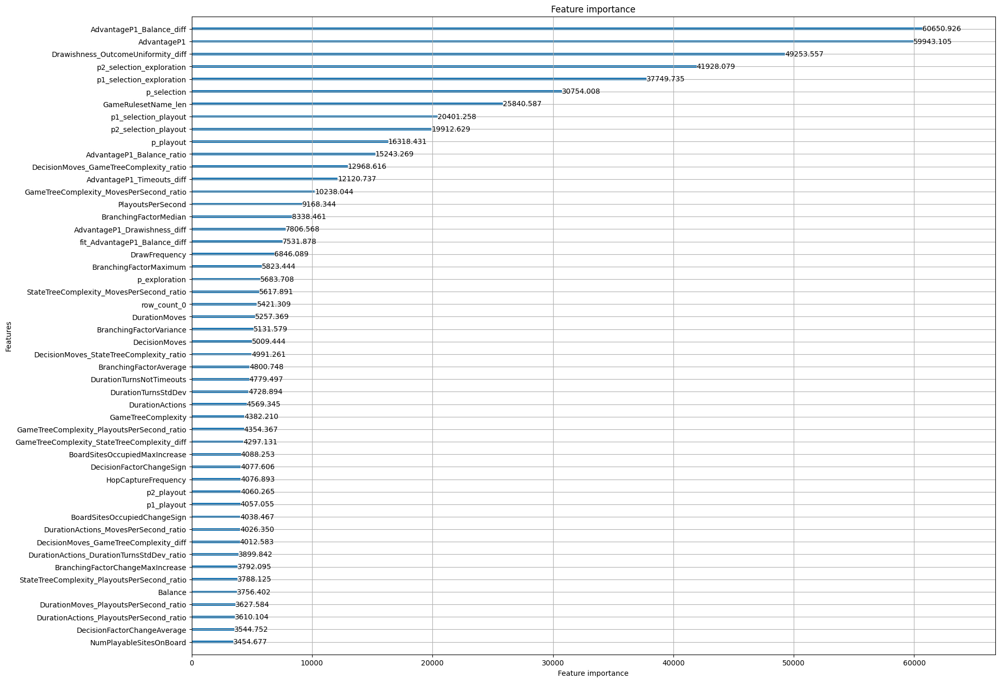

 20%|██        | 1/5 [03:49<15:16, 229.03s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.187984 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 36025
[LightGBM] [Info] Number of data points in the train set: 194252, number of used features: 571
[LightGBM] [Info] Start training from score 0.041465
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[5395]	training's rmse: 0.207551	valid_1's rmse: 0.421009
Fold 2 Test RMSE: 0.421


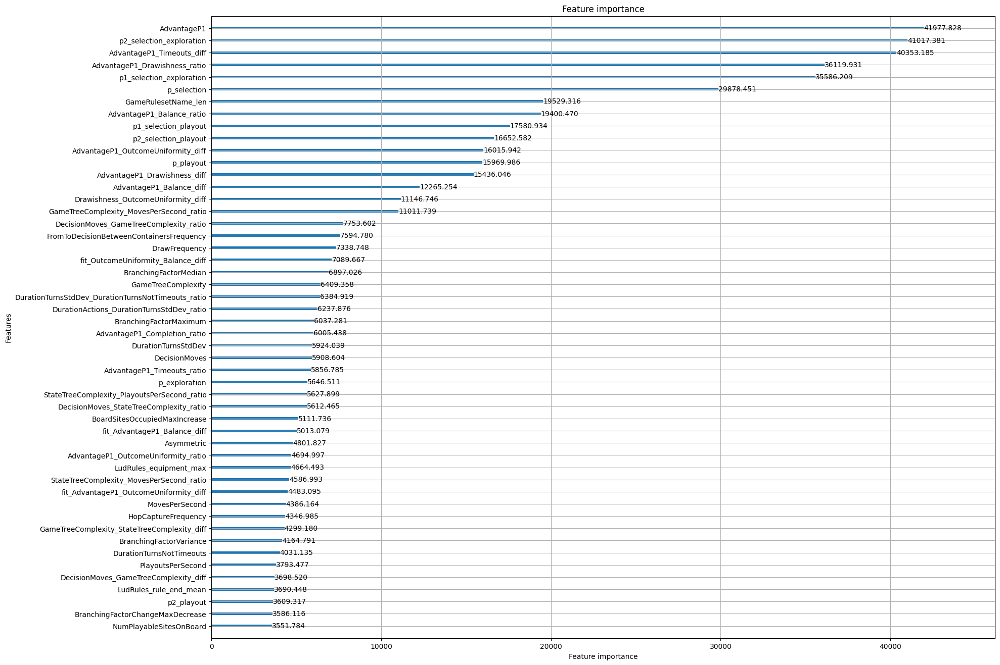

 40%|████      | 2/5 [07:21<10:58, 219.55s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.125509 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 35828
[LightGBM] [Info] Number of data points in the train set: 189248, number of used features: 571
[LightGBM] [Info] Start training from score 0.040007
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[6523]	training's rmse: 0.195704	valid_1's rmse: 0.420716
Fold 3 Test RMSE: 0.420


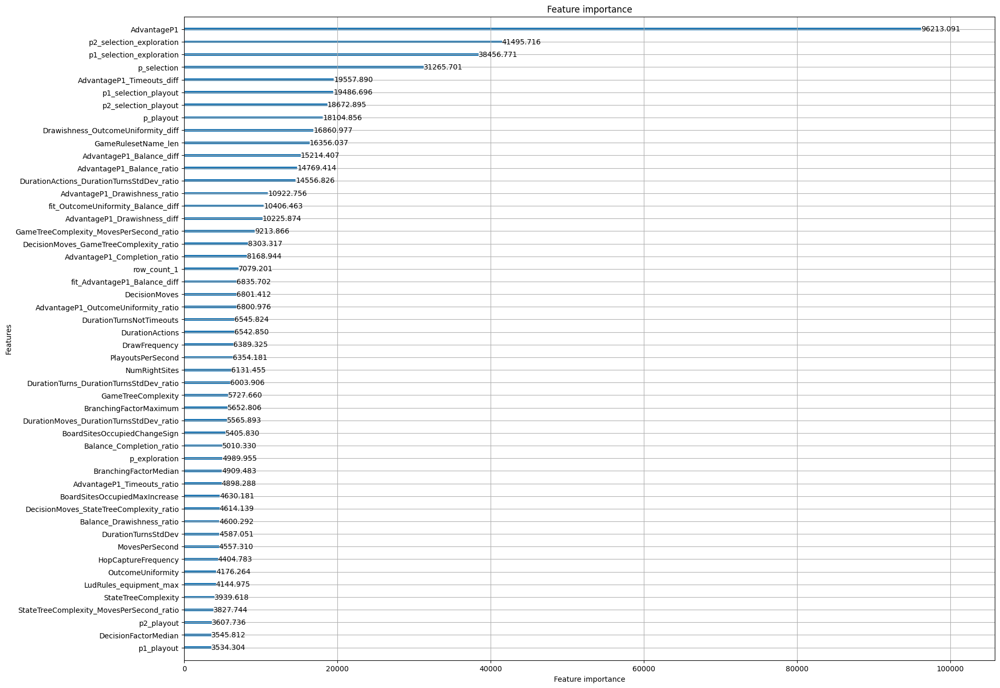

 60%|██████    | 3/5 [11:32<07:46, 233.50s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.118216 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 35891
[LightGBM] [Info] Number of data points in the train set: 190972, number of used features: 569
[LightGBM] [Info] Start training from score 0.053582
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[5437]	training's rmse: 0.205483	valid_1's rmse: 0.408201
Fold 4 Test RMSE: 0.408


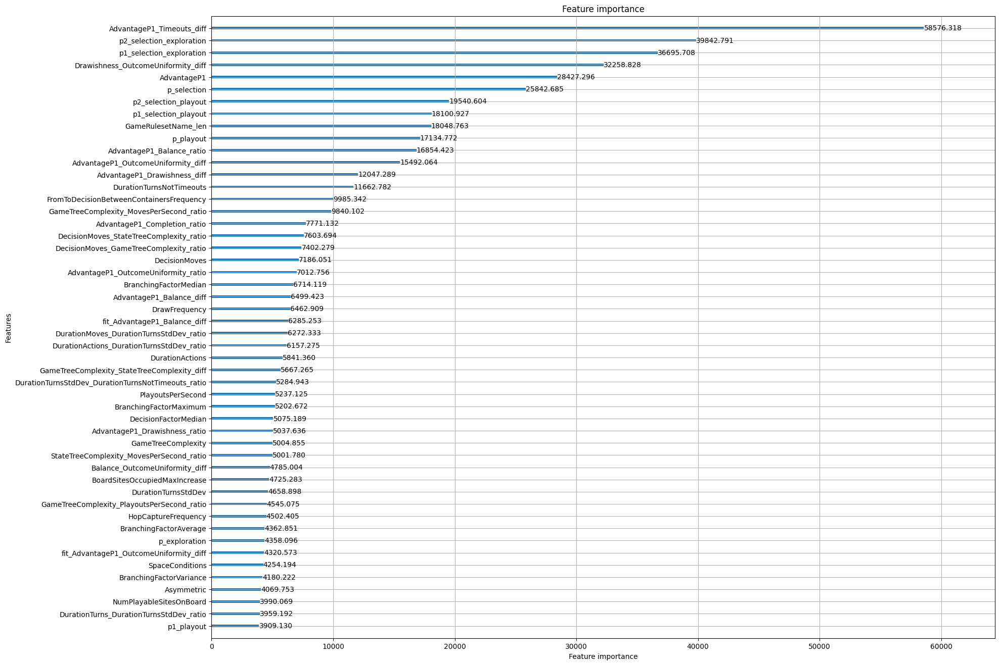

 80%|████████  | 4/5 [15:03<03:44, 224.83s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.125704 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 35405
[LightGBM] [Info] Number of data points in the train set: 164822, number of used features: 570
[LightGBM] [Info] Start training from score 0.035321
Fold 5 Test RMSE: 0.565


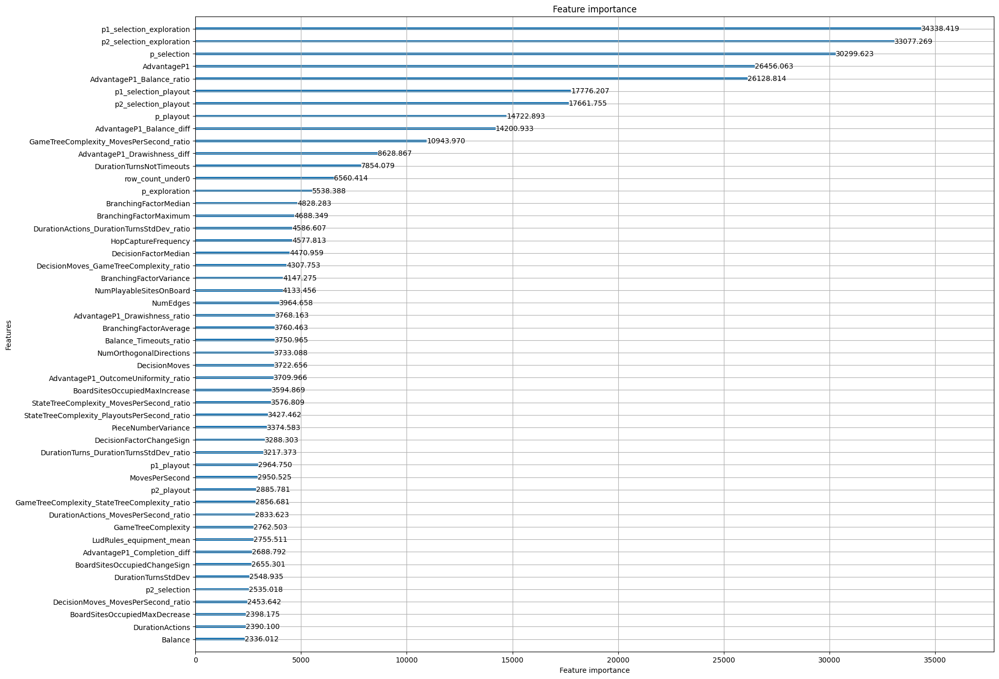

100%|██████████| 5/5 [17:24<00:00, 208.83s/it]


--- Final Mean Scores ---
Mean Test RMSE: 0.449

=== KFold RMSE Results ===
   Fold  Test RMSE
0     1   0.429996
1     2   0.420729
2     3   0.420422
3     4   0.407550
4     5   0.564988


In [ ]:
# from multiprocessing import Pool, cpu_count
# train = pl.read_csv("/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/train.csv")
# # # train = undersample(train,samplenum=30000)
# train = get_fold(train,random_state = 16)
# # # train = extract_from_engrule(train)
# train = extract_game_name(train)
# train = remove_useless(train,nomean_cols,freq_cols,duplicate_cols)
# train = get_row_feature(train)
# # train = create_category_sum(train)
# train = split_rule(train)
# train = make_rule_features(train)
# train = process_agent_cols(train)
# train = add_agentcol(train)
# # train = drop_col_almostnomean(train)
# train = feature_domain(train)
# train = normalize_columns(train)
# # train = feature_engineering(train)
# from catboost import CatBoostRegressor, Pool,CatBoostClassifier
a = TrainML_lgb(train)

# catboost

### 前処理

In [ ]:
for fold in tqdm(range(5)):

    train_df = train[train["fold"] != fold]
    test_df = train[train["fold"] == fold]


    X_train = train_df.drop("fold", axis=1)
    y_train = train_df["utility_agent1"]
    X_test = test_df.drop("fold", axis=1)
    y_test = test_df['utility_agent1']

    # # weightをだしたい
    # weights = list(np.abs(y_train).apply(lambda x : x if x >= 0.9 else 0.9 ))

    numeric_features = X_train.select_dtypes(include=['number']).columns

    scaler = StandardScaler()
    X_train[numeric_features] = scaler.fit_transform(X_train[numeric_features])
    X_test[numeric_features] = scaler.transform(X_test[numeric_features])

    kmeans = KMeans(n_clusters=15, random_state=42)
    labels = kmeans.fit_predict(X_train[cluster_column])
    X_train["cluster"] = labels

    X_test["cluster"] = kmeans.predict(X_test[cluster_column])

    X_train["cluster"] = X_train["cluster"].astype("category")
    X_test["cluster"] = X_test["cluster"].astype("category")

    X_train,target_mean_list = get_target_encoding_cluster_train(X_train)
    X_test = get_target_encoding_cluster_test(X_test,target_mean_list)

    filename = f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/prepro/scaler_fold{fold}.pickle"
    with open(filename, mode='wb') as fp:
            pickle.dump(scaler, fp)

    filename = f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/prepro/kmeans_fold{fold}.pickle"
    with open(filename, mode='wb') as fp:
            pickle.dump(kmeans, fp)

    filename = f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/prepro/map_fold{fold}.pickle"
    with open(filename, mode='wb') as fp:
            pickle.dump(target_mean_list, fp)

100%|██████████| 5/5 [00:39<00:00,  7.84s/it]


### 学習

In [ ]:
# catboost
from catboost import CatBoostRegressor, Pool,CatBoostClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

n_splits = 5
SEED = 2

def TrainML_cb(train,seed):


    # params = {"iterations": 10000,'depth': 10, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'l2_leaf_reg': 2.8902767522284805, 'random_strength': 0.7891260519451808, 'subsample': 0.7240613083358142,"learning_rate": 0.05, "loss_function": 'RMSE',
    #         "eval_metric": 'RMSE',"random_seed": 0,"verbose": 200,"task_type": "GPU",}


    # params_2nd = {"iterations": 10000,'depth': 9, 'bootstrap_type': 'Bernoulli', 'l2_leaf_reg': 9, 'subsample': 0.7,
    #           "learning_rate": 0.05, "loss_function": 'RMSE',"eval_metric": 'RMSE',"random_seed": SEED,"verbose": 200,"task_type": "GPU"}

    # params_2nd_fold4 = {"iterations": 4000,'depth': 9, 'bootstrap_type': 'Bernoulli', 'l2_leaf_reg': 9, 'subsample': 0.7,
    #           "learning_rate": 0.05, "loss_function": 'RMSE',"eval_metric": 'RMSE',"random_seed": SEED,"verbose": 200,"task_type": "GPU","use_best_model":False}

    params_2nd = {"iterations": 10000,'depth': 10, 'bootstrap_type': 'Bayesian', 'l2_leaf_reg': 11, 'random_strength': 0.7,'bagging_temperature':0.4,
               "loss_function": 'RMSE',"eval_metric": 'RMSE',"random_seed": SEED,"verbose": 200,"task_type": "GPU"}

    params_2nd_fold4 = {"iterations": 4000,'depth': 10, 'bootstrap_type': 'Bayesian','l2_leaf_reg': 11, 'random_strength': 0.7,'bagging_temperature':0.4,
               "loss_function": 'RMSE',"eval_metric": 'RMSE',"random_seed": SEED,"verbose": 200,"task_type": "GPU","use_best_model":False}



    test_rmse_scores = []
    trained_models = []
    test_df_list = []
    train_df_list = []

    for fold in tqdm(range(5)):

        train_df = train[train["fold"] != fold]
        test_df = train[train["fold"] == fold]


        X_train = train_df.drop("fold", axis=1)
        y_train = train_df["utility_agent1"]
        X_test = test_df.drop("fold", axis=1)
        y_test = test_df['utility_agent1']

        # # weightをだしたい
        # weights = list(np.abs(y_train).apply(lambda x : x if x >= 0.5 else 0.5 ))

        # 前処理に必要な関数を呼び出す
        # scaler = joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/prepro/scaler_fold{fold}.pickle")
        # kmeans = joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/prepro/kmeans_fold{fold}.pickle")
        # target_mean_list = joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/prepro/map_fold{fold}.pickle")
        # scaler = StandardScaler()
        # kmeans = KMeans(n_clusters=15, random_state=42)

        # numeric_features = X_train.select_dtypes(include=['number']).columns

        # df_train = X_train.copy()
        # df_test = X_test.copy()
        # df_train[numeric_features] = scaler.fit_transform(X_train[numeric_features])
        # df_test[numeric_features] = scaler.transform(X_test[numeric_features])

        # X_train["cluster"] = kmeans.fit_predict(df_train[cluster_column])
        # X_test["cluster"] = kmeans.predict(df_test[cluster_column])

        # X_train["cluster"] = X_train["cluster"].astype("category")
        # X_test["cluster"] = X_test["cluster"].astype("category")

        # X_train,target_mean_list = get_target_encoding_agent_train(X_train)
        # # X_train = get_target_encoding_cluster_test(X_train,target_mean_list)
        # X_test = get_target_encoding_agent_test(X_test,target_mean_list)

        X_train = X_train.drop(['utility_agent1','num_losses_agent1','num_wins_agent1', 'num_draws_agent1'], axis=1)
        X_test = X_test.drop(['utility_agent1','num_losses_agent1','num_wins_agent1', 'num_draws_agent1'], axis=1)

        # X_train = X_train[need_col]
        # X_test = X_test[need_col]
        # cat_list = list(X_train.select_dtypes(include=['object', 'category']).columns)

        # model = CatBoostRegressor(**params_2nd,cat_features = cat_list)
        # model.fit(X_train, y_train, eval_set=[(X_test, y_test)],
        #       early_stopping_rounds=100)

        # feature_names = X_train.columns.tolist()

        # pve_importances = model.get_feature_importance(data = Pool(X_train,y_train,cat_features=cat_list),type="PredictionValuesChange") # default type
        # sorted_indices = np.argsort(pve_importances)[-400:]
        # needs_cols = np.array(feature_names)[sorted_indices]
        # test_df_list.append(needs_cols)

        # X_train = X_train[needs_cols]
        # X_test = X_test[needs_cols]

        cat_list = list(X_train.select_dtypes(include=['object', 'category']).columns)

        if fold != 4:
            model = CatBoostRegressor(**params_2nd,cat_features = cat_list)
            model.fit(X_train, y_train, eval_set=[(X_test, y_test)],early_stopping_rounds=100)
        else:
            model = CatBoostRegressor(**params_2nd_fold4,cat_features = cat_list)
            model.fit(X_train, y_train, eval_set=[(X_test, y_test)])

        y_test_pred = model.predict(X_test).clip(-1,1)

        filename = f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline25/cat_model_normal_seed{SEED}_fold{fold}.pickle"
        with open(filename, mode='wb') as fp:
            pickle.dump(model, fp)

        test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
        #test_rmse = np.sqrt(mean_squared_error(y_test, rounded_values))

        test_rmse_scores.append(test_rmse)

        feature_names = X_train.columns.tolist()
        pve_importances = model.get_feature_importance(data = Pool(X_train,y_train,cat_features=cat_list),type="PredictionValuesChange") # default type
        sorted_indices = np.argsort(pve_importances)[-50:]
        plt.figure(figsize=(20, 16))
        plt.barh(np.array(feature_names)[sorted_indices], pve_importances[sorted_indices])
        plt.xlabel('Importance')
        plt.ylabel('Feature')
        plt.title('Sorted Prediction Values Change (PVE) Feature Importance')
        plt.show()

        needcol = np.array(feature_names)[np.argsort(pve_importances)[-200:]]
        test_df_list.append(y_test_pred)
        test_df_list.append(y_test)
        y_train_pred = model.predict(X_train).clip(-1,1)
        train_df_list.append(y_train_pred)
        train_df_list.append(y_train)

        print(f"Fold {fold+1} Test RMSE: {test_rmse:.3f}")


    print("\n--- Final Mean Scores ---")
    print(f"Mean Test RMSE: {np.mean(test_rmse_scores)}")
    results_df = pd.DataFrame({
        'Fold': np.arange(1, n_splits+1),
        'Test RMSE': test_rmse_scores
    })

    print("\n=== KFold RMSE Results ===")
    print(results_df)

    return test_df_list,train_df_list

### パラメータチューニング

In [ ]:
! pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 364.4/364.4 kB 19.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 22.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 8.1 MB/s eta 0:00:00


In [ ]:
# train = pl.read_csv("/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/train_fold.csv")
# # train = undersample(train,samplenum=30000)
# # train = get_fold(train,random_state = 42)
# # train = extract_from_engrule(train)
# train = extract_game_name(train)
# train = remove_useless(train,nomean_cols,freq_cols)
# train = create_category(train,category_list, addcat_list)
# train = create_category_sum(train)
# train = split_rule(train)
# train = make_rule_features(train)
# train = drop_cols_conceptwise(train, concept)
# train = process_agent_cols(train)
# train = add_agentcol(train)
# train = feature_engineering(train)
# # train = drop_col_almostnomean(train)
# # train = create_bin(train)
# # train = svd_feature(train)

100%|██████████| 233234/233234 [01:03<00:00, 3658.38it/s]


In [ ]:
import optuna
from catboost import CatBoostRegressor, Pool,CatBoostClassifier

cat_list = list(train.select_dtypes(include=['object', 'category']).columns)

def objective_cat(trial):
    train_df = train[train["fold"] != 0]
    test_df = train[train["fold"] == 0]

    # remove_encoded = [f"agent_pair_encoded_fold{i}" for i in range(5) ]
    drop_cols = ["fold"]#+remove_encoded


    X_train = train_df.drop(drop_cols, axis=1)
    y_train = train_df['utility_agent1']
    X_test = test_df.drop(drop_cols, axis=1)
    y_test = test_df['utility_agent1']
    X_train = X_train.drop(['utility_agent1','num_losses_agent1','num_wins_agent1', 'num_draws_agent1'], axis=1)
    X_test = X_test.drop(['utility_agent1','num_losses_agent1','num_wins_agent1', 'num_draws_agent1'], axis=1)
    params = {
        'random_seed': 0,
        'loss_function': 'RMSE',
        'eval_metric': 'RMSE',
        'iterations': 4000,
        'verbose': False,
        'depth': 10,
        # 'boosting_type': trial.suggest_categorical('boosting_type', ['Ordered', 'Plain']),
        'bootstrap_type': trial.suggest_categorical(
            'bootstrap_type', ['Bayesian']
        ),
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 5, 20),
        'random_strength': trial.suggest_float('random_strength', 0.1, 10),
        "task_type": "GPU",
    }
    if params['bootstrap_type'] == 'Bayesian':
        params['bagging_temperature'] = trial.suggest_float('bagging_temperature', 0, 2)
    elif params['bootstrap_type'] == 'Bernoulli':
        params['subsample'] = trial.suggest_float('subsample', 0.1, 1)
    clf = CatBoostRegressor(**params,cat_features=cat_list)
    clf.fit(X_train, y_train,early_stopping_rounds=100,eval_set=[(X_test, y_test)])
    preds = clf.predict(X_test)
    test_rmse = np.sqrt(mean_squared_error(y_test, preds))
    return test_rmse

study_cat = optuna.create_study(direction='minimize')
study_cat.optimize(objective_cat, n_trials=100, timeout=600000)

[I 2024-11-18 11:17:13,067] A new study created in memory with name: no-name-99992fd2-7a13-407b-8b10-eff0565efcbe
[I 2024-11-18 11:23:04,910] Trial 0 finished with value: 0.4287326636580034 and parameters: {'bootstrap_type': 'Bayesian', 'l2_leaf_reg': 7.230876583160955, 'random_strength': 1.251502035423524, 'bagging_temperature': 0.963522233603124}. Best is trial 0 with value: 0.4287326636580034.
[I 2024-11-18 11:28:55,689] Trial 1 finished with value: 0.43329765126527586 and parameters: {'bootstrap_type': 'Bayesian', 'l2_leaf_reg': 16.63371242935401, 'random_strength': 2.0128907749438576, 'bagging_temperature': 1.691018337240477}. Best is trial 0 with value: 0.4287326636580034.
[I 2024-11-18 11:34:44,874] Trial 2 finished with value: 0.4342482564316228 and parameters: {'bootstrap_type': 'Bayesian', 'l2_leaf_reg': 16.517137329533483, 'random_strength': 9.118152291679925, 'bagging_temperature': 1.4640113629965723}. Best is trial 0 with value: 0.4287326636580034.
[I 2024-11-18 11:40:34,9

KeyboardInterrupt: 

### 学習

In [ ]:
from multiprocessing import Pool, cpu_count
train = pl.read_csv("/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/train.csv")
# # train = undersample(train,samplenum=30000)
train = get_fold(train,random_state = 7)
# train = extract_from_engrule(train,50)
train = get_addrulefeature(train)
train = extract_game_name(train)
train = remove_useless(train,nomean_cols,freq_cols,duplicate_cols)
train = get_row_feature(train)
# train = get_outlier(train)
# train = create_category_sum(train)
train = split_rule(train)
train = make_rule_features(train)
train = process_agent_cols(train)
train = add_agentcol(train)
# train = drop_col_almostnomean(train)
train = feature_domain(train)
train = normalize_columns(train)
train = feature_engineering(train)
from catboost import CatBoostRegressor, Pool,CatBoostClassifier
# a,b = TrainML_cb(train,42)

100%|██████████| 233234/233234 [01:04<00:00, 3602.49it/s]


In [ ]:
drop = [ 'p1_selection_playout','p2_selection_playout','p1_selection_exploration','p2_selection_exploration','diff_exploration', 'AdvantageP1_Balance_ratio',
 'AdvantageP1_Balance_diff','AdvantageP1_Completion_ratio','AdvantageP1_Completion_diff','AdvantageP1_Drawishness_ratio','AdvantageP1_Drawishness_diff',
 'AdvantageP1_Timeouts_ratio','AdvantageP1_Timeouts_diff','AdvantageP1_OutcomeUniformity_ratio','AdvantageP1_OutcomeUniformity_diff','Balance_Completion_ratio',
 'Balance_Completion_diff','Balance_Drawishness_ratio','Balance_Drawishness_diff','Balance_Timeouts_ratio','Balance_Timeouts_diff','Balance_OutcomeUniformity_ratio',
 'Balance_OutcomeUniformity_diff','Completion_Drawishness_ratio','Completion_Drawishness_diff','Completion_Timeouts_ratio','Completion_Timeouts_diff','Completion_OutcomeUniformity_ratio',
 'Completion_OutcomeUniformity_diff','Drawishness_Timeouts_ratio','Drawishness_Timeouts_diff','Drawishness_OutcomeUniformity_ratio','Drawishness_OutcomeUniformity_diff']

In [ ]:
df = train.drop(drop,axis=1)

  0%|          | 0/5 [00:00<?, ?it/s]

0:	learn: 0.6273374	test: 0.5623439	best: 0.5623439 (0)	total: 110ms	remaining: 18m 17s
200:	learn: 0.3761896	test: 0.4655883	best: 0.4655883 (200)	total: 14.3s	remaining: 11m 34s
400:	learn: 0.3355627	test: 0.4519935	best: 0.4519935 (400)	total: 28.2s	remaining: 11m 14s
600:	learn: 0.3111895	test: 0.4458658	best: 0.4458658 (600)	total: 42.2s	remaining: 10m 59s
800:	learn: 0.2940884	test: 0.4415413	best: 0.4415413 (800)	total: 56s	remaining: 10m 43s
1000:	learn: 0.2825709	test: 0.4390755	best: 0.4390755 (1000)	total: 1m 9s	remaining: 10m 27s
1200:	learn: 0.2732807	test: 0.4373438	best: 0.4373358 (1199)	total: 1m 23s	remaining: 10m 12s
1400:	learn: 0.2660281	test: 0.4362598	best: 0.4362598 (1400)	total: 1m 37s	remaining: 9m 57s
1600:	learn: 0.2593647	test: 0.4351753	best: 0.4351753 (1600)	total: 1m 51s	remaining: 9m 43s
1800:	learn: 0.2535915	test: 0.4342008	best: 0.4341777 (1790)	total: 2m 5s	remaining: 9m 30s
2000:	learn: 0.2485566	test: 0.4335586	best: 0.4335555 (1999)	total: 2m 19s	

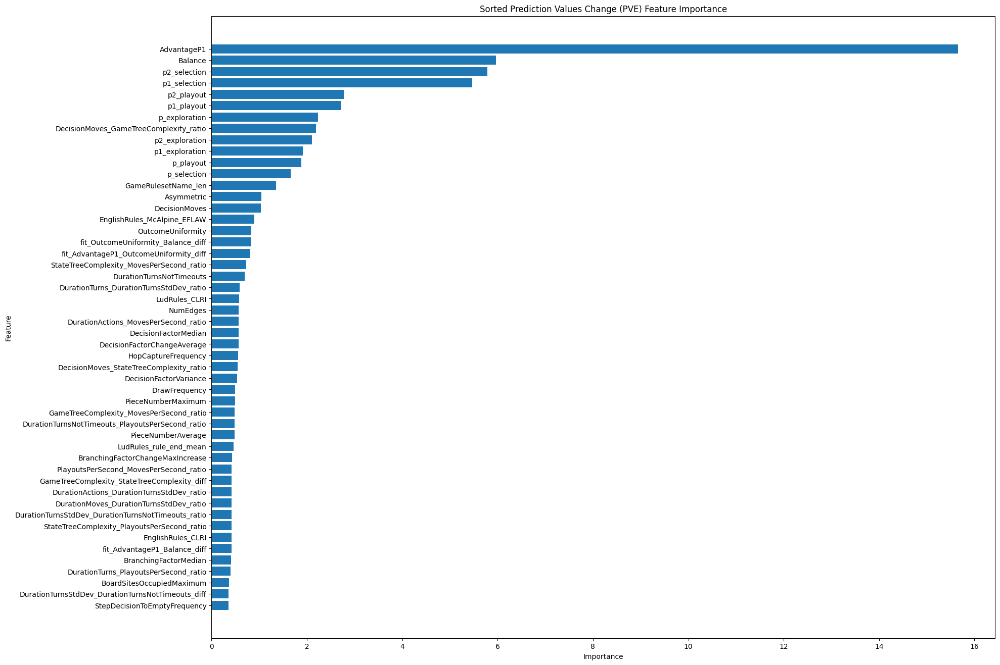

 20%|██        | 1/5 [09:11<36:44, 551.04s/it]

Fold 1 Test RMSE: 0.429
0:	learn: 0.6208188	test: 0.5955513	best: 0.5955513 (0)	total: 105ms	remaining: 17m 32s
200:	learn: 0.3739376	test: 0.4614949	best: 0.4614949 (200)	total: 14.3s	remaining: 11m 36s
400:	learn: 0.3299757	test: 0.4396042	best: 0.4396042 (400)	total: 28.4s	remaining: 11m 18s
600:	learn: 0.3063475	test: 0.4305733	best: 0.4305733 (600)	total: 42.4s	remaining: 11m 3s
800:	learn: 0.2902376	test: 0.4248337	best: 0.4248337 (800)	total: 56.4s	remaining: 10m 47s
1000:	learn: 0.2791879	test: 0.4219427	best: 0.4219427 (1000)	total: 1m 10s	remaining: 10m 29s
1200:	learn: 0.2705616	test: 0.4200861	best: 0.4200861 (1200)	total: 1m 23s	remaining: 10m 13s
1400:	learn: 0.2631152	test: 0.4186180	best: 0.4186147 (1396)	total: 1m 37s	remaining: 9m 58s
1600:	learn: 0.2569745	test: 0.4172974	best: 0.4172974 (1600)	total: 1m 51s	remaining: 9m 43s
1800:	learn: 0.2516590	test: 0.4163693	best: 0.4163650 (1798)	total: 2m 5s	remaining: 9m 29s
2000:	learn: 0.2463879	test: 0.4157082	best: 0.415

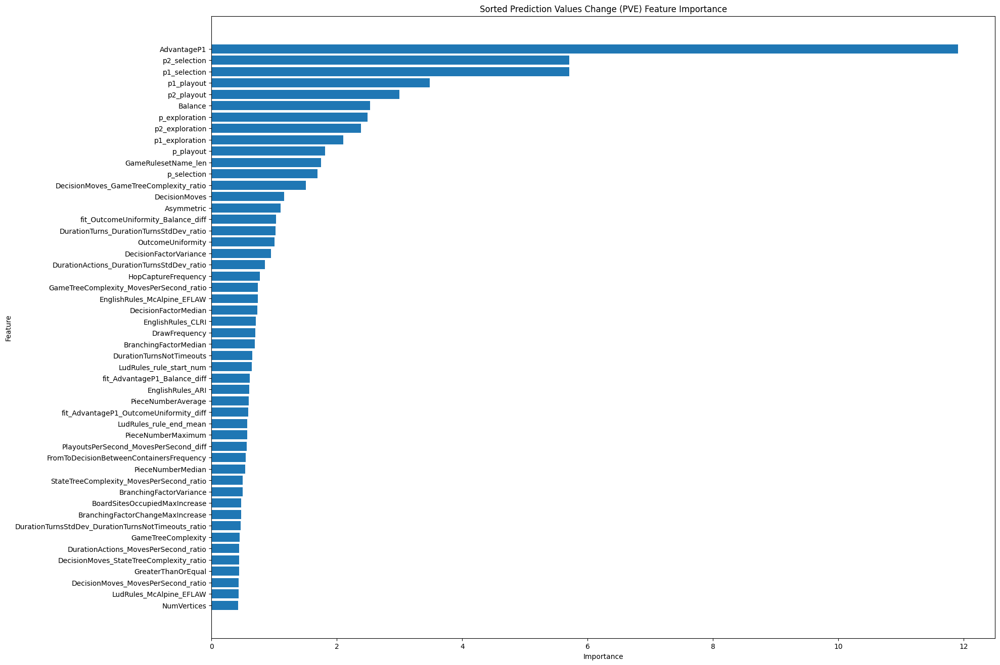

 40%|████      | 2/5 [18:11<27:14, 544.67s/it]

Fold 2 Test RMSE: 0.410
0:	learn: 0.6286345	test: 0.5610842	best: 0.5610842 (0)	total: 110ms	remaining: 18m 17s
200:	learn: 0.3754900	test: 0.4609658	best: 0.4609658 (200)	total: 13.9s	remaining: 11m 16s
400:	learn: 0.3304298	test: 0.4438018	best: 0.4438018 (400)	total: 27.6s	remaining: 10m 59s
600:	learn: 0.3051905	test: 0.4362854	best: 0.4362854 (600)	total: 41.5s	remaining: 10m 48s
800:	learn: 0.2889629	test: 0.4319833	best: 0.4319833 (800)	total: 55.3s	remaining: 10m 35s
1000:	learn: 0.2777223	test: 0.4294501	best: 0.4294501 (1000)	total: 1m 8s	remaining: 10m 19s
1200:	learn: 0.2691913	test: 0.4278782	best: 0.4278782 (1200)	total: 1m 22s	remaining: 10m 3s
1400:	learn: 0.2614335	test: 0.4266562	best: 0.4266525 (1399)	total: 1m 36s	remaining: 9m 49s
1600:	learn: 0.2551354	test: 0.4258499	best: 0.4258481 (1598)	total: 1m 49s	remaining: 9m 35s
1800:	learn: 0.2491053	test: 0.4248891	best: 0.4248891 (1800)	total: 2m 3s	remaining: 9m 22s
2000:	learn: 0.2439835	test: 0.4240851	best: 0.4240

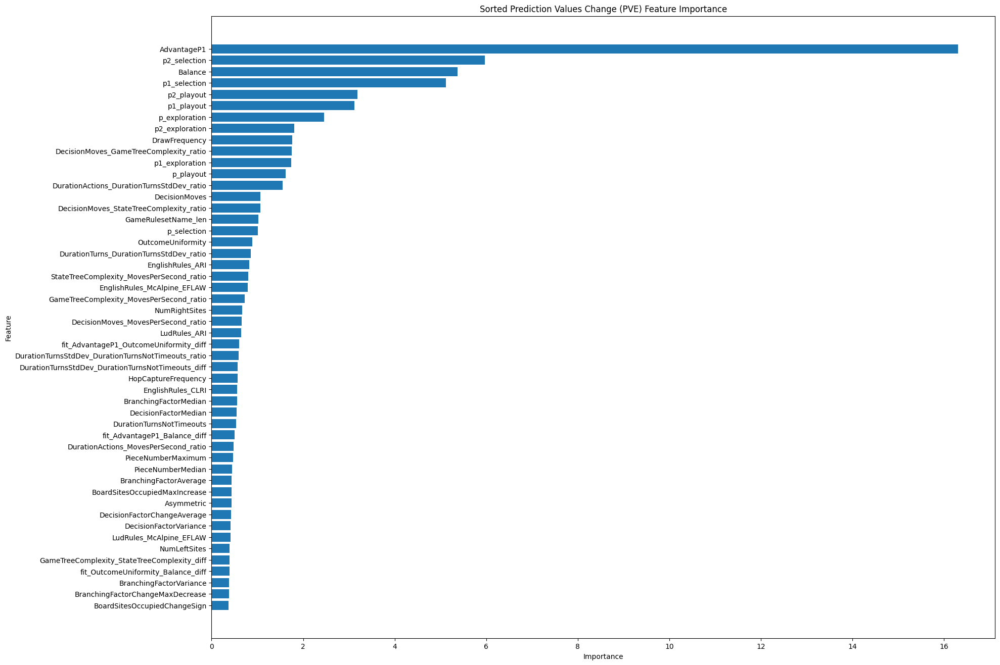

 60%|██████    | 3/5 [24:45<15:52, 476.13s/it]

Fold 3 Test RMSE: 0.420
0:	learn: 0.6201292	test: 0.6012383	best: 0.6012383 (0)	total: 104ms	remaining: 17m 20s
200:	learn: 0.3744422	test: 0.4578650	best: 0.4578650 (200)	total: 14s	remaining: 11m 22s
400:	learn: 0.3337486	test: 0.4368566	best: 0.4368566 (400)	total: 27.6s	remaining: 10m 59s
600:	learn: 0.3092499	test: 0.4274326	best: 0.4274326 (600)	total: 41.4s	remaining: 10m 47s
800:	learn: 0.2923957	test: 0.4219856	best: 0.4219856 (800)	total: 55.1s	remaining: 10m 32s
1000:	learn: 0.2808978	test: 0.4189754	best: 0.4189754 (1000)	total: 1m 8s	remaining: 10m 16s
1200:	learn: 0.2714260	test: 0.4167529	best: 0.4167529 (1200)	total: 1m 22s	remaining: 10m 2s
1400:	learn: 0.2634538	test: 0.4147425	best: 0.4147425 (1400)	total: 1m 36s	remaining: 9m 49s
1600:	learn: 0.2569583	test: 0.4134538	best: 0.4134413 (1599)	total: 1m 49s	remaining: 9m 35s
1800:	learn: 0.2510869	test: 0.4123702	best: 0.4123639 (1799)	total: 2m 3s	remaining: 9m 22s
2000:	learn: 0.2460127	test: 0.4114108	best: 0.411410

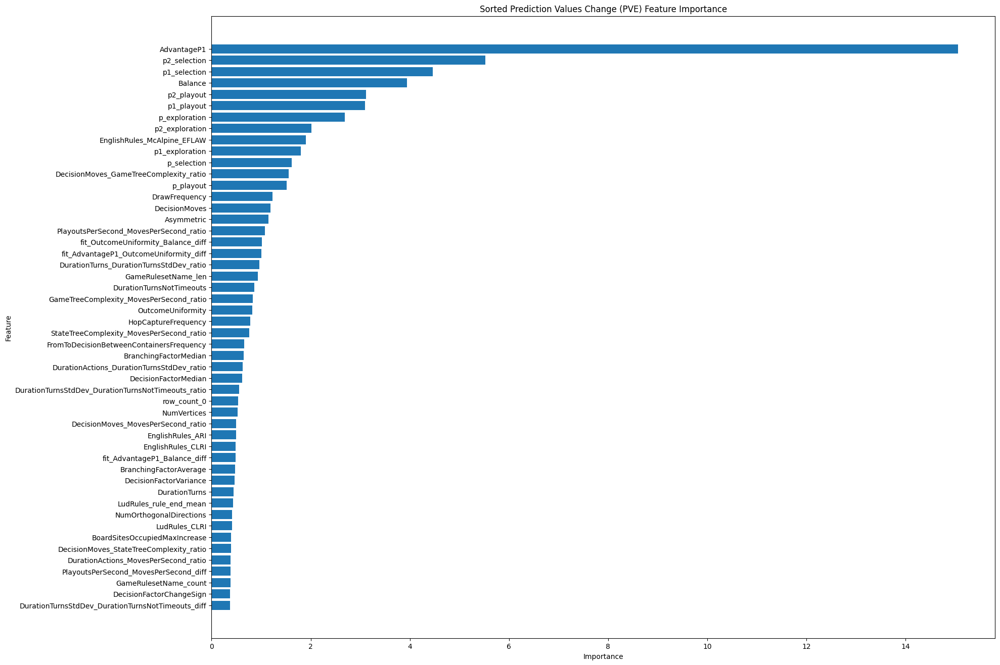

 80%|████████  | 4/5 [34:02<08:27, 507.84s/it]

Fold 4 Test RMSE: 0.406
0:	learn: 0.5771614	test: 0.7082032	best: 0.7082032 (0)	total: 120ms	remaining: 7m 59s
200:	learn: 0.3832245	test: 0.5894768	best: 0.5894768 (200)	total: 13.3s	remaining: 4m 10s
400:	learn: 0.3427381	test: 0.5835403	best: 0.5835291 (396)	total: 26.3s	remaining: 3m 55s
600:	learn: 0.3195716	test: 0.5815726	best: 0.5815481 (597)	total: 39.2s	remaining: 3m 41s
800:	learn: 0.3044332	test: 0.5811236	best: 0.5810619 (723)	total: 52.2s	remaining: 3m 28s
1000:	learn: 0.2938372	test: 0.5803141	best: 0.5802837 (900)	total: 1m 4s	remaining: 3m 14s
1200:	learn: 0.2855716	test: 0.5803437	best: 0.5801953 (1110)	total: 1m 17s	remaining: 3m
1400:	learn: 0.2782722	test: 0.5800120	best: 0.5799454 (1339)	total: 1m 29s	remaining: 2m 46s
1600:	learn: 0.2712675	test: 0.5797445	best: 0.5797445 (1600)	total: 1m 42s	remaining: 2m 34s
1800:	learn: 0.2651289	test: 0.5796742	best: 0.5796588 (1793)	total: 1m 56s	remaining: 2m 21s
2000:	learn: 0.2595483	test: 0.5797697	best: 0.5796588 (1793)

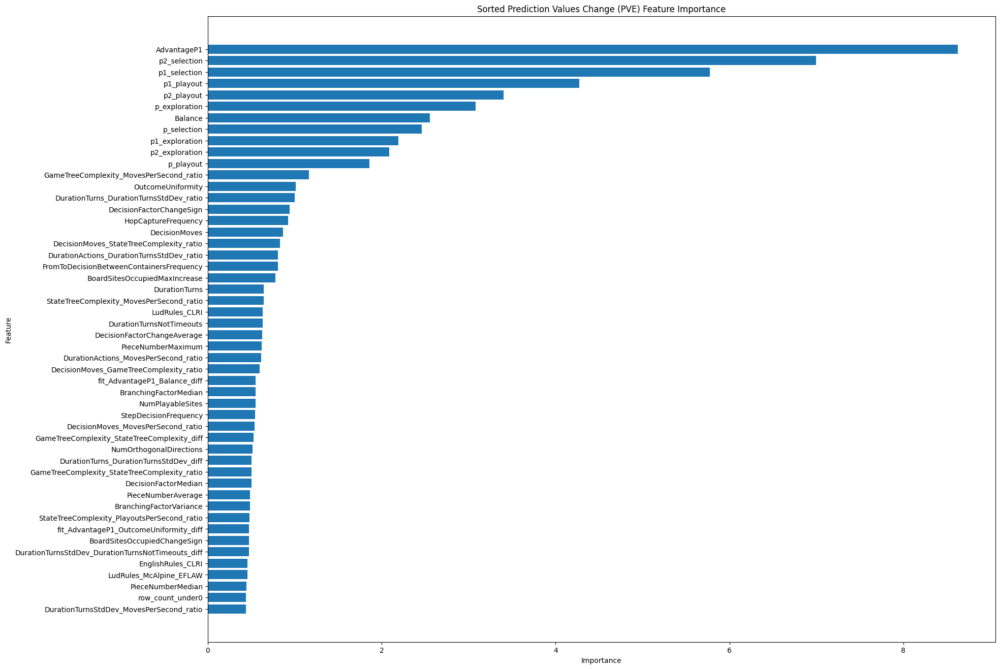

100%|██████████| 5/5 [38:51<00:00, 466.24s/it]

Fold 5 Test RMSE: 0.579

--- Final Mean Scores ---
Mean Test RMSE: 0.44872967080359827

=== KFold RMSE Results ===
   Fold  Test RMSE
0     1   0.428728
1     2   0.410034
2     3   0.420070
3     4   0.405753
4     5   0.579063


In [ ]:
a,b = TrainML_cb(df,42)

(array([ 379.,  171.,  160.,  149.,  187.,  206.,  251.,  292.,  312.,
         352.,  408.,  447.,  454.,  497.,  559.,  670.,  750.,  803.,
         935., 1108., 1223., 1458., 1698., 2058., 2318., 2284., 2213.,
        1966., 1695., 1418., 1282., 1098.,  957.,  855.,  799.,  639.,
         635.,  581.,  544.,  531.,  575.,  522.,  474.,  444.,  357.,
         321.,  276.,  206.,  168.,  297.]),
 array([-1.  , -0.96, -0.92, -0.88, -0.84, -0.8 , -0.76, -0.72, -0.68,
        -0.64, -0.6 , -0.56, -0.52, -0.48, -0.44, -0.4 , -0.36, -0.32,
        -0.28, -0.24, -0.2 , -0.16, -0.12, -0.08, -0.04,  0.  ,  0.04,
         0.08,  0.12,  0.16,  0.2 ,  0.24,  0.28,  0.32,  0.36,  0.4 ,
         0.44,  0.48,  0.52,  0.56,  0.6 ,  0.64,  0.68,  0.72,  0.76,
         0.8 ,  0.84,  0.88,  0.92,  0.96,  1.  ]),
 <BarContainer object of 50 artists>)

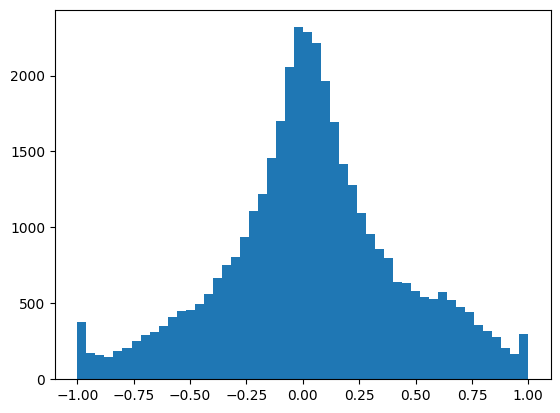

In [ ]:
plt.hist(a[2],bins=50)
# plt.hist(a[3],bins=50)

## 小実験

In [ ]:
from skimage.exposure import match_histograms
corrected_predictions = match_histograms(a[0],a[1].values)

In [ ]:
def stretch_arctanh(predictions, scale=0.9):
    # 値を [-scale, scale] の範囲に収める
    predictions = np.clip(predictions, -scale, scale)
    return np.arctanh(predictions) / np.arctanh(scale)

# 使用例
# transformed_predictions = stretch_arctanh(predictions, scale=0.9)

# 使用例
# transformed_predictions = custom_flatten(predictions, alpha=0.5, beta=1.5)
# 1 1 2 1.2 3

print(np.sqrt(mean_squared_error(a[2],a[3])))
# for r in range(1,20):

corrected_predictions = stretch_arctanh(a[2], scale=1.1)
print(np.sqrt(mean_squared_error(a[3], corrected_predictions)))

0.40924242847181846


ValueError: Input contains NaN.

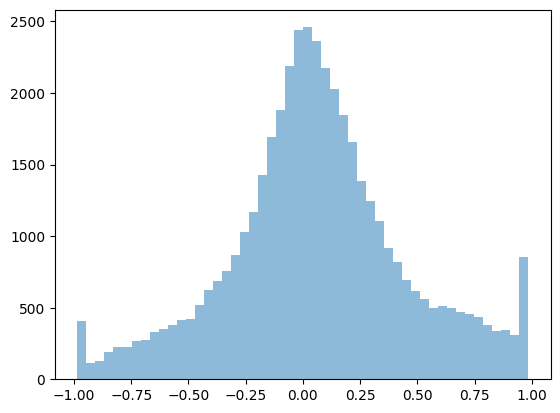

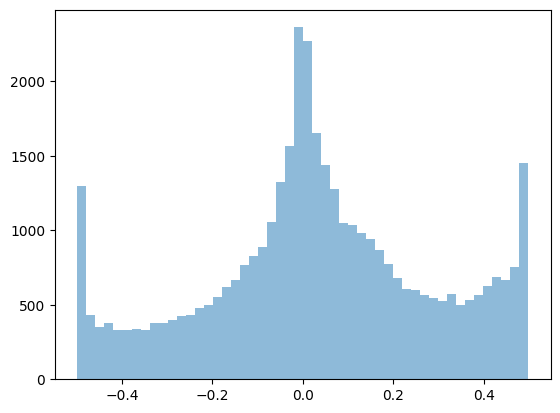

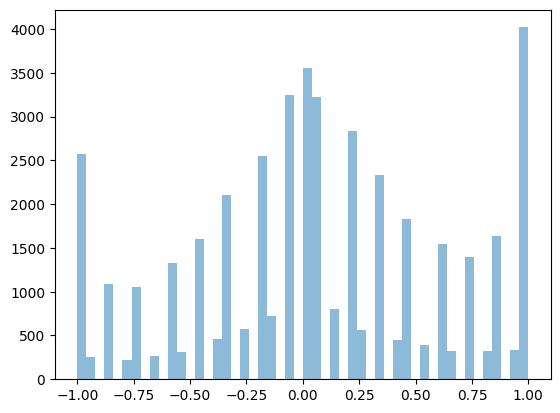

In [ ]:
# plt.hist(b[0], bins=30, alpha=0.5,)
# plt.show()
# plt.hist(b[1], bins=30, alpha=0.5,)
# plt.show()
plt.hist(a[4], bins=50, alpha=0.5,)
plt.show()
plt.hist(corrected_predictions, bins=50, alpha=0.5,)
plt.show()
plt.hist(a[5], bins=50, alpha=0.5,)
plt.show()
# for i in range(1,10):
#     print(np.sqrt(mean_squared_error(a[0].clip(-1 + i/100,1), a[1])))

In [ ]:
c = pd.DataFrame({"a" : a[0],"b":a[1]})
c.to_csv("testes.csv")

In [ ]:
c["diff"] = (np.abs(c["b"] - c["a"]))**2

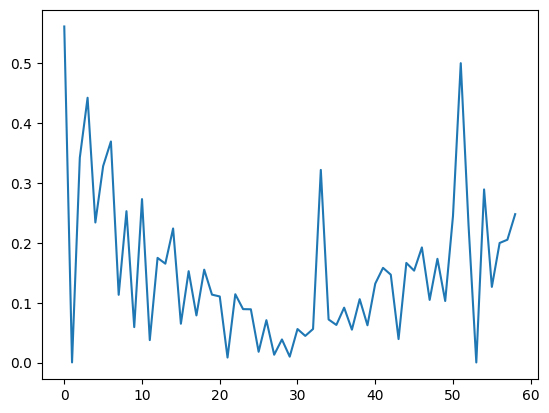

In [ ]:
d = c.groupby("b")["diff"].mean()
plt.plot(list(d))

# XGBOOST

In [ ]:
import xgboost as xgb

SEED = 42
n_splits = 5

xgb_params={'random_state': 43, 'n_estimators': 10000, 'learning_rate': 0.05, 'max_depth': 10,
              'tree_method':'gpu_hist','objective': 'reg:squarederror','eval_metric': 'rmse','verbosity': 3,"early_stopping_rounds":100,
              "enable_categorical": True,
            }

def TrainML_xgb(train):


    test_rmse_scores = []
    trained_models = []

    for fold in tqdm(range(n_splits)):
        train_df = train[train["fold"] != fold]
        test_df = train[train["fold"] == fold]
        # remove_encoded = [f"agent_pair_encoded_fold{i}" for i in range(5) if i!=fold]
        drop_cols = ['utility_agent1',"fold",'num_losses_agent1','num_wins_agent1', 'num_draws_agent1'] #+remove_encoded


        X_train = train_df.drop(drop_cols, axis=1)
        y_train = train_df['utility_agent1']
        X_test = test_df.drop(drop_cols, axis=1)
        y_test = test_df['utility_agent1']

        dtrain = xgb.DMatrix(X_train, y_train,enable_categorical=True)
        dvalid = xgb.DMatrix(X_test, y_test,enable_categorical=True)

        model = xgb.XGBRegressor(**xgb_params)
        model.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)])

        y_test_pred = model.predict(X_test).clip(-1,1)

        test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
        #test_rmse = np.sqrt(mean_squared_error(y_test, rounded_values))

        test_rmse_scores.append(test_rmse)

        print(f"Fold {fold+1} Test RMSE: {test_rmse:.3f}")


        trained_models.append(model)

    print("\n--- Final Mean Scores ---")
    print(f"Mean Test RMSE: {np.mean(test_rmse_scores):.3f}")

    results_df = pd.DataFrame({
        'Fold': np.arange(1, n_splits+1),
        'Test RMSE': test_rmse_scores
    })

    print("\n=== KFold RMSE Results ===")
    print(results_df)

    return trained_models

In [ ]:
b = TrainML_xgb(train)

  0%|          | 0/5 [00:00<?, ?it/s]

[14:48:17] ======== Monitor (0): HostSketchContainer ========
[14:48:17] AllReduce: 0.008903s, 1 calls @ 8903us

[14:48:17] MakeCuts: 0.009209s, 1 calls @ 9209us

[14:48:18] DEBUG: /workspace/src/gbm/gbtree.cc:130: Using tree method: 5
[14:48:18] DEBUG: /workspace/src/tree/updater_gpu_hist.cu:822: [GPU Hist]: Configure
[14:48:18] ======== Monitor (0):  ========
[14:48:18] InitCompressedData: 0.001733s, 1 calls @ 1733us

[14:48:18] ======== Monitor (0):  ========
[14:48:18] InitCompressedData: 0.00042s, 1 calls @ 420us

[0]	validation_0-rmse:0.60722	validation_1-rmse:0.60841
[1]	validation_0-rmse:0.59193	validation_1-rmse:0.59932
[2]	validation_0-rmse:0.57734	validation_1-rmse:0.59112
[3]	validation_0-rmse:0.56413	validation_1-rmse:0.58378
[4]	validation_0-rmse:0.55146	validation_1-rmse:0.57676
[5]	validation_0-rmse:0.53950	validation_1-rmse:0.57065
[6]	validation_0-rmse:0.52789	validation_1-rmse:0.56397
[7]	validation_0-rmse:0.51734	validation_1-rmse:0.55969
[8]	validation_0-rmse:0.507

 20%|██        | 1/5 [01:58<07:52, 118.23s/it]

Fold 1 Test RMSE: 0.453
[14:50:16] ======== Monitor (0): HostSketchContainer ========
[14:50:16] AllReduce: 0.007932s, 1 calls @ 7932us

[14:50:16] MakeCuts: 0.008206s, 1 calls @ 8206us

[14:50:16] DEBUG: /workspace/src/gbm/gbtree.cc:130: Using tree method: 5
[14:50:16] DEBUG: /workspace/src/tree/updater_gpu_hist.cu:822: [GPU Hist]: Configure
[14:50:16] ======== Monitor (0):  ========
[14:50:16] InitCompressedData: 0.001777s, 1 calls @ 1777us

[14:50:16] ======== Monitor (0):  ========
[14:50:16] InitCompressedData: 0.000353s, 1 calls @ 353us

[0]	validation_0-rmse:0.60832	validation_1-rmse:0.60175
[1]	validation_0-rmse:0.59275	validation_1-rmse:0.59072
[2]	validation_0-rmse:0.57810	validation_1-rmse:0.58092
[3]	validation_0-rmse:0.56415	validation_1-rmse:0.57181
[4]	validation_0-rmse:0.55133	validation_1-rmse:0.56424
[5]	validation_0-rmse:0.53901	validation_1-rmse:0.55671
[6]	validation_0-rmse:0.52791	validation_1-rmse:0.54899
[7]	validation_0-rmse:0.51706	validation_1-rmse:0.54259
[8

 20%|██        | 1/5 [02:18<09:15, 138.95s/it]


KeyboardInterrupt: 

# 2stg

## 小実験

In [ ]:
params_class = {
    'learning_rate': 0.1,
    'depth':4,
    # 'early_stopping_rounds': 100,
    'loss_function': 'Logloss',
    'iterations': 1000,
    'random_seed': 23,
    "task_type": "GPU",
    "verbose": 100,
    'l2_leaf_reg': 20,
    'subsample': 0.4,
    'bootstrap_type': 'Bernoulli',
    'class_weights': [1,3.5]
}
cb_params = {"iterations": 4000,'depth': 9, 'bootstrap_type': 'Bernoulli', 'l2_leaf_reg': 9, 'subsample': 0.7,
              "learning_rate": 0.05, "loss_function": 'RMSE',"eval_metric": 'RMSE',"random_seed": 0,"verbose": 200,"task_type": "GPU"}

cat_list = list(train.select_dtypes(include=['object', 'category']).columns)

test_rmse_scores = []
trained_models = []

for fold in tqdm(range(1)):
    train_df = train[train["fold"] != fold]
    train_df["obj"] = train_df["utility_agent1"].apply(lambda x: 1 if x <= -0.9 else 0)
    test_df = train[train["fold"] == fold]
    test_df["obj"] = test_df["utility_agent1"].apply(lambda x: 1 if x <= -0.9 else 0)

    drop_cols = ["fold","obj"]

    X_train = train_df.drop(drop_cols, axis=1)
    y_train = train_df[['utility_agent1',"obj"]]
    X_test = test_df.drop(drop_cols, axis=1)
    y_test = test_df[['utility_agent1',"obj"]]

    # # 連続値の列を標準化
    X_train_num = X_train[cluster_column]
    X_test_num = X_test[cluster_column]

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train_num)

    kmeans = KMeans(n_clusters=15, random_state=42)
    labels = kmeans.fit_predict(X_train_scaled)
    X_train["cluster"] = labels

    X_test_scaled = scaler.transform(X_test_num)
    X_test["cluster"] = kmeans.predict(X_test_scaled)

    X_train["cluster"] = X_train["cluster"].astype("category")
    X_test["cluster"] = X_test["cluster"].astype("category")

    X_train,target_mean_list = get_target_encoding_cluster_train(X_train)
    X_test = get_target_encoding_cluster_test(X_test,target_mean_list)

    X_train = X_train.drop(['utility_agent1','num_losses_agent1','num_wins_agent1', 'num_draws_agent1',"cluster"], axis=1)
    # X_train_sub = X_train_sub.drop(['utility_agent1','num_losses_agent1','num_wins_agent1', 'num_draws_agent1',"cluster"], axis=1)
    X_test = X_test.drop(['utility_agent1','num_losses_agent1','num_wins_agent1', 'num_draws_agent1',"cluster"], axis=1)
    cat_list = list(X_train.select_dtypes(include=['object', 'category']).columns)

    pred_df = pd.DataFrame(X_test)
    pred_df["original_index"] = X_test.index

    y_train_1st = y_train.drop("utility_agent1", axis=1)
    # y_train_1st = y_train_1st.loc[X_train.index]
    y_test_1st = y_test.drop("utility_agent1", axis=1)

    # 1st -1, 0, 1をクリーニングする
    model = CatBoostClassifier(**params_class,cat_features = cat_list,eval_metric='F1')
    model.fit(X_train, y_train_1st, eval_set=[(X_test, y_test_1st)],
              early_stopping_rounds=100)

    y_test_pred = model.predict(X_test)

    pred_df["pred"] = y_test_pred
    pred_df["pred_prob"] = np.max(model.predict_proba(X_test), axis=1)
    pred_df["ac"] = test_df["utility_agent1"].apply(lambda x: 1 if x == -1 else 0)

  0%|          | 0/1 [00:00<?, ?it/s]

0:	learn: 0.6293321	test: 0.3896932	best: 0.3896932 (0)	total: 39.3ms	remaining: 39.2s
100:	learn: 0.8230494	test: 0.5307977	best: 0.5307977 (100)	total: 2.62s	remaining: 23.3s
200:	learn: 0.8522301	test: 0.5676340	best: 0.5677336 (198)	total: 5.12s	remaining: 20.4s
300:	learn: 0.8662655	test: 0.5730187	best: 0.5731849 (299)	total: 7.59s	remaining: 17.6s
400:	learn: 0.8735046	test: 0.5735718	best: 0.5753977 (390)	total: 10.1s	remaining: 15.1s
500:	learn: 0.8815875	test: 0.5827996	best: 0.5836834 (495)	total: 12.6s	remaining: 12.6s
bestTest = 0.5836833833
bestIteration = 495
Shrink model to first 496 iterations.


100%|██████████| 1/1 [00:23<00:00, 23.53s/it]


In [ ]:
for i in range(5,10):
    ac1 = pred_df[pred_df["ac"] == 1]
    ac0 = pred_df[pred_df["ac"] == 0]
    ac1 = ac1.select_dtypes(include=['number'])
    ac0 = ac0.select_dtypes(include=['number'])
    ac1_1 = ac1[(ac1['pred'].isin([1])) & (ac1['pred_prob'] >= i/10)]
    ac0_1 = ac0[(ac0['pred'].isin([1])) & (ac0['pred_prob'] >= i/10)]
    precision = len(ac1_1)/(len(ac1_1)+len(ac0_1))
    recall = len(ac1_1)/len(ac1)
    f1 = 2*precision*recall/(precision+recall)
    print("recall",recall)
    print("precision",precision)
    print("f1",f1)

recall 0.45279894004637294
precision 0.5854389721627409
f1 0.5106462457975345
recall 0.3888704869161974
precision 0.6558659217877095
f1 0.4882511956747764
recall 0.31798608810864526
precision 0.7191011235955056
f1 0.44097381717960504
recall 0.2514077509108976
precision 0.8040254237288136
f1 0.38304314912944737
recall 0.1576681020205366
precision 0.9066666666666666
f1 0.2686230248306997


In [ ]:
ac1["pred"].value_counts()

,count
pred,
0,1652
1,1367


In [ ]:
ac0["pred"].value_counts()

,count
pred,
0,35605
1,968


In [ ]:
ac0["pred_prob"]

36573

## 実行

In [ ]:
# catboost 2stage
%%time

SEED = 2
n_splits = 5

params_class = {
    'learning_rate': 0.05,
    'depth':9,
    # 'early_stopping_rounds': 100,
    'loss_function': 'MultiClass',
    'iterations': 1000,
    'random_seed': SEED,
    "task_type": "GPU",
    "verbose": 100,
    'l2_leaf_reg': 9,
    'subsample': 0.4,
    'bootstrap_type': 'Bernoulli',
    'class_weights': [3,3,1]
}
params_class_fold4 = {
    'learning_rate': 0.05,
    'depth':9,
    # 'early_stopping_rounds': 100,
    'loss_function': 'MultiClass',
    'iterations': 500,
    'random_seed': SEED,
    "task_type": "GPU",
    "verbose": 100,
    'l2_leaf_reg': 9,
    'subsample': 0.4,
    'bootstrap_type': 'Bernoulli',
    'class_weights': [3,3,1],
    "use_best_model":False
}
cb_params = {"iterations": 10000,'depth': 9, 'bootstrap_type': 'Bernoulli', 'l2_leaf_reg': 9, 'subsample': 0.7,
              "learning_rate": 0.05, "loss_function": 'RMSE',"eval_metric": 'RMSE',"random_seed": SEED,"verbose": 200,"task_type": "GPU"}
cb_params_fold4 = {"iterations": 3000,'depth': 9, 'bootstrap_type': 'Bernoulli', 'l2_leaf_reg': 9, 'subsample': 0.7,
              "learning_rate": 0.05, "loss_function": 'RMSE',"eval_metric": 'RMSE',"random_seed": SEED,"verbose": 200,"task_type": "GPU","use_best_model":False}


def TrainML_cb_2st(train):

    cat_list = list(train.select_dtypes(include=['object', 'category']).columns)

    test_rmse_scores = []
    trained_models = []

    for fold in tqdm(range(n_splits)):

        train_df = train[train["fold"] != fold]
        train_df["obj"] = train_df["utility_agent1"].apply(lambda x: 0 if x == -1 else (1 if x == 1 else 2))
        test_df = train[train["fold"] == fold]
        test_df["obj"] = test_df["utility_agent1"].apply(lambda x: 0 if x == -1 else (1 if x == 1 else 2))

        drop_cols = ["fold","obj"]

        X_train = train_df.drop(drop_cols, axis=1)
        y_train = train_df[['utility_agent1',"obj"]]
        X_test = test_df.drop(drop_cols, axis=1)
        y_test = test_df[['utility_agent1',"obj"]]

        # # 連続値の列を標準化
        # X_train_num = X_train[cluster_column]
        # X_test_num = X_test[cluster_column]

        # scaler = StandardScaler()
        # X_train_scaled = scaler.fit_transform(X_train_num)

        # kmeans = KMeans(n_clusters=15, random_state=42)
        # labels = kmeans.fit_predict(X_train_scaled)
        # X_train["cluster"] = labels

        # X_test_scaled = scaler.transform(X_test_num)
        # X_test["cluster"] = kmeans.predict(X_test_scaled)

        # X_train["cluster"] = X_train["cluster"].astype("category")
        # X_test["cluster"] = X_test["cluster"].astype("category")

        # X_train,target_mean_list = get_target_encoding_cluster_train(X_train)
        # X_test = get_target_encoding_cluster_test(X_test,target_mean_list)

        # X_train_sub = X_train[X_train["cluster"] != 5]

        X_train = X_train.drop(['utility_agent1','num_losses_agent1','num_wins_agent1', 'num_draws_agent1'], axis=1)
        # X_train_sub = X_train_sub.drop(['utility_agent1','num_losses_agent1','num_wins_agent1', 'num_draws_agent1',"cluster"], axis=1)
        X_test = X_test.drop(['utility_agent1','num_losses_agent1','num_wins_agent1', 'num_draws_agent1'], axis=1)
        cat_list = list(X_train.select_dtypes(include=['object', 'category']).columns)

        pred_df = pd.DataFrame(X_test)
        pred_df["original_index"] = X_test.index

        y_train_1st = y_train.drop("utility_agent1", axis=1)
        # y_train_1st = y_train_1st.loc[X_train_sub.index]
        y_test_1st = y_test.drop("utility_agent1", axis=1)

        # 1st -1, 1をクリーニングする
        if fold != 4:
            model = CatBoostClassifier(**params_class,cat_features = cat_list)
            model.fit(X_train, y_train_1st, eval_set=[(X_test, y_test_1st)],
                      early_stopping_rounds=100)
        else:
            model = CatBoostClassifier(**params_class_fold4,cat_features = cat_list)
            model.fit(X_train, y_train_1st, eval_set=[(X_test, y_test_1st)],)

        y_test_pred = model.predict(X_test)

        pred_df["pred"] = y_test_pred
        pred_df["pred_prob"] = np.max(model.predict_proba(X_test), axis=1)

        # 予測確率0.9を超えているやつは1stで予測終わり
        pred_df_1st = pred_df[(pred_df['pred'].isin([0,1])) & (pred_df['pred_prob'] >= 0.8)]
        pred_df_2st = pred_df[~((pred_df['pred'].isin([0,1])) & (pred_df['pred_prob'] >= 0.8))]

        print(pred_df_1st.shape)

        feature_names = X_train.columns.tolist()
        pve_importances = model.get_feature_importance(data = Pool(X_train,y_train_1st,cat_features=cat_list),type='PredictionValuesChange') # default type
        sorted_indices = np.argsort(pve_importances)[-30:]
        plt.figure(figsize=(10, 6))
        plt.barh(np.array(feature_names)[sorted_indices], pve_importances[sorted_indices])
        plt.xlabel('Importance')
        plt.ylabel('Feature')
        plt.title('Sorted Prediction Values Change (PVE) Feature Importance')
        plt.show()

        filename = f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_unbalance_1st_seed{SEED}_fold{fold}.pickle"
        with open(filename, mode='wb') as fp:
              pickle.dump(model, fp)

        # 2nd
        y_train_2nd = y_train["utility_agent1"]
        y_test_2nd = y_test["utility_agent1"]
        y_test_2nd = y_test_2nd[pred_df_2st["original_index"].to_list()]
        X_test_2nd = pred_df_2st.drop(["pred","pred_prob","original_index"], axis=1)

        if fold != 4:
            model = CatBoostRegressor(**cb_params,cat_features = cat_list)
            model.fit(X_train, y_train_2nd, eval_set=[(X_test_2nd, y_test_2nd)],
                      early_stopping_rounds=100)
        else:
            model = CatBoostRegressor(**cb_params_fold4,cat_features = cat_list)
            model.fit(X_train, y_train_2nd, eval_set=[(X_test_2nd, y_test_2nd)])

        y_test_pred = model.predict(X_test_2nd)
        pred_df_2st["pred"] = y_test_pred
        pred_df_1st["pred"] = pred_df_1st["pred"].apply(lambda x:-1 if x == 0 else 1 )

        pred_df = pd.concat([pred_df_1st, pred_df_2st])

        df_combine = pred_df.sort_values("original_index")

        test_rmse = np.sqrt(mean_squared_error(y_test["utility_agent1"], df_combine["pred"]))
        test_rmse_scores.append(test_rmse)

        filename = f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_unbalance_2nd_seed{SEED}_fold{fold}.pickle"
        with open(filename, mode='wb') as fp:
            pickle.dump(model, fp)

        print(f"Fold {fold+1} Test RMSE: {test_rmse}")

        pve_importances = model.get_feature_importance(data = Pool(X_train,y_train_2nd,cat_features=cat_list),type='PredictionValuesChange') # default type
        sorted_indices = np.argsort(pve_importances)[-30:]
        plt.figure(figsize=(10, 6))
        plt.barh(np.array(feature_names)[sorted_indices], pve_importances[sorted_indices])
        plt.xlabel('Importance')
        plt.ylabel('Feature')
        plt.title('Sorted Prediction Values Change (PVE) Feature Importance')
        plt.show()

        df_combine["ac"] = y_test["utility_agent1"]
        trained_models.append(df_combine)

    print("\n--- Final Mean Scores ---")
    print(f"Mean Test RMSE: {np.mean(test_rmse_scores)}")

    results_df = pd.DataFrame({
        'Fold': np.arange(1, n_splits+1),
        'Test RMSE': test_rmse_scores
    })

    print("\n=== KFold RMSE Results ===")
    print(results_df)

    return trained_models

CPU times: user 29 µs, sys: 0 ns, total: 29 µs
Wall time: 33.1 µs


  0%|          | 0/5 [00:00<?, ?it/s]

0:	learn: 1.0470924	test: 1.0613188	best: 1.0613188 (0)	total: 78ms	remaining: 1m 17s
100:	learn: 0.3905377	test: 0.6014889	best: 0.6014889 (100)	total: 4.29s	remaining: 38.2s
200:	learn: 0.3214960	test: 0.5717975	best: 0.5716561 (199)	total: 8.17s	remaining: 32.5s
300:	learn: 0.2882269	test: 0.5612951	best: 0.5612951 (300)	total: 11.9s	remaining: 27.7s
400:	learn: 0.2657608	test: 0.5567246	best: 0.5567246 (400)	total: 15.9s	remaining: 23.8s
500:	learn: 0.2494160	test: 0.5549140	best: 0.5549140 (500)	total: 20s	remaining: 19.9s
600:	learn: 0.2365404	test: 0.5535064	best: 0.5535064 (600)	total: 24s	remaining: 16s
700:	learn: 0.2257375	test: 0.5540416	best: 0.5530769 (662)	total: 28.1s	remaining: 12s
bestTest = 0.553076944
bestIteration = 662
Shrink model to first 663 iterations.
(1599, 576)


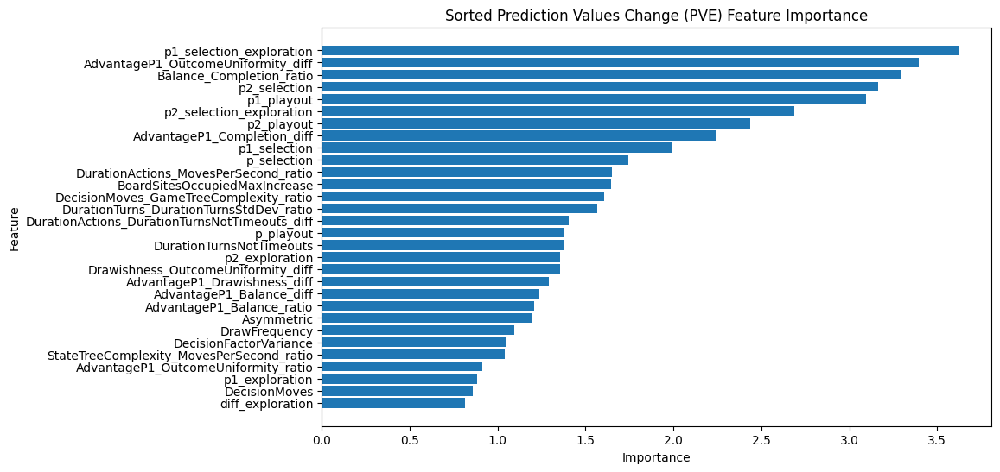

0:	learn: 0.6227455	test: 0.5387214	best: 0.5387214 (0)	total: 102ms	remaining: 17m 3s
200:	learn: 0.3587754	test: 0.4631154	best: 0.4631154 (200)	total: 13s	remaining: 10m 33s
400:	learn: 0.3191686	test: 0.4507585	best: 0.4507585 (400)	total: 25.7s	remaining: 10m 15s
600:	learn: 0.2956485	test: 0.4441359	best: 0.4441321 (599)	total: 38.6s	remaining: 10m 3s
800:	learn: 0.2798927	test: 0.4406029	best: 0.4406029 (800)	total: 51.5s	remaining: 9m 51s
1000:	learn: 0.2679604	test: 0.4386041	best: 0.4385666 (997)	total: 1m 4s	remaining: 9m 38s
1200:	learn: 0.2582460	test: 0.4367399	best: 0.4367399 (1200)	total: 1m 17s	remaining: 9m 26s
1400:	learn: 0.2507308	test: 0.4358490	best: 0.4358057 (1370)	total: 1m 30s	remaining: 9m 14s
1600:	learn: 0.2445190	test: 0.4351026	best: 0.4351026 (1600)	total: 1m 43s	remaining: 9m 1s
1800:	learn: 0.2392424	test: 0.4344797	best: 0.4344797 (1800)	total: 1m 56s	remaining: 8m 48s
2000:	learn: 0.2346826	test: 0.4339109	best: 0.4339090 (1999)	total: 2m 8s	remaini

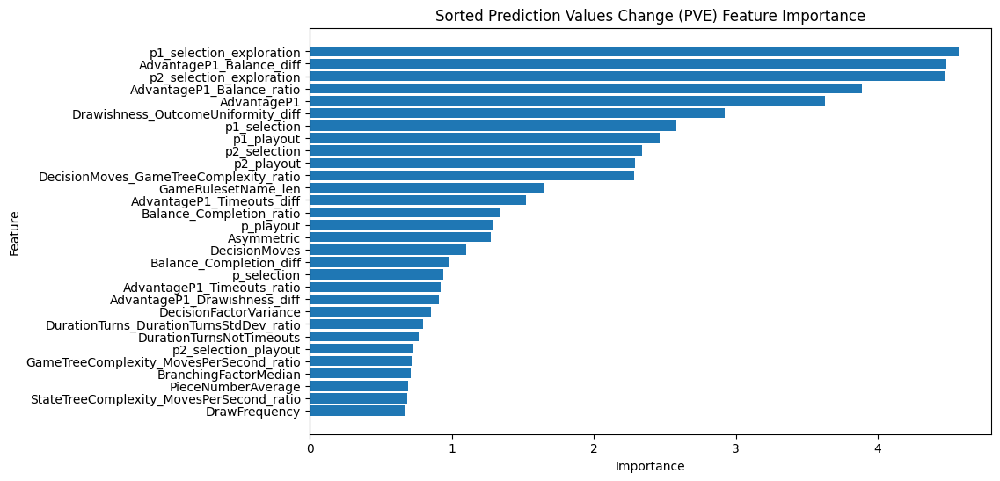

 20%|██        | 1/5 [04:08<16:32, 248.15s/it]

0:	learn: 1.0461513	test: 1.0652336	best: 1.0652336 (0)	total: 83.2ms	remaining: 1m 23s
100:	learn: 0.3818791	test: 0.6308503	best: 0.6308503 (100)	total: 4.27s	remaining: 38s
200:	learn: 0.3168372	test: 0.5854486	best: 0.5854486 (200)	total: 8.06s	remaining: 32s
300:	learn: 0.2839726	test: 0.5727381	best: 0.5722861 (289)	total: 11.9s	remaining: 27.7s
400:	learn: 0.2628945	test: 0.5685807	best: 0.5681178 (375)	total: 15.9s	remaining: 23.7s
500:	learn: 0.2487733	test: 0.5661287	best: 0.5661287 (500)	total: 19.7s	remaining: 19.6s
600:	learn: 0.2363894	test: 0.5657340	best: 0.5652798 (574)	total: 23.7s	remaining: 15.8s
bestTest = 0.565279833
bestIteration = 574
Shrink model to first 575 iterations.
(2158, 576)


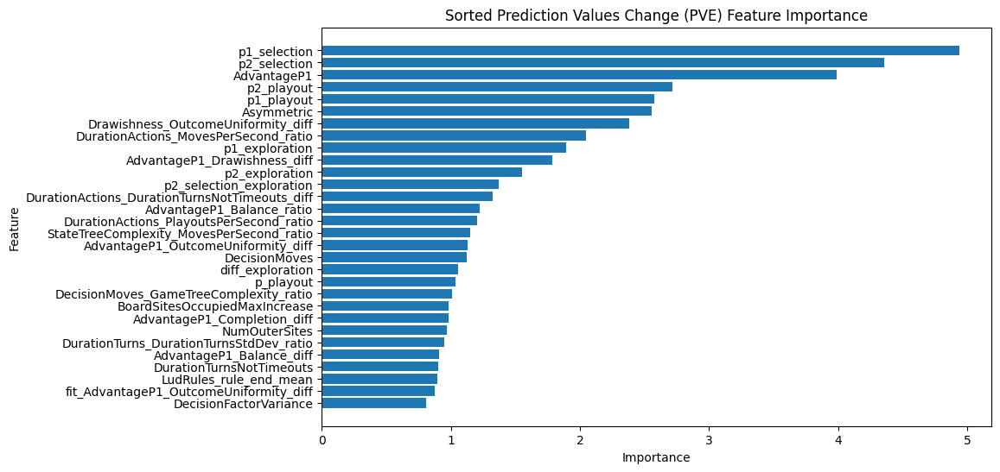

0:	learn: 0.6161233	test: 0.5681921	best: 0.5681921 (0)	total: 98.5ms	remaining: 16m 25s
200:	learn: 0.3538295	test: 0.4542128	best: 0.4542128 (200)	total: 13.2s	remaining: 10m 44s
400:	learn: 0.3148691	test: 0.4397637	best: 0.4397637 (400)	total: 26s	remaining: 10m 23s
600:	learn: 0.2923261	test: 0.4326711	best: 0.4326711 (600)	total: 39s	remaining: 10m 9s
800:	learn: 0.2776300	test: 0.4285746	best: 0.4285746 (800)	total: 51.7s	remaining: 9m 54s
1000:	learn: 0.2666221	test: 0.4255937	best: 0.4255898 (999)	total: 1m 4s	remaining: 9m 40s
1200:	learn: 0.2574562	test: 0.4237753	best: 0.4237753 (1200)	total: 1m 17s	remaining: 9m 27s
1400:	learn: 0.2500401	test: 0.4225703	best: 0.4225703 (1400)	total: 1m 30s	remaining: 9m 14s
1600:	learn: 0.2436705	test: 0.4215160	best: 0.4215160 (1600)	total: 1m 43s	remaining: 9m 2s
1800:	learn: 0.2382828	test: 0.4206469	best: 0.4206469 (1800)	total: 1m 56s	remaining: 8m 49s
2000:	learn: 0.2334940	test: 0.4203035	best: 0.4202986 (1999)	total: 2m 9s	remaini

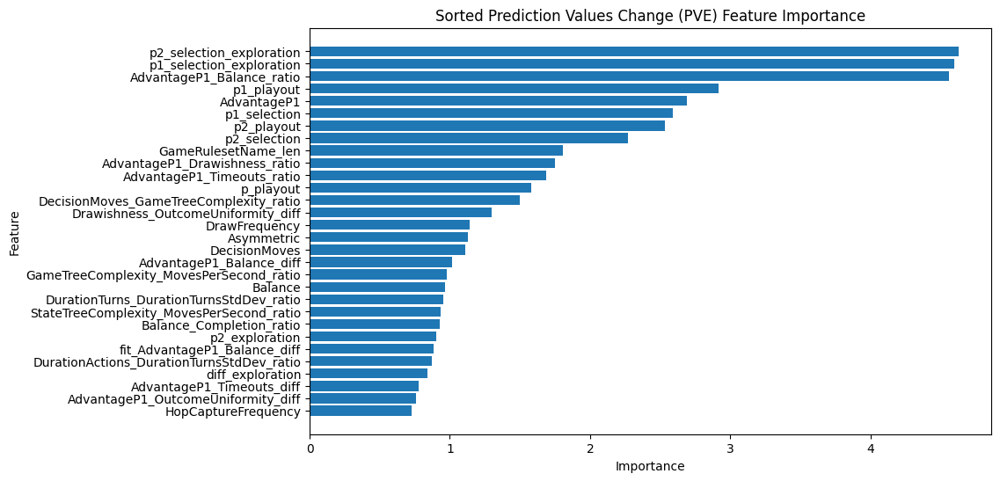

 40%|████      | 2/5 [08:57<13:37, 272.63s/it]

0:	learn: 1.0462086	test: 1.0610696	best: 1.0610696 (0)	total: 78.8ms	remaining: 1m 18s
100:	learn: 0.3895721	test: 0.5985164	best: 0.5985164 (100)	total: 4.26s	remaining: 37.9s
200:	learn: 0.3219365	test: 0.5700452	best: 0.5700452 (200)	total: 8.11s	remaining: 32.3s
300:	learn: 0.2880716	test: 0.5628074	best: 0.5627993 (297)	total: 12s	remaining: 27.9s
400:	learn: 0.2663207	test: 0.5621943	best: 0.5616293 (357)	total: 15.9s	remaining: 23.7s
bestTest = 0.5616293027
bestIteration = 357
Shrink model to first 358 iterations.
(970, 576)


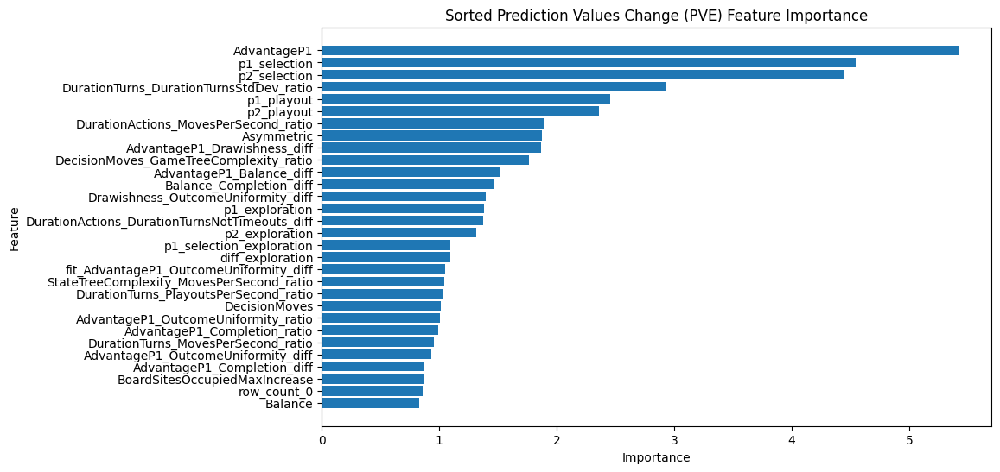

0:	learn: 0.6241819	test: 0.5485138	best: 0.5485138 (0)	total: 104ms	remaining: 17m 15s
200:	learn: 0.3551911	test: 0.4525136	best: 0.4525136 (200)	total: 12.9s	remaining: 10m 30s
400:	learn: 0.3133360	test: 0.4396569	best: 0.4396569 (400)	total: 25.5s	remaining: 10m 10s
600:	learn: 0.2907596	test: 0.4346356	best: 0.4346356 (600)	total: 38.2s	remaining: 9m 56s
800:	learn: 0.2758565	test: 0.4318424	best: 0.4317995 (796)	total: 50.6s	remaining: 9m 41s
1000:	learn: 0.2642638	test: 0.4300536	best: 0.4300425 (998)	total: 1m 3s	remaining: 9m 26s
1200:	learn: 0.2550187	test: 0.4287941	best: 0.4287860 (1199)	total: 1m 15s	remaining: 9m 14s
1400:	learn: 0.2475862	test: 0.4278261	best: 0.4278155 (1395)	total: 1m 28s	remaining: 9m 2s
1600:	learn: 0.2410468	test: 0.4272513	best: 0.4272387 (1589)	total: 1m 41s	remaining: 8m 50s
1800:	learn: 0.2353555	test: 0.4267215	best: 0.4267215 (1800)	total: 1m 53s	remaining: 8m 38s
2000:	learn: 0.2305542	test: 0.4264303	best: 0.4264303 (2000)	total: 2m 6s	rema

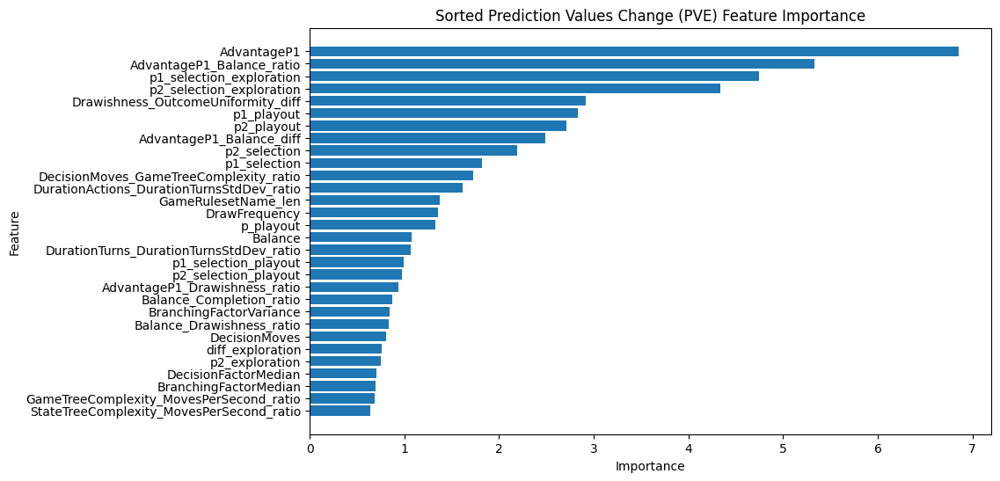

 60%|██████    | 3/5 [13:43<09:17, 278.62s/it]

0:	learn: 1.0450006	test: 1.0634802	best: 1.0634802 (0)	total: 88.8ms	remaining: 1m 28s
100:	learn: 0.3803689	test: 0.6137989	best: 0.6137989 (100)	total: 4.32s	remaining: 38.4s
200:	learn: 0.3173336	test: 0.5729189	best: 0.5729189 (200)	total: 8.07s	remaining: 32.1s
300:	learn: 0.2846372	test: 0.5535152	best: 0.5535152 (300)	total: 12s	remaining: 27.8s
400:	learn: 0.2633042	test: 0.5472551	best: 0.5472551 (400)	total: 15.8s	remaining: 23.6s
500:	learn: 0.2482090	test: 0.5426770	best: 0.5423897 (492)	total: 19.7s	remaining: 19.6s
600:	learn: 0.2360079	test: 0.5404432	best: 0.5404432 (600)	total: 23.7s	remaining: 15.7s
700:	learn: 0.2253649	test: 0.5390283	best: 0.5386409 (674)	total: 27.6s	remaining: 11.8s
bestTest = 0.5386408703
bestIteration = 674
Shrink model to first 675 iterations.
(1997, 576)


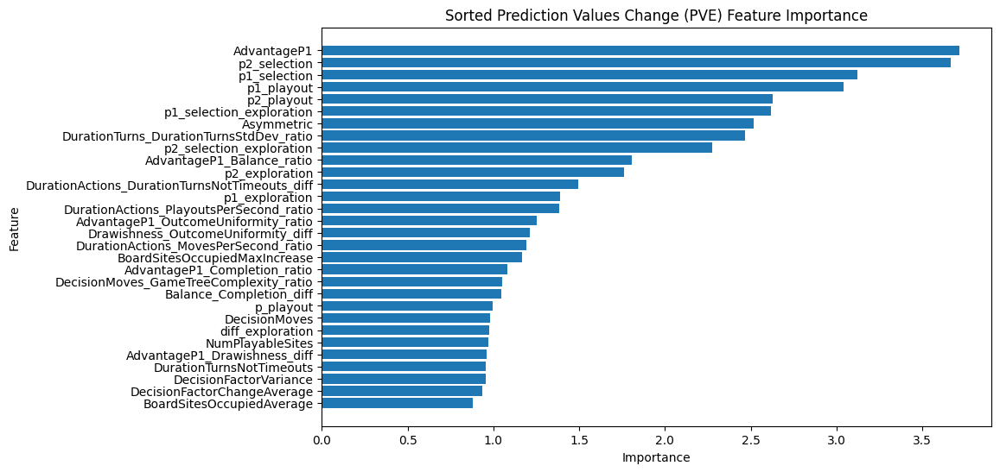

0:	learn: 0.6165354	test: 0.5746305	best: 0.5746305 (0)	total: 96.1ms	remaining: 16m
200:	learn: 0.3542370	test: 0.4421436	best: 0.4421436 (200)	total: 12.9s	remaining: 10m 29s
400:	learn: 0.3157750	test: 0.4259740	best: 0.4259740 (400)	total: 25.5s	remaining: 10m 10s
600:	learn: 0.2934848	test: 0.4191115	best: 0.4191115 (600)	total: 38.1s	remaining: 9m 55s
800:	learn: 0.2783831	test: 0.4161431	best: 0.4161431 (800)	total: 50.8s	remaining: 9m 43s
1000:	learn: 0.2669666	test: 0.4140111	best: 0.4140111 (1000)	total: 1m 3s	remaining: 9m 30s
1200:	learn: 0.2581716	test: 0.4123213	best: 0.4123213 (1200)	total: 1m 16s	remaining: 9m 17s
1400:	learn: 0.2503550	test: 0.4113003	best: 0.4113003 (1400)	total: 1m 28s	remaining: 9m 4s
1600:	learn: 0.2436452	test: 0.4103130	best: 0.4103057 (1594)	total: 1m 41s	remaining: 8m 52s
1800:	learn: 0.2379489	test: 0.4095072	best: 0.4095072 (1800)	total: 1m 54s	remaining: 8m 40s
2000:	learn: 0.2331698	test: 0.4088799	best: 0.4088788 (1997)	total: 2m 7s	remain

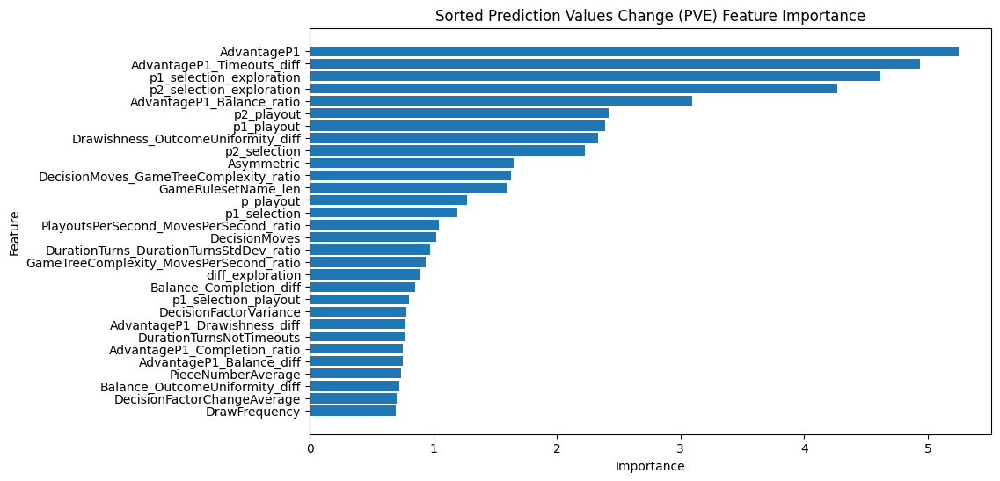

 80%|████████  | 4/5 [17:17<04:12, 252.86s/it]

0:	learn: 1.0514686	test: 1.0744085	best: 1.0744085 (0)	total: 74.8ms	remaining: 37.3s
100:	learn: 0.4261076	test: 0.7112045	best: 0.7112045 (100)	total: 4.21s	remaining: 16.6s
200:	learn: 0.3543286	test: 0.7066440	best: 0.7019869 (181)	total: 7.94s	remaining: 11.8s
300:	learn: 0.3186505	test: 0.7184123	best: 0.7019869 (181)	total: 11.7s	remaining: 7.74s
400:	learn: 0.2946377	test: 0.7243603	best: 0.7019869 (181)	total: 15.5s	remaining: 3.83s
499:	learn: 0.2771965	test: 0.7323189	best: 0.7019869 (181)	total: 19.4s	remaining: 0us
bestTest = 0.7019869264
bestIteration = 181
(3836, 576)


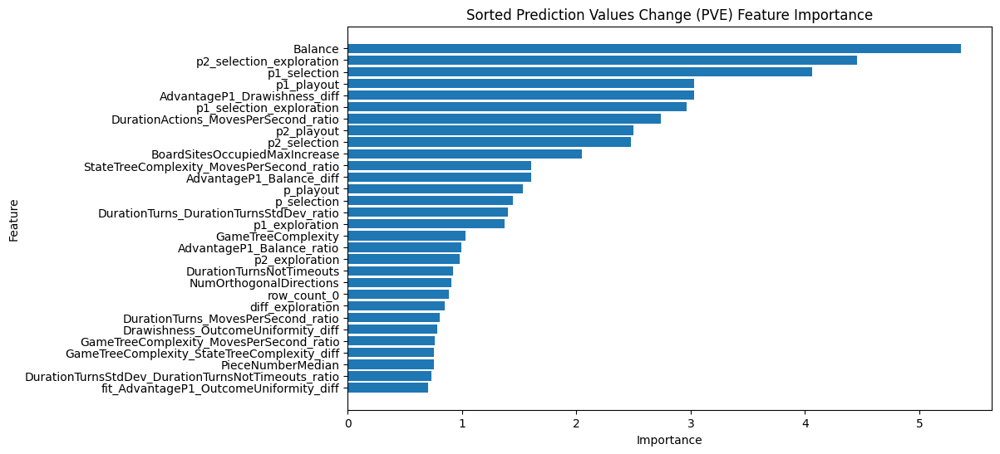

0:	learn: 0.5750951	test: 0.6896948	best: 0.6896948 (0)	total: 103ms	remaining: 5m 7s
200:	learn: 0.3661777	test: 0.5899396	best: 0.5899396 (200)	total: 11.9s	remaining: 2m 45s
400:	learn: 0.3252974	test: 0.5849948	best: 0.5849948 (400)	total: 23.6s	remaining: 2m 33s
600:	learn: 0.3039934	test: 0.5829660	best: 0.5829636 (599)	total: 35.1s	remaining: 2m 20s
800:	learn: 0.2897975	test: 0.5823415	best: 0.5821405 (764)	total: 46.5s	remaining: 2m 7s
1000:	learn: 0.2787880	test: 0.5816246	best: 0.5815857 (981)	total: 58s	remaining: 1m 55s
1200:	learn: 0.2694649	test: 0.5816644	best: 0.5815029 (1023)	total: 1m 9s	remaining: 1m 44s
1400:	learn: 0.2617497	test: 0.5811388	best: 0.5811185 (1390)	total: 1m 21s	remaining: 1m 32s
1600:	learn: 0.2551091	test: 0.5810342	best: 0.5809382 (1426)	total: 1m 33s	remaining: 1m 21s
1800:	learn: 0.2493570	test: 0.5809606	best: 0.5809252 (1774)	total: 1m 44s	remaining: 1m 9s
2000:	learn: 0.2441238	test: 0.5813323	best: 0.5809005 (1828)	total: 1m 56s	remaining: 

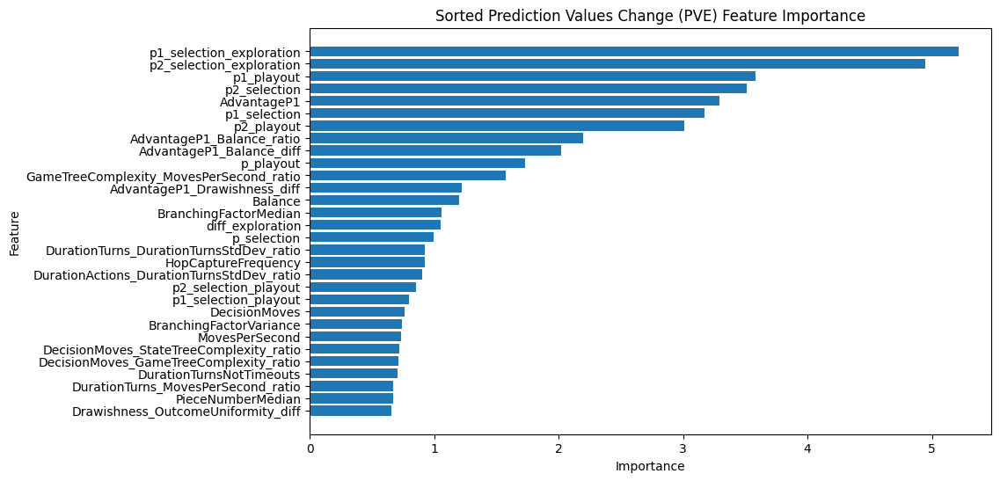

100%|██████████| 5/5 [20:53<00:00, 250.70s/it]


--- Final Mean Scores ---
Mean Test RMSE: 0.4473014306149081

=== KFold RMSE Results ===
   Fold  Test RMSE
0     1   0.432188
1     2   0.411243
2     3   0.422427
3     4   0.403506
4     5   0.567143


In [ ]:
a = TrainML_cb_2st(train)

# 実験

In [ ]:
import joblib
models1 = [joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline5/0911_fold{fold}.pickle") for fold in range(5)]
models2 = [joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline5/0911_fold_1{fold}.pickle") for fold in range(5)]

In [ ]:
train_crs = train.drop(['p1_selection','p1_playout','p1_bounds','p2_selection','p2_playout','p2_bounds','p_selection', 'p_exploration', 'p_playout', 'p_bounds','p1_exploration', 'p2_exploration','utility_agent1'],axis = 1)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from sklearn.cluster import KMeans

km = KMeans(n_clusters=5, max_iter=30)
kmh = km.fit_predict(train_crs)
train_crs['kmh'] = kmh
train_crs.head()

,Stochastic,Asymmetric,AsymmetricForces,AsymmetricPiecesType,PlayersWithDirections,Cooperation,Team,Shape,SquareShape,HexShape,...,PlayerValue,Efficiency,CopyContext,Then,ForEachPiece,DoLudeme,Trigger,PlayoutsPerSecond,MovesPerSecond,kmh
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,1.0,298.070007,18877.169922,0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,1.0,298.070007,18877.169922,0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,1.0,298.070007,18877.169922,0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,1.0,298.070007,18877.169922,0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,1.0,298.070007,18877.169922,0


In [ ]:
from collections import Counter

# ゲーム名をアンダースコアで分割し、全単語をリスト化
all_words = [word for game in group_col.unique() for word in game.split('_')]

# 単語の出現頻度をカウント
word_counts = Counter(all_words)

# 最頻出単語トップ10を表示（チェスや碁以外の単語を探す）
print(word_counts.most_common(10))

[('Suggested', 263), ('Ludus', 166), ('Diagonal', 139), ('-', 135), ('Joined', 134), ('No', 117), ('Extension', 112), ('CoriovalliHaretavl', 112), ('Observed', 107), ('Two', 96)]


In [ ]:
from itertools import combinations
from collections import Counter

# ゲーム名リスト（polarsのDataFrameから抽出されたデータと仮定）
game_names = group_col.unique().to_list()

# ペアをカウントするためのリストを作成
all_pairs = []

# 各ゲーム名をアンダースコアで分割して、ペアを生成
for game in game_names:
    words = game.split('_')  # アンダースコアで単語に分割
    if len(words) > 1:  # 単語が2つ以上ある場合にのみペアを作成
        pairs = combinations(words, 2)  # 2つの単語のペアを作成
        all_pairs.extend(pairs)

# ペアの出現頻度をカウント
pair_counts = Counter(all_pairs)

# 最も頻繁に出現するペアトップ10を表示
print(pair_counts.most_common(20))

[(('Ludus', 'Suggested'), 160), (('Ludus', '-'), 135), (('-', 'Suggested'), 135), (('Ludus', 'Joined'), 134), (('-', 'Joined'), 134), (('Joined', 'Suggested'), 134), (('Diagonal', 'Suggested'), 133), (('Ludus', 'Diagonal'), 132), (('-', 'Diagonal'), 132), (('Joined', 'Diagonal'), 132), (('Ludus', 'No'), 117), (('-', 'No'), 117), (('No', 'Joined'), 117), (('No', 'Diagonal'), 117), (('No', 'Suggested'), 117), (('CoriovalliHaretavl', '-'), 113), (('Ludus', 'CoriovalliHaretavl'), 112), (('Ludus', 'Extension'), 112), (('CoriovalliHaretavl', 'Joined'), 112), (('CoriovalliHaretavl', 'Suggested'), 112)]


In [ ]:
tra = pl.read_csv("/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/train.csv")

In [ ]:
lis = []
for i in tra["LudRules"]:
  lis.append(parse_prefix_tree(i))

In [ ]:
tra = tra.with_columns(pl.Series(lis).alias("depth"))

In [ ]:
# game_nameごとにscore列の平均を計算
result = tra.groupby("depth").agg([
    pl.col("utility_agent1").mean().alias("average_score")
])

# 結果を表示
print(result)

shape: (32, 2)
┌───────┬───────────────┐
│ depth ┆ average_score │
│ ---   ┆ ---           │
│ i64   ┆ f64           │
╞═══════╪═══════════════╡
│ 18    ┆ -0.003421     │
│ 35    ┆ 0.040075      │
│ 13    ┆ 0.065314      │
│ 29    ┆ 0.315562      │
│ …     ┆ …             │
│ 37    ┆ -0.021127     │
│ 15    ┆ -0.058885     │
│ 31    ┆ -0.002414     │
│ 20    ┆ 0.076161      │
└───────┴───────────────┘


In [ ]:
df = train[["NoMovesWin","NoMovesWinFrequency"]]



In [ ]:
(train["NoMovesWinFrequency"] == train["NoMovesWin"]*train["NoMovesWinFrequency"]).sum()

233234

In [ ]:
df = train.with_columns(
    (train["NoMovesWin"] != (train["NoMovesWin"] * train["NoMovesWinFrequency"])).alias("NewColumn")
)

'\nFrequency'

In [ ]:
import io
import pandas as pd
freq_df = pd.read_csv(io.StringIO('''
VoteDecision
SwapPlayersDecision
PassDecision
ProposeDecision
AddDecision
PromotionDecision
RemoveDecision
RotationDecision
StepDecision
StepDecisionToEmpty
StepDecisionToFriend
StepDecisionToEnemy
SlideDecision
SlideDecisionToEmpty
SlideDecisionToEnemy
SlideDecisionToFriend
LeapDecision
LeapDecisionToEmpty
LeapDecisionToEnemy
HopDecision
HopDecisionMoreThanOne
HopDecisionEnemyToEmpty
HopDecisionFriendToEmpty
HopDecisionEnemyToEnemy
HopDecisionFriendToEnemy
FromToDecision
FromToDecisionEmpty
FromToDecisionEnemy
FromToDecisionFriend
SwapPiecesDecision
ShootDecision
VoteEffect
SwapPlayersEffect
PassEffect
Roll
ProposeEffect
AddEffect
Sow
SowCapture
SowRemove
SowBacktracking
PromotionEffect
RemoveEffect
PushEffect
Flip
SetNextPlayer
MoveAgain
SetValue
SetCount
SetRotation
StepEffect
SlideEffect
LeapEffect
HopEffect
FromToEffect
ReplacementCapture
HopCapture
HopCaptureMoreThanOne
DirectionCapture
EncloseCapture
CustodialCapture
InterveneCapture
SurroundCapture
CaptureSequence
LineEnd
LineWin
LineLoss
LineDraw
ConnectionEnd
ConnectionWin
ConnectionLoss
GroupEnd
GroupWin
GroupLoss
GroupDraw
LoopEnd
LoopWin
LoopLoss
PatternEnd
PatternWin
PathExtentEnd
PathExtentWin
PathExtentLoss
TerritoryEnd
TerritoryWin
Checkmate
CheckmateWin
NoTargetPieceEnd
NoTargetPieceWin
EliminatePiecesEnd
EliminatePiecesWin
EliminatePiecesLoss
EliminatePiecesDraw
NoOwnPiecesEnd
NoOwnPiecesWin
NoOwnPiecesLoss
FillEnd
FillWin
ReachEnd
ReachWin
ReachLoss
ReachDraw
ScoringEnd
ScoringWin
ScoringLoss
ScoringDraw
NoMovesEnd
NoMovesWin
NoMovesLoss
NoMovesDraw
NoProgressEnd
NoProgressDraw
Draw
'''), header=None, )
freq_list = list(freq_df.iloc[:,0])


In [ ]:
for col in freq_list:
    col_freq = col + "Frequency"
    if (train[col_freq] == train[col]*train[col_freq]).sum() != 233234:
      print(col)

SwapPlayersDecision
PassDecision
AddDecision
StepDecisionToEmpty
StepDecisionToFriend
StepDecisionToEnemy
SlideDecisionToEmpty
SlideDecisionToEnemy
SlideDecisionToFriend
LeapDecisionToEmpty
LeapDecisionToEnemy
HopDecisionMoreThanOne
HopDecisionEnemyToEmpty
HopDecisionFriendToEmpty
HopDecisionEnemyToEnemy
HopDecisionFriendToEnemy
FromToDecisionEmpty
FromToDecisionEnemy
FromToDecisionFriend
AddEffect
RemoveEffect
SetNextPlayer
MoveAgain
SetRotation
HopCaptureMoreThanOne
Draw


In [ ]:
train["SwapPlayersDecision"].sum()

5702

In [ ]:
df = train.with_columns(
    (train["PassDecisionFrequency"] != (train["PassDecision"] * train["PassDecisionFrequency"])).alias("NewColumn")
)

In [ ]:
true_rows = df.filter(pl.col("NewColumn") == True)

In [ ]:
true_rows[["PassDecision","PassDecisionFrequency"]]

PassDecision,PassDecisionFrequency
i64,f64
0,0.01
0,0.01
0,0.01
0,0.01
0,0.01
0,0.01
0,0.01
0,0.01
0,0.01


In [ ]:
train["NumDirections"]

,NumDirections
0,5.00
1,5.00
2,5.00
3,5.00
4,5.00
...,...
233229,6.37
233230,6.37
233231,6.37
233232,6.37


In [ ]:
a = tra[[ 'Directions',
 'AbsoluteDirections',
 'AllDirections',
 'AdjacentDirection',
 'OrthogonalDirection',
 'DiagonalDirection',
 'RotationalDirection',
 'SameLayerDirection',
 'RelativeDirections',
 'ForwardDirection',
 'BackwardDirection',
 'ForwardsDirection',
 'BackwardsDirection',
 'RightwardDirection',
 'LeftwardDirection',
 'RightwardsDirection',
 'LeftwardsDirection',
 'ForwardLeftDirection',
 'ForwardRightDirection',
 'BackwardLeftDirection',
 'BackwardRightDirection',
 'SameDirection',
 'OppositeDirection',]].sum(axis=1)

tra[['Style',
 'BoardStyle',
 'GraphStyle',
 'ChessStyle',
 'GoStyle',
 'MancalaStyle',
 'PenAndPaperStyle',
 'ShibumiStyle',
 'BackgammonStyle',
 'JanggiStyle',
 'XiangqiStyle',
 'ShogiStyle',
 'TableStyle',
 'SurakartaStyle',
 'TaflStyle',]].sum(axis=1).unique()

tra[['ComponentStyle',
 'AnimalComponent',
 'ChessComponent',
 'FairyChessComponent',
 'PloyComponent',
 'ShogiComponent',
 'XiangqiComponent',
 'StrategoComponent',
 'JanggiComponent',
 'CheckersComponent',
 'BallComponent',
 'TaflComponent',
 'DiscComponent',
 'MarkerComponent']].sum(axis=1).unique()

# tra[[ 'KingComponent',
#  'QueenComponent',
#  'KnightComponent',
#  'RookComponent',
#  'BishopComponent',
#  'PawnComponent',]].sum(axis=1.unique())

tra[['Line',
 'Connection',
 'Group',
 'Contains',
 'Loop',
 'Pattern',
 'PathExtent',
 'Territory',
 'Fill',
 'Distance',]].sum(axis=1).unique()

sum
i64
0
1
2
3
4


### カラム統合

In [ ]:
# ここに入っているやつを一つのカラムとして処理できそうならやりたい
filtered_columns

['Stochastic',
 'Asymmetric',
 'AsymmetricForces',
 'AsymmetricPiecesType',
 'PlayersWithDirections',
 'Cooperation',
 'Team',
 'RegularShape',
 'PolygonShape',
 'ConcentricTiling',
 'MancalaStores',
 'Track',
 'TrackLoop',
 'TrackOwned',
 'Region',
 'Boardless',
 'Vertex',
 'Cell',
 'Edge',
 'Hand',
 'Piece',
 'PieceValue',
 'PieceRotation',
 'PieceDirection',
 'LargePiece',
 'Tile',
 'Meta',
 'OpeningContract',
 'SwapOption',
 'Repetition',
 'TurnKo',
 'PositionalSuperko',
 'AutoMove',
 'Start',
 'PiecesPlacedOnBoard',
 'PiecesPlacedOutsideBoard',
 'InitialRandomPlacement',
 'InitialScore',
 'InitialCost',
 'Moves',
 'MovesDecision',
 'NoSiteMoves',
 'SingleSiteMoves',
 'TwoSitesMoves',
 'MovesNonDecision',
 'MovesEffects',
 'SowWithEffect',
 'SowProperties',
 'SowSkip',
 'SowOriginFirst',
 'SowCW',
 'SowCCW',
 'SetMove',
 'SetRotationFrequency',
 'MovesOperators',
 'Priority',
 'ByDieMove',
 'MaxMovesInTurn',
 'MaxDistance',
 'Capture',
 'Conditions',
 'SpaceConditions',
 'Line',
 '

In [ ]:
df = create_category(df,category_list, addcat_list)

Shape
SquareShape
HexShape
TriangleShape
DiamondShape
RectangleShape
SpiralShape
CircleShape
StarShape
SquarePyramidalShape
Tiling
SquareTiling
HexTiling
TriangleTiling
SemiRegularTiling
MorrisTiling
CircleTiling
SpiralTiling
AlquerqueTiling
MancalaBoard
MancalaTwoRows
MancalaThreeRows
MancalaFourRows
MancalaSixRows
MancalaCircular
AlquerqueBoard
AlquerqueBoardWithOneTriangle
AlquerqueBoardWithTwoTriangles
AlquerqueBoardWithFourTriangles
AlquerqueBoardWithEightTriangles
ThreeMensMorrisBoard
ThreeMensMorrisBoardWithTwoTriangles
NineMensMorrisBoard
StarBoard
CrossBoard
KintsBoard
PachisiBoard
FortyStonesWithFourGapsBoard
Dice
DiceD2
DiceD4
DiceD6


In [ ]:
# 同じ値で列を作る
tra = tra.with_columns(pl.lit("none").alias("Shape_category"))
tra = tra.with_columns(pl.col("Shape").replace(1, "Shape").alias("Shape"))
tra = tra.with_columns(
    pl.when(pl.col("Shape") == "Shape").then(pl.col("Shape")).otherwise(pl.col("Shape_category")).alias("Shape_category")
)

In [ ]:
tra["Shape_category"]

Shape_category
str
"""Shape"""
"""Shape"""
"""Shape"""
"""Shape"""
"""Shape"""
"""Shape"""
"""Shape"""
"""Shape"""
"""Shape"""


In [ ]:
group_kfold = GroupKFold(n_splits=n_splits)
cat_list = ['p1_selection','p1_playout','p1_bounds','p2_selection','p2_playout','p2_bounds','p_selection', 'p_exploration', 'p_playout', 'p_bounds']+filtered_columns+frequent_word_column+addcat_list

test_rmse_scores = []
trained_models = []

for fold, (train_idx, test_idx) in enumerate(tqdm(group_kfold.split(X, y, groups=groups),
                                                  desc="Training Folds", total=n_splits)):
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

    model = CatBoostRegressor(**params,cat_features = cat_list)
    model.fit(X_train, y_train, eval_set=[(X_test, y_test)],
          early_stopping_rounds=100)

    y_test_pred = model.predict(X_test)
    # round_set = [i/15 for i in range(-45,45)]

    # rounded_values = [round_set[np.abs(round_set - v).argmin()] for v in y_test_pred]

    trained_models.append(model)


    # filename = f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline7/0912_fold{fold}.pickle"

    # with open(filename, mode='wb') as fp:
    #    pickle.dump(model, fp)

    test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
    #test_rmse = np.sqrt(mean_squared_error(y_test, rounded_values))

    test_rmse_scores.append(test_rmse)

    print(f"Fold {fold+1} Test RMSE: {test_rmse:.3f}")

    feature_names = X.columns.tolist()

    pve_importances = model.get_feature_importance(data = Pool(X_train,y_train,cat_features=cat_list),type='ShapValues') # default type
    sorted_indices = np.argsort(pve_importances)
    plt.figure(figsize=(10, 6))
    plt.barh(np.array(feature_names)[sorted_indices], pve_importances[sorted_indices])
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.title('Sorted Prediction Values Change (PVE) Feature Importance')
    plt.show()

Training Folds:   0%|          | 0/5 [00:00<?, ?it/s]

0:	learn: 0.6124867	test: 0.6130117	best: 0.6130117 (0)	total: 122ms	remaining: 20m 22s
200:	learn: 0.3407392	test: 0.4416342	best: 0.4416342 (200)	total: 15.3s	remaining: 12m 23s
400:	learn: 0.2983368	test: 0.4273600	best: 0.4273600 (400)	total: 30.4s	remaining: 12m 6s
600:	learn: 0.2742575	test: 0.4220179	best: 0.4220179 (600)	total: 45.6s	remaining: 11m 52s
800:	learn: 0.2578812	test: 0.4186493	best: 0.4186493 (800)	total: 1m	remaining: 11m 38s
1000:	learn: 0.2456989	test: 0.4169428	best: 0.4169428 (1000)	total: 1m 16s	remaining: 11m 23s
1200:	learn: 0.2358779	test: 0.4155496	best: 0.4155496 (1200)	total: 1m 31s	remaining: 11m 10s
1400:	learn: 0.2281764	test: 0.4147843	best: 0.4147743 (1392)	total: 1m 46s	remaining: 10m 53s
1600:	learn: 0.2210416	test: 0.4142481	best: 0.4142410 (1590)	total: 2m 1s	remaining: 10m 38s
1800:	learn: 0.2144253	test: 0.4138184	best: 0.4138123 (1794)	total: 2m 17s	remaining: 10m 24s
2000:	learn: 0.2086280	test: 0.4134209	best: 0.4134209 (2000)	total: 2m 32

Training Folds:   0%|          | 0/5 [03:11<?, ?it/s]

Fold 1 Test RMSE: 0.413


CatBoostError: features data: pandas.DataFrame column 'Stochastic' has dtype 'category' but is not in  cat_features list

In [ ]:
import matplotlib.pyplot as plt


pve_importances = model.get_feature_importance(data = Pool(X_train,y_train,cat_features=cat_list),type='ShapValues') # default type
sorted_indices = np.argsort(pve_importances)[-100:]
plt.figure(figsize=(20, 20))
plt.barh(np.array(feature_names)[sorted_indices], pve_importances[sorted_indices])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Sorted Prediction Values Change (PVE) Feature Importance')
plt.show()

IndexError: index 465 is out of bounds for axis 0 with size 465

<Figure size 2000x2000 with 0 Axes>

# PCA

In [ ]:
df = train.select_dtypes(include=['number'])
df = df.drop(["utility_agent1","GameRulesetName_len","GameRulesetName_count","p1_exploration",	"p2_exploration"],axis=1)
df.columns = df.columns.astype(str)

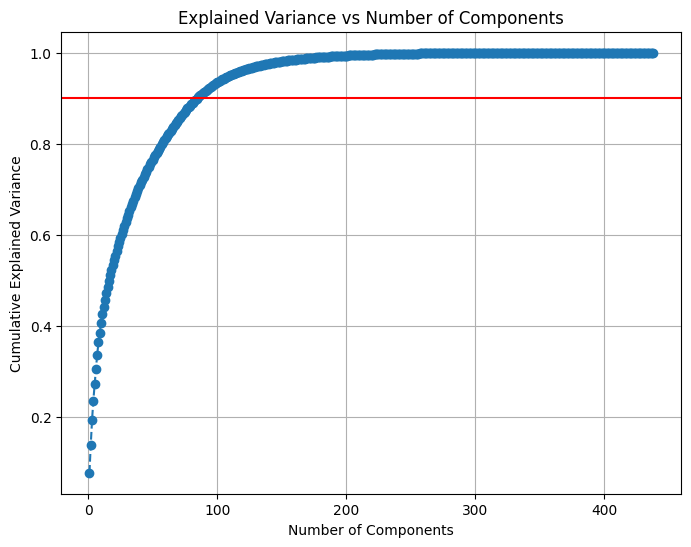

Number of components to retain 90% variance: 85


In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# 0と1しか取らない列を識別
binary_columns = df.nunique() == 2
continuous_columns = ~binary_columns

# 前処理
binary_data = df.loc[:, binary_columns]  # 0と1しか取らないデータはそのまま
continuous_data = df.loc[:, continuous_columns]

# 連続値の列を標準化
scaler = StandardScaler()
continuous_data_scaled = scaler.fit_transform(continuous_data)

# 全データを結合
processed_data = pd.concat([binary_data, pd.DataFrame(continuous_data_scaled, index=continuous_data.index,columns = continuous_data.columns)], axis=1)

pca = PCA()
pca_transformed = pca.fit_transform(processed_data)

# Step 7: Calculate explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance_ratio = explained_variance_ratio.cumsum()

# Step 8: Plot the Scree Plot
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(explained_variance_ratio) + 1), cumulative_variance_ratio, marker='o', linestyle='--')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance vs Number of Components')
plt.axhline(y=0.90, color='r', linestyle='-')  # 90% explained variance line
plt.grid(True)
plt.show()

n_components_90_var = (cumulative_variance_ratio >= 0.90).argmax() + 1
print(f"Number of components to retain 90% variance: {n_components_90_var}")

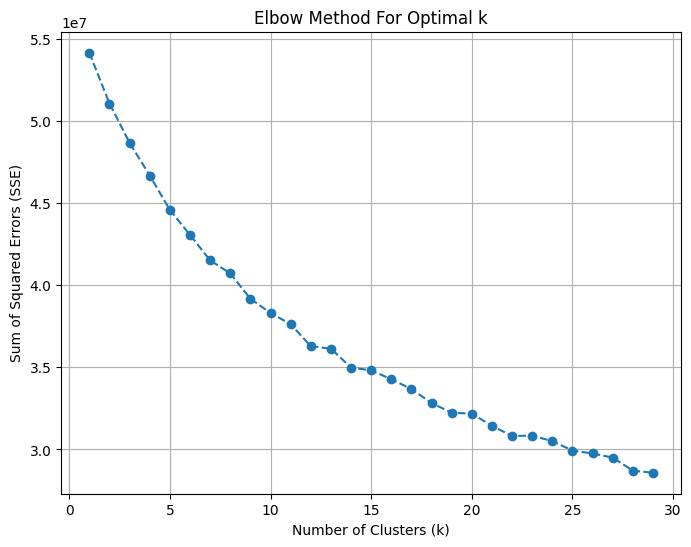

In [ ]:
# Step 1: Calculate SSE for different numbers of clusters
# sse = []
# for k in tqdm(range(1, 30)):  # You can try more values for k
#     kmeans = KMeans(n_clusters=k, random_state=0)
#     kmeans.fit(pca_transformed)  # Use processed data (PCA or original)
#     sse.append(kmeans.inertia_)  # SSE (inertia) is stored in kmeans.inertia_

# Step 2: Plot the SSE values
plt.figure(figsize=(8, 6))
plt.plot(range(1, 30), sse, marker='o', linestyle='--')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Sum of Squared Errors (SSE)')
plt.title('Elbow Method For Optimal k')
plt.grid(True)
plt.show()

In [ ]:
kmeans = KMeans(n_clusters=5, random_state=0)
labels = kmeans.fit_predict(pca_transformed)  # Use processed data (PCA or original)

In [ ]:
labels

KMeans(n_clusters=5, random_state=0)

In [ ]:
ss[ss["cluster"] == 2]["gamename"].unique()

array(['00Y', '1D_Chess', '20_SquaresSeleucid_Scholarly',
       '3D_Tic-Tac-Toe', '58_HolesCarnarvon_and_Carter_D6_Suggested',
       '58_HolesCarnarvon_and_Carter_Suggested',
       '58_HolesCarter_Crossover_2_D4_Suggested',
       '58_HolesCarter_Crossover_2_D6_Suggested',
       '58_HolesCarter_Crossover_2_Suggested',
       '58_HolesCarter_Marked_Holes_D4_Suggested',
       '58_HolesCarter_Marked_Holes_D6_Suggested',
       '58_HolesCarter_Marked_Holes_Suggested',
       '58_HolesCarter_Unmarked_D4_Suggested',
       '58_HolesCarter_Unmarked_D6_Suggested',
       '58_HolesCarter_Unmarked_Suggested',
       '58_HolesCarter_and_Carnarvon_D4_Suggested', 'A_Simple_Game',
       'Abrobad', 'AchiMurray_Described', 'AchiWikipedia_Suggested',
       'Ad_elta_stelpur', 'Adugo', 'Agilidade', 'Ahtarah_Guti', 'Akidada',
       'All_Queens_Chess', 'AlquerqueAlfonso_X_Described',
       'AlquerqueCovarrubias_Described', 'AlquerqueMurray_Suggested',
       'Alquerque_de_Tres', 'Altan_Xaraacaj', 

# 目的変数を変えてみる

In [ ]:
# catboost
from catboost import CatBoostRegressor, Pool,CatBoostClassifier

n_splits = 5
SEED = 2

def TrainML_cb_3tar(train):
    params_1 = {"iterations": 10000,'depth': 9, 'bootstrap_type': 'Bernoulli', 'l2_leaf_reg': 9, 'subsample': 0.7,
              "learning_rate": 0.05, "loss_function": 'RMSE',"eval_metric": 'RMSE',"random_seed": SEED,"verbose": 200,"task_type": "GPU"}
    params_2 = {"iterations": 4000,'depth': 9, 'bootstrap_type': 'Bernoulli', 'l2_leaf_reg': 9, 'subsample': 0.7,
              "learning_rate": 0.05, "loss_function": 'RMSE',"eval_metric": 'RMSE',"random_seed": SEED,"verbose": 200,"task_type": "GPU","use_best_model":False}
    params_3 = {"iterations": 1000,'depth': 9, 'bootstrap_type': 'Bernoulli', 'l2_leaf_reg': 9, 'subsample': 0.7,
              "learning_rate": 0.05, "loss_function": 'RMSE',"eval_metric": 'RMSE',"random_seed": SEED,"verbose": 200,"task_type": "GPU","use_best_model":False}

    # params = {"iterations": 10000,'depth': 10, 'bootstrap_type': 'Bernoulli', 'l2_leaf_reg': 3.7899370857490737, 'random_strength': 0.43309755716618514, 'subsample': 0.6156440007890391,
    #           "learning_rate": 0.05, "loss_function": 'RMSE',"eval_metric": 'RMSE',"random_seed": 0,"verbose": 200,"task_type": "GPU",}


    test_rmse_scores = []
    trained_models = []
    test_df_list = []

    sumresult = (train["num_wins_agent1"]+train["num_draws_agent1"]+train["num_losses_agent1"])

    train["num_wins_agent1"] = train["num_wins_agent1"]*15/sumresult
    train["num_draws_agent1"] = train["num_draws_agent1"]*15/sumresult
    train["num_losses_agent1"] = train["num_losses_agent1"]*15/sumresult

    for fold in tqdm(range(5)):

        train_df = train[train["fold"] != fold]
        test_df = train[train["fold"] == fold]

        test = test_df["utility_agent1"]

        ### 1 ###
        drop_cols = ["fold"]#+remove_encoded

        X_train = train_df.drop(drop_cols, axis=1)
        y_train = train_df['num_losses_agent1']
        X_test = test_df.drop(drop_cols, axis=1)
        y_test = test_df['num_losses_agent1']

        cat_list = list(X_train.select_dtypes(include=['object', 'category']).columns)

        # # 連続値の列を標準化
        # X_train_num = X_train[cluster_column]
        # X_test_num = X_test[cluster_column]

        # scaler = StandardScaler()
        # X_train_scaled = scaler.fit_transform(X_train_num)

        # kmeans = KMeans(n_clusters=15, random_state=42)
        # labels = kmeans.fit_predict(X_train_scaled)
        # X_train["cluster"] = labels

        # X_test_scaled = scaler.transform(X_test_num)
        # X_test["cluster"] = kmeans.predict(X_test_scaled)

        # X_train["cluster"] = X_train["cluster"].astype("category")
        # X_test["cluster"] = X_test["cluster"].astype("category")

        # X_train,target_mean_list = get_target_encoding_cluster_train(X_train)
        # X_test = get_target_encoding_cluster_test(X_test,target_mean_list)

        X_train = X_train.drop(['utility_agent1','num_losses_agent1','num_wins_agent1', 'num_draws_agent1'], axis=1)
        X_test = X_test.drop(['utility_agent1','num_losses_agent1','num_wins_agent1', 'num_draws_agent1'], axis=1)

        if fold != 4:
            model = CatBoostRegressor(**params_1,cat_features = cat_list)
            model.fit(X_train, y_train, eval_set=[(X_test, y_test)],
                  early_stopping_rounds=100)
        else:
            model = CatBoostRegressor(**params_2,cat_features = cat_list)
            model.fit(X_train, y_train, eval_set=[(X_test, y_test)],)
                  # early_stopping_rounds=100)


        y_test_pred_1 = model.predict(X_test).clip(0,15)

        feature_names = X_train.columns.tolist()
        pve_importances = model.get_feature_importance(data = Pool(X_train,y_train,cat_features=cat_list),type="PredictionValuesChange") # default type
        sorted_indices = np.argsort(pve_importances)[-50:]
        plt.figure(figsize=(20, 16))
        plt.barh(np.array(feature_names)[sorted_indices], pve_importances[sorted_indices])
        plt.xlabel('Importance')
        plt.ylabel('Feature')
        plt.title('Sorted Prediction Values Change (PVE) Feature Importance')
        plt.show()

        filename = f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_target_loss_seed{SEED}_fold{fold}.pickle"
        with open(filename, mode='wb') as fp:
           pickle.dump(model, fp)


        ### 2 ###
        y_train = train_df['num_wins_agent1']
        y_test = test_df['num_wins_agent1']

        if fold != 4:
            model = CatBoostRegressor(**params_1,cat_features = cat_list)
            model.fit(X_train, y_train, eval_set=[(X_test, y_test)],
                  early_stopping_rounds=100)
        else:
            model = CatBoostRegressor(**params_2,cat_features = cat_list)
            model.fit(X_train, y_train, eval_set=[(X_test, y_test)],)
                  # early_stopping_rounds=100)

        y_test_pred_2 = model.predict(X_test).clip(0,15)

        feature_names = X_train.columns.tolist()
        pve_importances = model.get_feature_importance(data = Pool(X_train,y_train,cat_features=cat_list),type="PredictionValuesChange") # default type
        sorted_indices = np.argsort(pve_importances)[-50:]
        plt.figure(figsize=(20, 16))
        plt.barh(np.array(feature_names)[sorted_indices], pve_importances[sorted_indices])
        plt.xlabel('Importance')
        plt.ylabel('Feature')
        plt.title('Sorted Prediction Values Change (PVE) Feature Importance')
        plt.show()

        filename = f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_target_win_seed{SEED}_fold{fold}.pickle"
        with open(filename, mode='wb') as fp:
           pickle.dump(model, fp)

        ### 3 ###

        y_train = train_df['num_draws_agent1']
        y_test = test_df['num_draws_agent1']

        if fold != 4:
            model = CatBoostRegressor(**params_1,cat_features = cat_list)
            model.fit(X_train, y_train, eval_set=[(X_test, y_test)],
                  early_stopping_rounds=100)
        else:
            model = CatBoostRegressor(**params_3,cat_features = cat_list)
            model.fit(X_train, y_train, eval_set=[(X_test, y_test)],)
                  # early_stopping_rounds=100)

        y_test_pred_3 = model.predict(X_test).clip(0,15)

        feature_names = X_train.columns.tolist()
        pve_importances = model.get_feature_importance(data = Pool(X_train,y_train,cat_features=cat_list),type="PredictionValuesChange") # default type
        sorted_indices = np.argsort(pve_importances)[-50:]
        plt.figure(figsize=(20, 16))
        plt.barh(np.array(feature_names)[sorted_indices], pve_importances[sorted_indices])
        plt.xlabel('Importance')
        plt.ylabel('Feature')
        plt.title('Sorted Prediction Values Change (PVE) Feature Importance')
        plt.show()

        filename = f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_target_draw_seed{SEED}_fold{fold}.pickle"
        with open(filename, mode='wb') as fp:
           pickle.dump(model, fp)

        # filename = f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline23/1024_scaler_fold{fold}.pickle"
        # with open(filename, mode='wb') as fp:
        #     pickle.dump(scaler, fp)

        # filename = f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline23/1024_kmeans_fold{fold}.pickle"
        # with open(filename, mode='wb') as fp:
        #     pickle.dump(kmeans, fp)

        # filename = f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline23/1024_map_fold{fold}.pickle"
        # with open(filename, mode='wb') as fp:
        #     pickle.dump(target_mean_list, fp)


        ### test作成 ###
        y_test_pred = (y_test_pred_2-y_test_pred_1)/(y_test_pred_1+y_test_pred_2+y_test_pred_3)

        test_rmse = np.sqrt(mean_squared_error(test, y_test_pred.clip(-1,1)))
        test_rmse_scores.append(test_rmse)

        test_df_list.append([y_test_pred_1,y_test_pred_2,y_test_pred_3])


        print(f"Fold {fold+1} Test RMSE: {test_rmse:.3f}")


    print("\n--- Final Mean Scores ---")
    print(f"Mean Test RMSE: {np.mean(test_rmse_scores)}")

    results_df = pd.DataFrame({
        'Fold': np.arange(1, n_splits+1),
        'Test RMSE': test_rmse_scores
    })

    print("\n=== KFold RMSE Results ===")
    print(results_df)

    return test_df_list

In [ ]:
# from multiprocessing import Pool, cpu_count
# train = pl.read_csv("/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/train_fold.csv")
# # train = undersample(train,samplenum=30000)
# # train = get_fold(train,random_state = 42)
# # train = extract_from_engrule(train)
# train = extract_game_name(train)
# train = remove_useless(train,nomean_cols,freq_cols,duplicate_cols)
# train = create_category(train,category_list, addcat_list)
# train = create_category_sum(train)
# train = split_rule(train)
# train = make_rule_features(train)
# # train = drop_cols_conceptwise(train, concept)
# train = process_agent_cols(train)
# # train = add_agentcol(train)
# train = feature_engineering(train)
# # train = drop_col_almostnomean(train)
# # train = create_bin(train)
# # train = svd_feature(train)


100%|██████████| 233234/233234 [01:04<00:00, 3595.85it/s]


  0%|          | 0/5 [00:00<?, ?it/s]

0:	learn: 5.0738710	test: 4.8920944	best: 4.8920944 (0)	total: 109ms	remaining: 18m 6s
200:	learn: 2.8088443	test: 3.7205455	best: 3.7205455 (200)	total: 13.2s	remaining: 10m 42s
400:	learn: 2.4832484	test: 3.6210670	best: 3.6210670 (400)	total: 26.2s	remaining: 10m 26s
600:	learn: 2.2996069	test: 3.5743497	best: 3.5743497 (600)	total: 39.3s	remaining: 10m 14s
800:	learn: 2.1762720	test: 3.5483952	best: 3.5483952 (800)	total: 52.4s	remaining: 10m 1s
1000:	learn: 2.0824761	test: 3.5321243	best: 3.5320245 (998)	total: 1m 5s	remaining: 9m 46s
1200:	learn: 2.0083370	test: 3.5184486	best: 3.5184340 (1199)	total: 1m 18s	remaining: 9m 31s
1400:	learn: 1.9497149	test: 3.5089461	best: 3.5089461 (1400)	total: 1m 30s	remaining: 9m 18s
1600:	learn: 1.9005906	test: 3.5018909	best: 3.5018909 (1600)	total: 1m 43s	remaining: 9m 4s
1800:	learn: 1.8588523	test: 3.4958132	best: 3.4958132 (1800)	total: 1m 56s	remaining: 8m 51s
2000:	learn: 1.8215596	test: 3.4921151	best: 3.4920632 (1987)	total: 2m 9s	rema

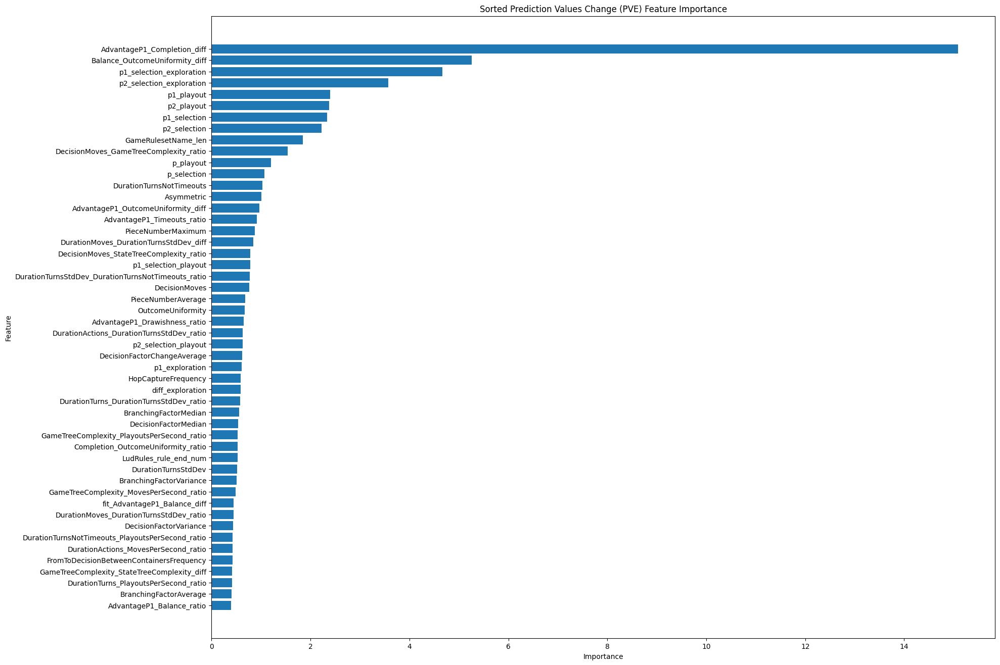

0:	learn: 5.1832370	test: 4.9639303	best: 4.9639303 (0)	total: 105ms	remaining: 17m 30s
200:	learn: 2.8677001	test: 3.7246783	best: 3.7245665 (199)	total: 13.2s	remaining: 10m 43s
400:	learn: 2.5414616	test: 3.6137577	best: 3.6137577 (400)	total: 26.2s	remaining: 10m 26s
600:	learn: 2.3529105	test: 3.5688422	best: 3.5682518 (584)	total: 39.3s	remaining: 10m 14s
800:	learn: 2.2325171	test: 3.5409112	best: 3.5407690 (797)	total: 52.1s	remaining: 9m 58s
1000:	learn: 2.1429490	test: 3.5234682	best: 3.5234682 (1000)	total: 1m 5s	remaining: 9m 44s
1200:	learn: 2.0711012	test: 3.5113751	best: 3.5112585 (1197)	total: 1m 17s	remaining: 9m 30s
1400:	learn: 2.0103649	test: 3.5031142	best: 3.5031142 (1400)	total: 1m 31s	remaining: 9m 18s
1600:	learn: 1.9600621	test: 3.4974110	best: 3.4973080 (1598)	total: 1m 44s	remaining: 9m 6s
1800:	learn: 1.9172455	test: 3.4926000	best: 3.4925009 (1788)	total: 1m 57s	remaining: 8m 54s
2000:	learn: 1.8795591	test: 3.4874456	best: 3.4874400 (1999)	total: 2m 10s	r

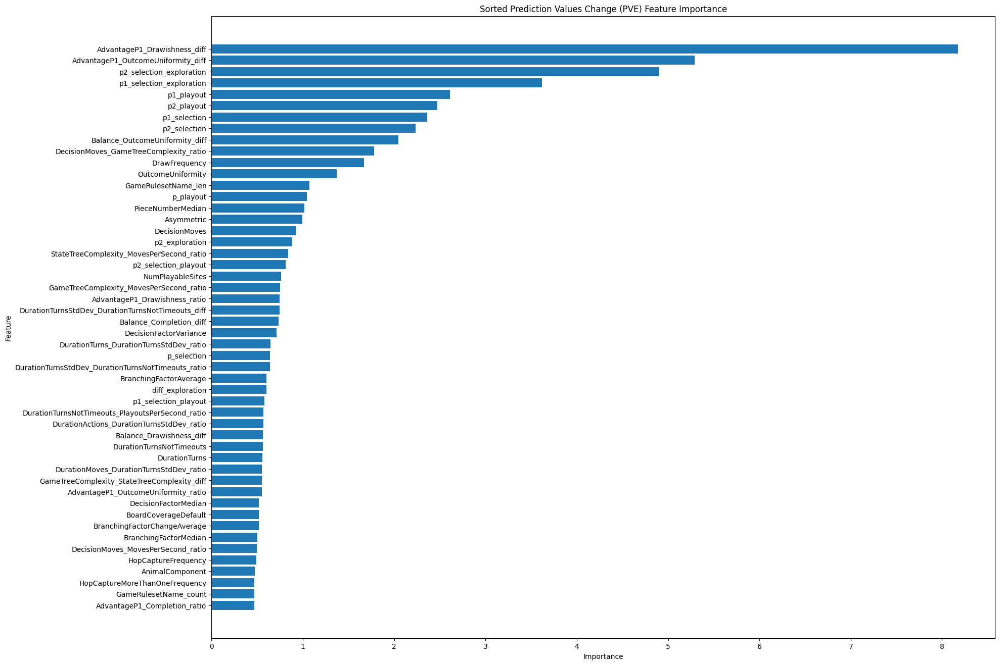

0:	learn: 4.2441009	test: 5.1330384	best: 5.1330384 (0)	total: 99.2ms	remaining: 16m 31s
200:	learn: 1.5352126	test: 2.7932134	best: 2.7930869 (193)	total: 12.4s	remaining: 10m 6s
400:	learn: 1.3586884	test: 2.7520262	best: 2.7520262 (400)	total: 24.9s	remaining: 9m 56s
600:	learn: 1.2683967	test: 2.7401161	best: 2.7392357 (594)	total: 37.5s	remaining: 9m 46s
800:	learn: 1.2112731	test: 2.7302459	best: 2.7302459 (800)	total: 49.8s	remaining: 9m 32s
1000:	learn: 1.1680039	test: 2.7250062	best: 2.7246082 (990)	total: 1m 2s	remaining: 9m 18s
1200:	learn: 1.1350969	test: 2.7215510	best: 2.7214299 (1199)	total: 1m 14s	remaining: 9m 4s
1400:	learn: 1.1061158	test: 2.7187308	best: 2.7187308 (1400)	total: 1m 26s	remaining: 8m 51s
1600:	learn: 1.0791099	test: 2.7166539	best: 2.7166268 (1592)	total: 1m 39s	remaining: 8m 39s
1800:	learn: 1.0568404	test: 2.7142693	best: 2.7142374 (1799)	total: 1m 51s	remaining: 8m 26s
2000:	learn: 1.0358054	test: 2.7122239	best: 2.7121790 (1976)	total: 2m 3s	remai

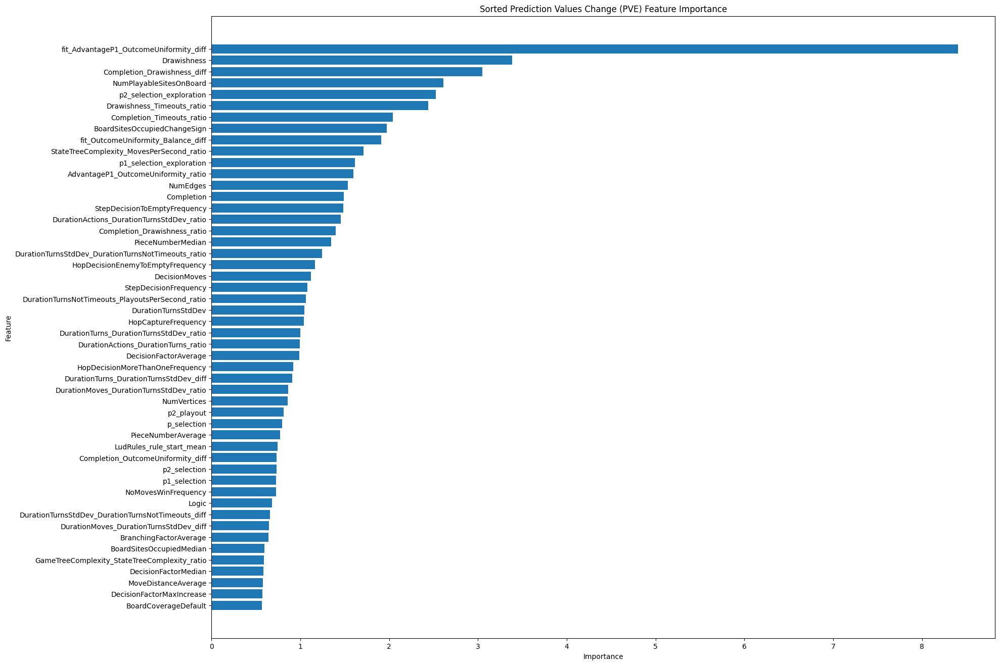

 20%|██        | 1/5 [12:04<48:19, 724.78s/it]

Fold 1 Test RMSE: 0.425
0:	learn: 5.0651773	test: 4.9412883	best: 4.9412883 (0)	total: 100ms	remaining: 16m 42s
200:	learn: 2.7748064	test: 3.5988514	best: 3.5986477 (199)	total: 13.2s	remaining: 10m 43s
400:	learn: 2.4578203	test: 3.4616174	best: 3.4616174 (400)	total: 26.1s	remaining: 10m 24s
600:	learn: 2.2904676	test: 3.4066062	best: 3.4062931 (598)	total: 39.1s	remaining: 10m 10s
800:	learn: 2.1742623	test: 3.3804870	best: 3.3804870 (800)	total: 51.9s	remaining: 9m 56s
1000:	learn: 2.0871840	test: 3.3632007	best: 3.3632007 (1000)	total: 1m 4s	remaining: 9m 42s
1200:	learn: 2.0184019	test: 3.3490233	best: 3.3488945 (1197)	total: 1m 17s	remaining: 9m 29s
1400:	learn: 1.9584224	test: 3.3382573	best: 3.3382553 (1398)	total: 1m 30s	remaining: 9m 16s
1600:	learn: 1.9074126	test: 3.3309159	best: 3.3309159 (1600)	total: 1m 43s	remaining: 9m 4s
1800:	learn: 1.8648970	test: 3.3250744	best: 3.3250590 (1798)	total: 1m 56s	remaining: 8m 52s
2000:	learn: 1.8266810	test: 3.3202052	best: 3.320083

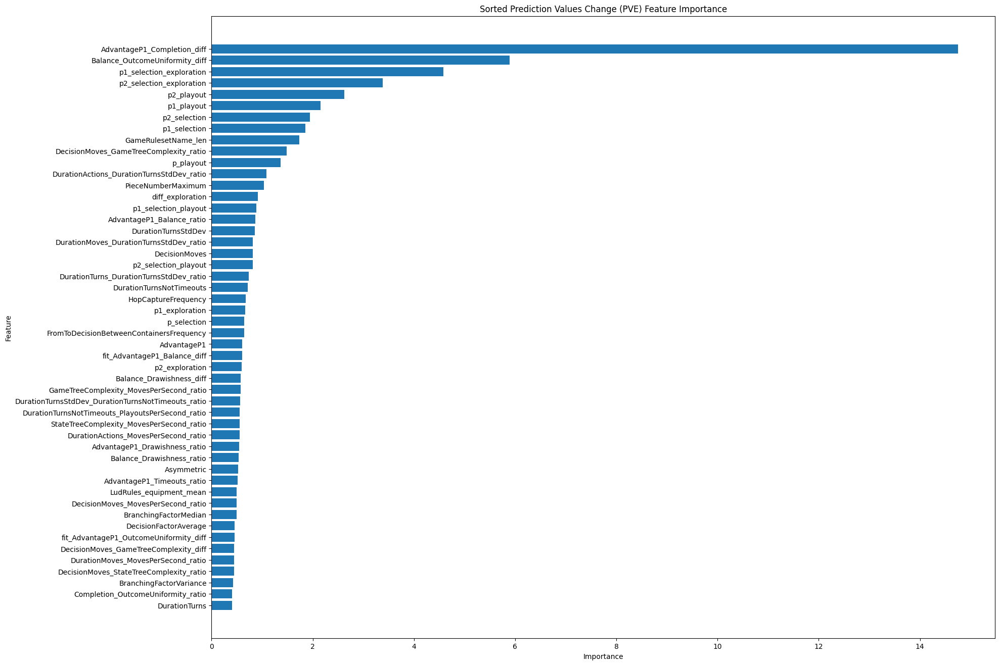

0:	learn: 5.1610748	test: 5.0696206	best: 5.0696206 (0)	total: 102ms	remaining: 16m 58s
200:	learn: 2.8324722	test: 3.6388300	best: 3.6388300 (200)	total: 13.2s	remaining: 10m 45s
400:	learn: 2.5163854	test: 3.5212339	best: 3.5212339 (400)	total: 26.1s	remaining: 10m 24s
600:	learn: 2.3414804	test: 3.4654894	best: 3.4654894 (600)	total: 39.1s	remaining: 10m 11s
800:	learn: 2.2262684	test: 3.4341169	best: 3.4340110 (798)	total: 51.8s	remaining: 9m 55s
1000:	learn: 2.1317890	test: 3.4136440	best: 3.4136440 (1000)	total: 1m 4s	remaining: 9m 41s
1200:	learn: 2.0587878	test: 3.4009489	best: 3.4009489 (1200)	total: 1m 17s	remaining: 9m 29s
1400:	learn: 1.9950065	test: 3.3888277	best: 3.3887591 (1399)	total: 1m 30s	remaining: 9m 18s
1600:	learn: 1.9423752	test: 3.3798973	best: 3.3798973 (1600)	total: 1m 44s	remaining: 9m 6s
1800:	learn: 1.8985277	test: 3.3734977	best: 3.3734977 (1800)	total: 1m 57s	remaining: 8m 54s
2000:	learn: 1.8603284	test: 3.3673749	best: 3.3673749 (2000)	total: 2m 10s	r

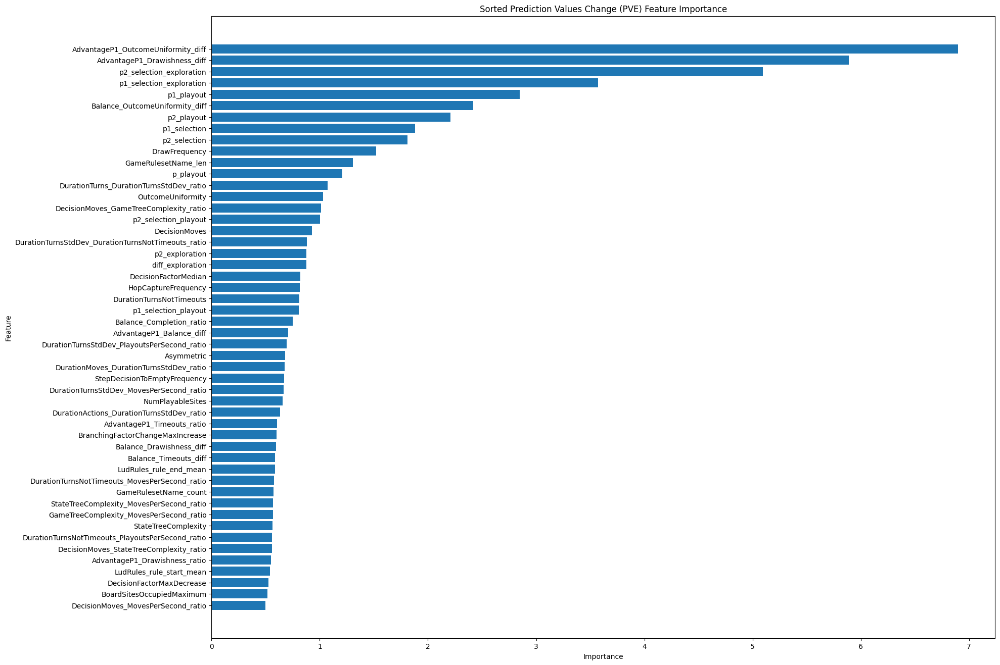

0:	learn: 4.3525221	test: 4.6168295	best: 4.6168295 (0)	total: 98.8ms	remaining: 16m 28s
200:	learn: 1.5056158	test: 2.6694960	best: 2.6694960 (200)	total: 12.5s	remaining: 10m 8s
400:	learn: 1.3494055	test: 2.6196086	best: 2.6196086 (400)	total: 24.9s	remaining: 9m 56s
600:	learn: 1.2575035	test: 2.5878692	best: 2.5878692 (600)	total: 37.3s	remaining: 9m 44s
800:	learn: 1.1975798	test: 2.5746973	best: 2.5746973 (800)	total: 49.9s	remaining: 9m 33s
1000:	learn: 1.1543057	test: 2.5675211	best: 2.5675211 (1000)	total: 1m 2s	remaining: 9m 21s
1200:	learn: 1.1202049	test: 2.5618030	best: 2.5618030 (1200)	total: 1m 14s	remaining: 9m 7s
1400:	learn: 1.0911315	test: 2.5563169	best: 2.5563169 (1400)	total: 1m 27s	remaining: 8m 54s
1600:	learn: 1.0649952	test: 2.5521188	best: 2.5519546 (1597)	total: 1m 39s	remaining: 8m 42s
1800:	learn: 1.0413070	test: 2.5490360	best: 2.5489714 (1790)	total: 1m 52s	remaining: 8m 30s
2000:	learn: 1.0227798	test: 2.5465162	best: 2.5465162 (2000)	total: 2m 4s	rema

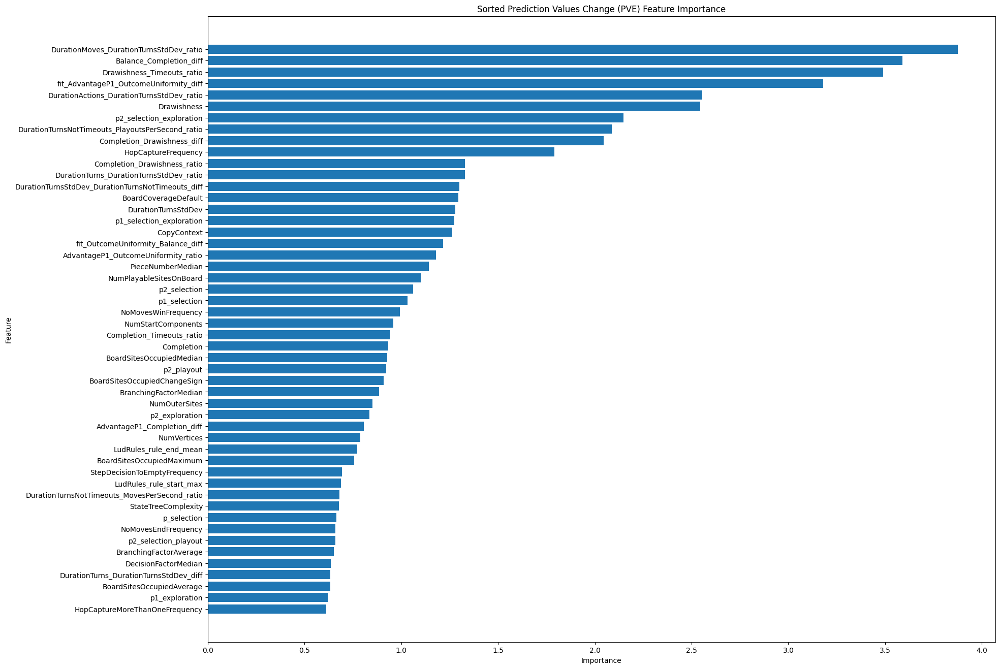

 40%|████      | 2/5 [31:34<49:19, 986.43s/it]

Fold 2 Test RMSE: 0.405
0:	learn: 5.1494107	test: 4.5986372	best: 4.5986372 (0)	total: 106ms	remaining: 17m 37s
200:	learn: 2.8375313	test: 3.5325450	best: 3.5325450 (200)	total: 12.8s	remaining: 10m 23s
400:	learn: 2.4979957	test: 3.4222596	best: 3.4222596 (400)	total: 25.6s	remaining: 10m 12s
600:	learn: 2.3095200	test: 3.3739771	best: 3.3739771 (600)	total: 38.4s	remaining: 10m
800:	learn: 2.1903147	test: 3.3468235	best: 3.3468235 (800)	total: 51.1s	remaining: 9m 46s
1000:	learn: 2.0962346	test: 3.3275181	best: 3.3275181 (1000)	total: 1m 3s	remaining: 9m 33s
1200:	learn: 2.0223097	test: 3.3157679	best: 3.3157554 (1199)	total: 1m 16s	remaining: 9m 20s
1400:	learn: 1.9630024	test: 3.3087384	best: 3.3086786 (1397)	total: 1m 29s	remaining: 9m 7s
1600:	learn: 1.9126145	test: 3.3053282	best: 3.3051596 (1597)	total: 1m 42s	remaining: 8m 55s
1800:	learn: 1.8700551	test: 3.3002878	best: 3.3002773 (1797)	total: 1m 54s	remaining: 8m 43s
2000:	learn: 1.8328910	test: 3.2970708	best: 3.2970049 (1

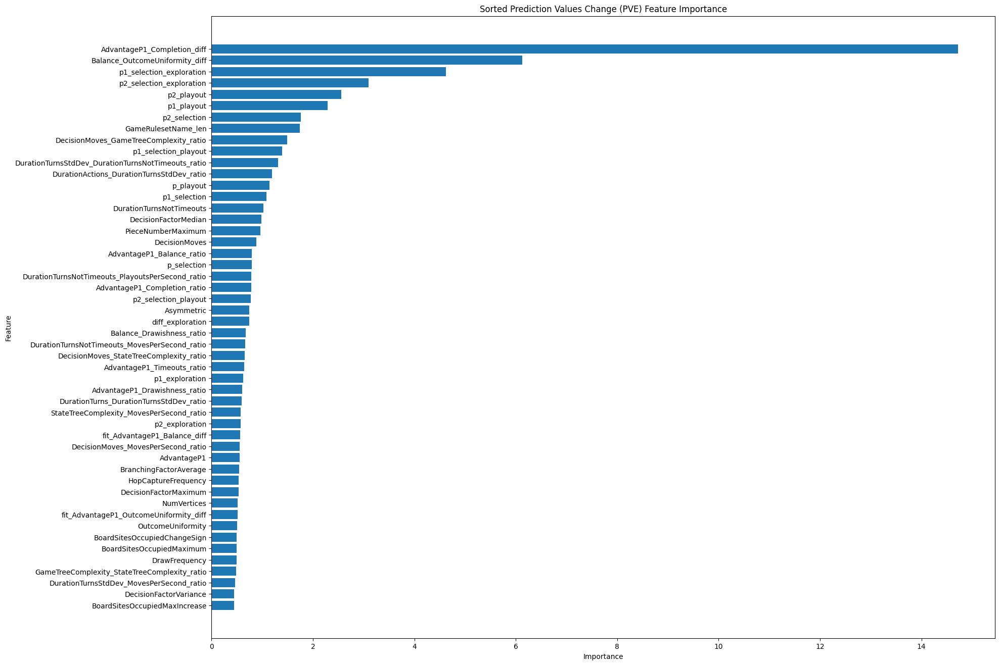

0:	learn: 5.2348771	test: 4.7774403	best: 4.7774403 (0)	total: 103ms	remaining: 17m 6s
200:	learn: 2.8423971	test: 3.6613904	best: 3.6613904 (200)	total: 13s	remaining: 10m 35s
400:	learn: 2.5000729	test: 3.5643992	best: 3.5643992 (400)	total: 25.9s	remaining: 10m 19s
600:	learn: 2.3060535	test: 3.5190213	best: 3.5189713 (599)	total: 38.9s	remaining: 10m 8s
800:	learn: 2.1861679	test: 3.4950278	best: 3.4950272 (796)	total: 51.7s	remaining: 9m 53s
1000:	learn: 2.0973314	test: 3.4844436	best: 3.4842587 (992)	total: 1m 4s	remaining: 9m 39s
1200:	learn: 2.0262381	test: 3.4761253	best: 3.4760278 (1197)	total: 1m 17s	remaining: 9m 25s
1400:	learn: 1.9667679	test: 3.4689689	best: 3.4686453 (1392)	total: 1m 30s	remaining: 9m 13s
1600:	learn: 1.9177333	test: 3.4642667	best: 3.4642113 (1598)	total: 1m 42s	remaining: 9m
1800:	learn: 1.8759073	test: 3.4598641	best: 3.4598641 (1800)	total: 1m 55s	remaining: 8m 46s
2000:	learn: 1.8389773	test: 3.4571133	best: 3.4571133 (2000)	total: 2m 8s	remaining:

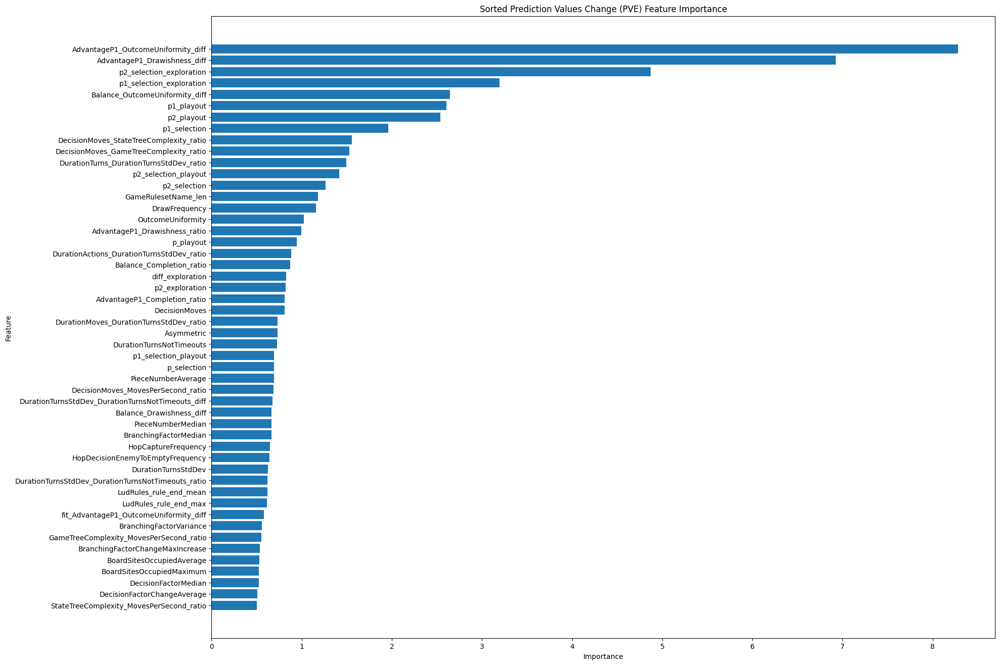

0:	learn: 4.4480700	test: 4.1799943	best: 4.1799943 (0)	total: 92.6ms	remaining: 15m 25s
200:	learn: 1.5607979	test: 2.5907362	best: 2.5907362 (200)	total: 12.5s	remaining: 10m 10s
400:	learn: 1.3795574	test: 2.5634921	best: 2.5634132 (399)	total: 25.1s	remaining: 9m 59s
600:	learn: 1.2842897	test: 2.5523674	best: 2.5523674 (600)	total: 37.5s	remaining: 9m 47s
800:	learn: 1.2258310	test: 2.5521490	best: 2.5519306 (775)	total: 49.8s	remaining: 9m 32s
bestTest = 2.55172667
bestIteration = 885
Shrink model to first 886 iterations.


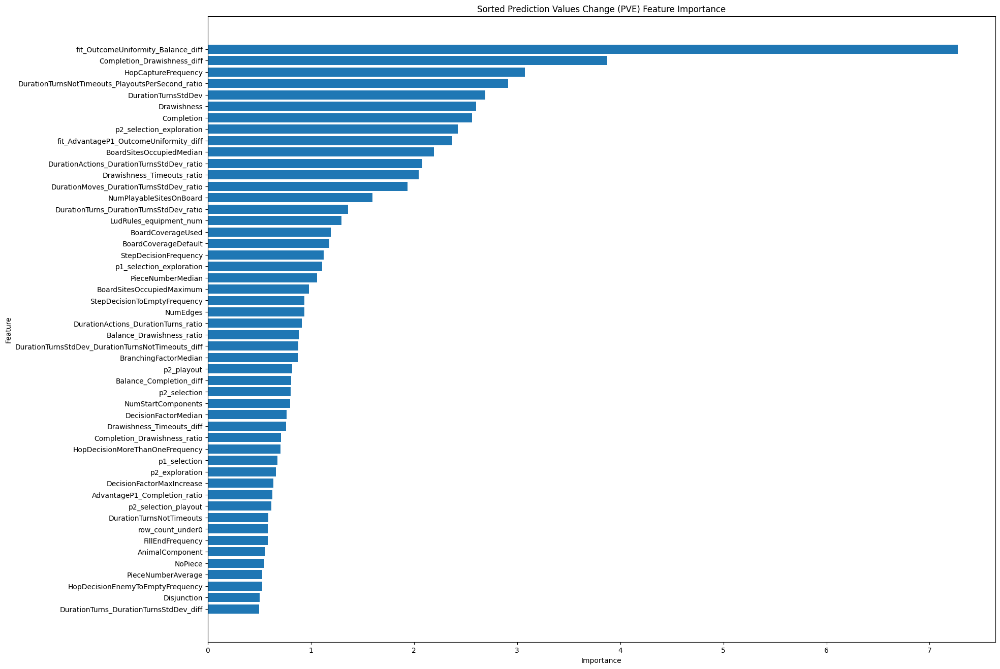

 60%|██████    | 3/5 [39:53<25:27, 763.84s/it]

Fold 3 Test RMSE: 0.417
0:	learn: 5.0750946	test: 4.9338119	best: 4.9338119 (0)	total: 103ms	remaining: 17m 13s
200:	learn: 2.7881955	test: 3.5542637	best: 3.5542637 (200)	total: 12.9s	remaining: 10m 29s
400:	learn: 2.4733180	test: 3.4223991	best: 3.4223991 (400)	total: 25.6s	remaining: 10m 13s
600:	learn: 2.2905423	test: 3.3676490	best: 3.3676490 (600)	total: 38.5s	remaining: 10m 1s
800:	learn: 2.1691188	test: 3.3366660	best: 3.3363185 (794)	total: 51.2s	remaining: 9m 48s
1000:	learn: 2.0755597	test: 3.3166184	best: 3.3166184 (1000)	total: 1m 3s	remaining: 9m 35s
1200:	learn: 2.0055959	test: 3.3052576	best: 3.3052576 (1200)	total: 1m 16s	remaining: 9m 22s
1400:	learn: 1.9455625	test: 3.2966328	best: 3.2965922 (1399)	total: 1m 29s	remaining: 9m 10s
1600:	learn: 1.8958128	test: 3.2886964	best: 3.2886964 (1600)	total: 1m 42s	remaining: 8m 57s
1800:	learn: 1.8534152	test: 3.2827032	best: 3.2825672 (1794)	total: 1m 55s	remaining: 8m 45s
2000:	learn: 1.8174720	test: 3.2788500	best: 3.278544

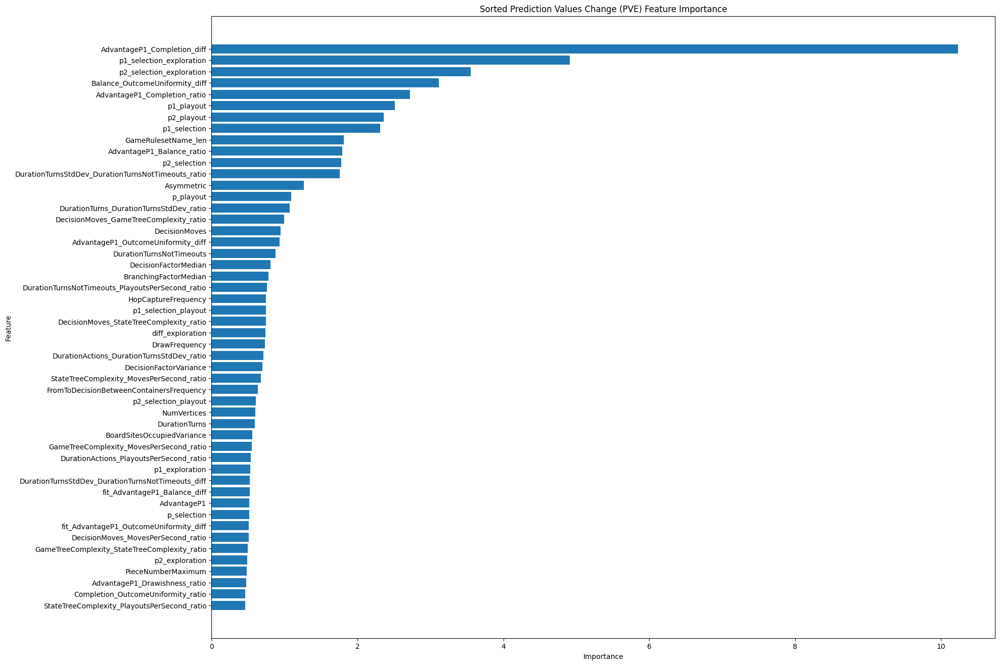

0:	learn: 5.2076592	test: 4.8939838	best: 4.8939838 (0)	total: 103ms	remaining: 17m 8s
200:	learn: 2.8526469	test: 3.5059775	best: 3.5059775 (200)	total: 13s	remaining: 10m 34s
400:	learn: 2.5278591	test: 3.3658396	best: 3.3658396 (400)	total: 25.9s	remaining: 10m 20s
600:	learn: 2.3486724	test: 3.3147558	best: 3.3147558 (600)	total: 39s	remaining: 10m 9s
800:	learn: 2.2286671	test: 3.2834583	best: 3.2834583 (800)	total: 51.9s	remaining: 9m 55s
1000:	learn: 2.1354327	test: 3.2679788	best: 3.2678450 (998)	total: 1m 4s	remaining: 9m 41s
1200:	learn: 2.0643891	test: 3.2549406	best: 3.2549406 (1200)	total: 1m 17s	remaining: 9m 27s
1400:	learn: 2.0043943	test: 3.2447795	best: 3.2447795 (1400)	total: 1m 30s	remaining: 9m 15s
1600:	learn: 1.9534771	test: 3.2366596	best: 3.2366596 (1600)	total: 1m 43s	remaining: 9m 2s
1800:	learn: 1.9102573	test: 3.2318584	best: 3.2316543 (1797)	total: 1m 56s	remaining: 8m 49s
2000:	learn: 1.8718219	test: 3.2272819	best: 3.2272713 (1998)	total: 2m 9s	remaining

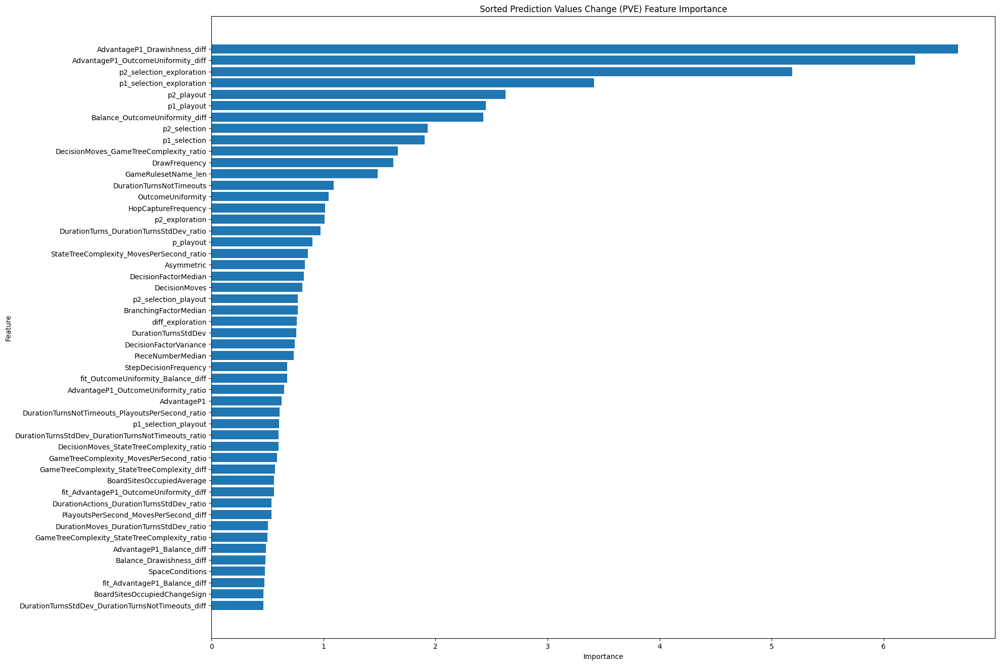

0:	learn: 4.4773638	test: 4.0319902	best: 4.0319902 (0)	total: 97.7ms	remaining: 16m 16s
200:	learn: 1.5429626	test: 2.4610830	best: 2.4610830 (200)	total: 12.4s	remaining: 10m 4s
400:	learn: 1.3718573	test: 2.4350515	best: 2.4349777 (397)	total: 24.9s	remaining: 9m 55s
600:	learn: 1.2741637	test: 2.4206472	best: 2.4205155 (598)	total: 37.5s	remaining: 9m 45s
800:	learn: 1.2126096	test: 2.4169483	best: 2.4168104 (745)	total: 50s	remaining: 9m 34s
1000:	learn: 1.1699920	test: 2.4138152	best: 2.4136976 (995)	total: 1m 2s	remaining: 9m 19s
1200:	learn: 1.1349001	test: 2.4119753	best: 2.4119753 (1200)	total: 1m 14s	remaining: 9m 7s
bestTest = 2.41047997
bestIteration = 1223
Shrink model to first 1224 iterations.


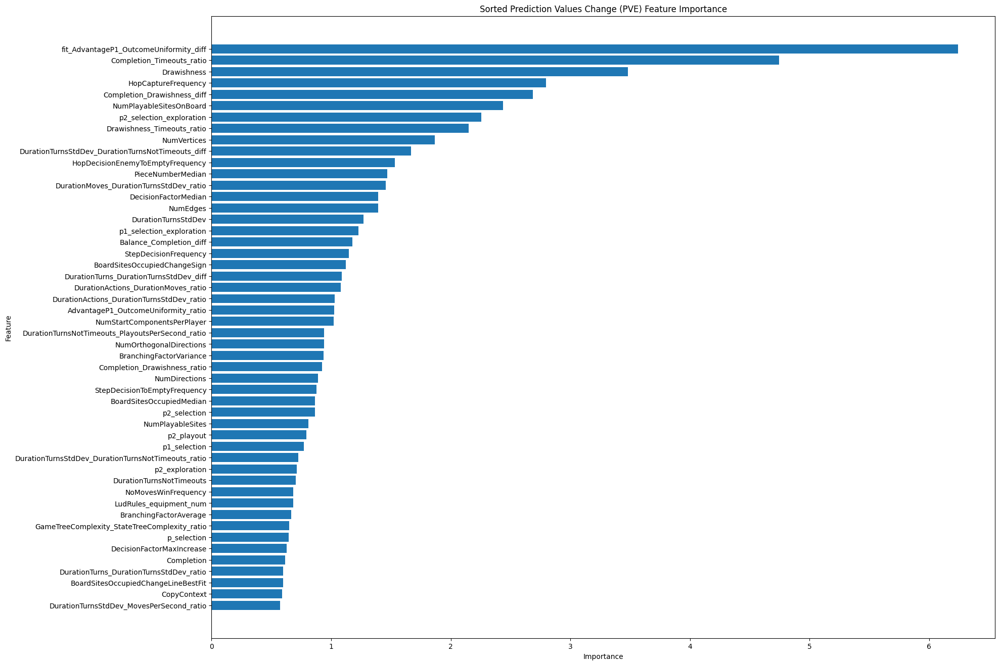

 80%|████████  | 4/5 [50:50<12:01, 721.76s/it]

Fold 4 Test RMSE: 0.400
0:	learn: 4.8151798	test: 5.6328159	best: 5.6328159 (0)	total: 98.5ms	remaining: 6m 34s
200:	learn: 2.8612533	test: 4.3992681	best: 4.3992681 (200)	total: 12s	remaining: 3m 46s
400:	learn: 2.5369150	test: 4.3754793	best: 4.3754574 (398)	total: 23.8s	remaining: 3m 33s
600:	learn: 2.3609428	test: 4.3741443	best: 4.3722604 (415)	total: 35.6s	remaining: 3m 21s
800:	learn: 2.2402992	test: 4.3626239	best: 4.3599740 (777)	total: 47.5s	remaining: 3m 9s
1000:	learn: 2.1501946	test: 4.3618825	best: 4.3599740 (777)	total: 59.3s	remaining: 2m 57s
1200:	learn: 2.0805771	test: 4.3663021	best: 4.3599740 (777)	total: 1m 11s	remaining: 2m 45s
1400:	learn: 2.0175705	test: 4.3609017	best: 4.3599740 (777)	total: 1m 22s	remaining: 2m 33s
1600:	learn: 1.9680448	test: 4.3595140	best: 4.3591771 (1554)	total: 1m 34s	remaining: 2m 22s
1800:	learn: 1.9238225	test: 4.3584929	best: 4.3576460 (1680)	total: 1m 46s	remaining: 2m 10s
2000:	learn: 1.8854732	test: 4.3603551	best: 4.3576460 (1680)

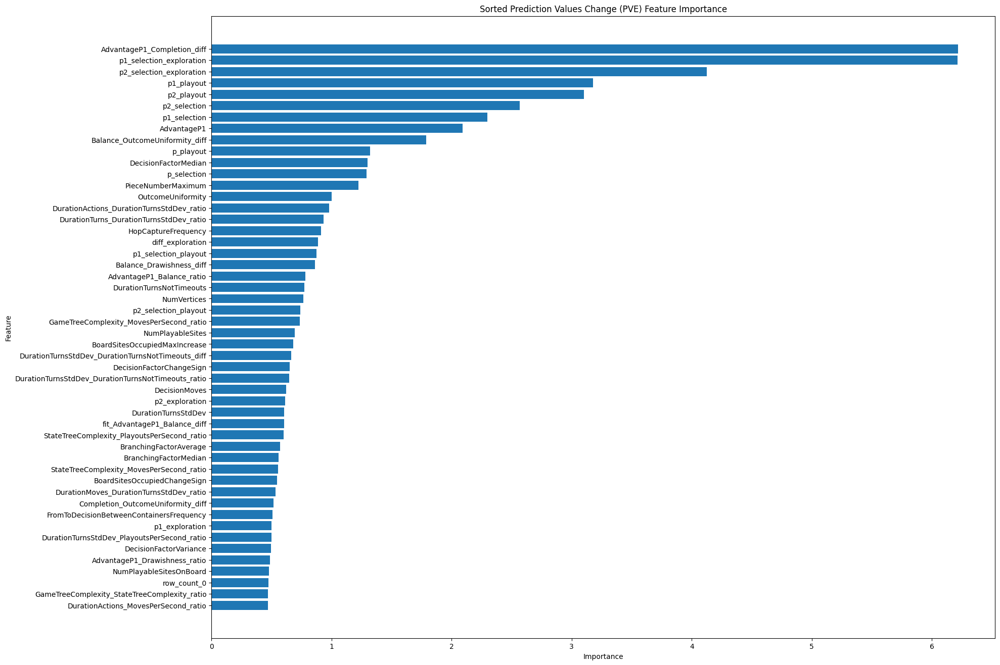

0:	learn: 4.8888281	test: 5.7964644	best: 5.7964644 (0)	total: 99.6ms	remaining: 6m 38s
200:	learn: 2.9042581	test: 4.7486108	best: 4.7486108 (200)	total: 12.1s	remaining: 3m 48s
400:	learn: 2.5830834	test: 4.6971506	best: 4.6971506 (400)	total: 24s	remaining: 3m 35s
600:	learn: 2.4093303	test: 4.6816038	best: 4.6815981 (599)	total: 35.9s	remaining: 3m 22s
800:	learn: 2.2925713	test: 4.6700161	best: 4.6699496 (799)	total: 47.6s	remaining: 3m 10s
1000:	learn: 2.2038612	test: 4.6638204	best: 4.6637311 (999)	total: 59.5s	remaining: 2m 58s
1200:	learn: 2.1322252	test: 4.6620588	best: 4.6609200 (1183)	total: 1m 11s	remaining: 2m 46s
1400:	learn: 2.0737937	test: 4.6610744	best: 4.6607939 (1394)	total: 1m 23s	remaining: 2m 34s
1600:	learn: 2.0211406	test: 4.6589181	best: 4.6589181 (1600)	total: 1m 35s	remaining: 2m 22s
1800:	learn: 1.9745716	test: 4.6586047	best: 4.6579069 (1785)	total: 1m 47s	remaining: 2m 10s
2000:	learn: 1.9322781	test: 4.6569999	best: 4.6569999 (2000)	total: 1m 59s	remain

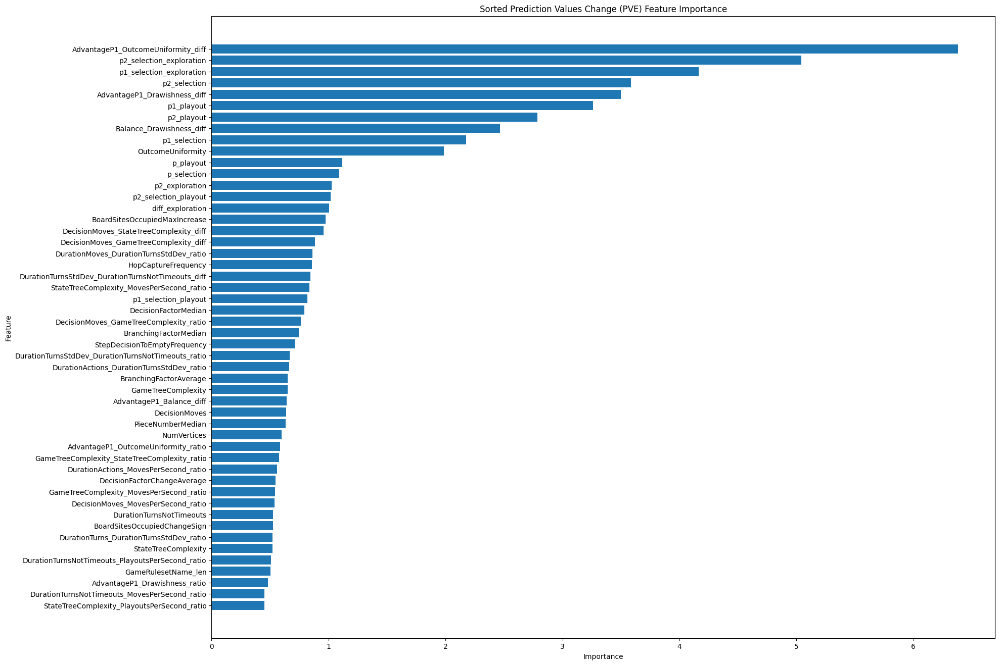

0:	learn: 4.4402455	test: 4.3195299	best: 4.3195299 (0)	total: 89.8ms	remaining: 1m 29s
200:	learn: 1.5256380	test: 2.9707015	best: 2.9592210 (189)	total: 11.4s	remaining: 45.2s
400:	learn: 1.3706285	test: 2.9737022	best: 2.9592210 (189)	total: 22.7s	remaining: 33.9s
600:	learn: 1.2954883	test: 2.9895522	best: 2.9592210 (189)	total: 34s	remaining: 22.6s
800:	learn: 1.2433283	test: 2.9995717	best: 2.9592210 (189)	total: 45.3s	remaining: 11.2s
999:	learn: 1.2022404	test: 3.0179955	best: 2.9592210 (189)	total: 56.4s	remaining: 0us
bestTest = 2.959220996
bestIteration = 189


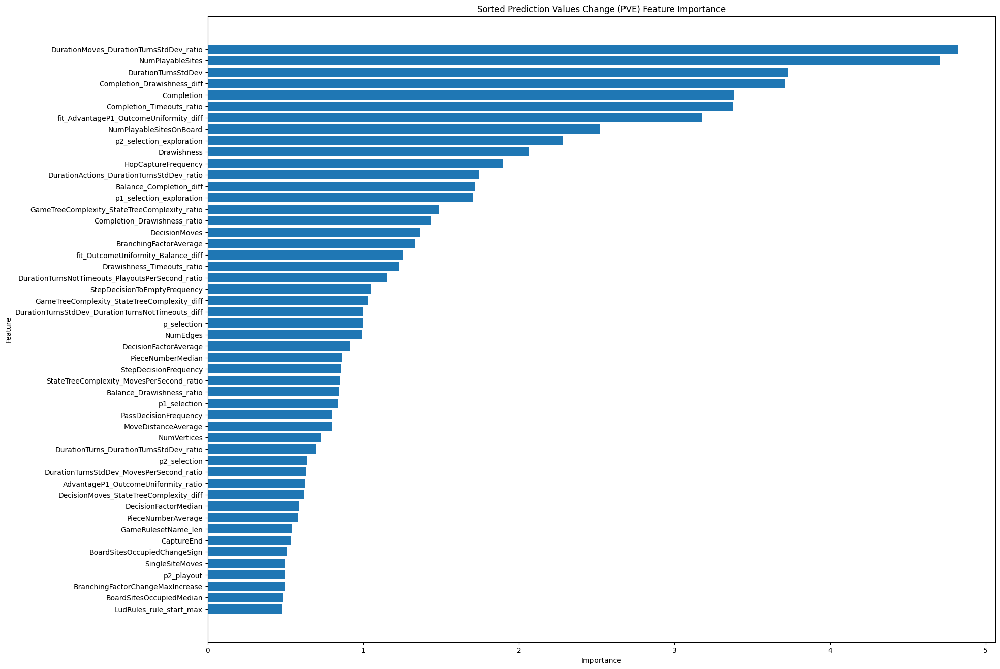

100%|██████████| 5/5 [1:00:36<00:00, 727.27s/it]

Fold 5 Test RMSE: 0.562

--- Final Mean Scores ---
Mean Test RMSE: 0.4415546911019801

=== KFold RMSE Results ===
   Fold  Test RMSE
0     1   0.424759
1     2   0.404573
2     3   0.416734
3     4   0.399881
4     5   0.561826


In [ ]:
from catboost import CatBoostRegressor, Pool,CatBoostClassifier
a = TrainML_cb_3tar(train)

## アンサンブル

In [ ]:
import joblib

model_single = [joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline16/0928_model_fold{fold}.pickle") for fold in range(5)]
models1 = [joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline17/0928_model1_fold{fold}.pickle") for fold in range(5)]
models2 = [joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline17/0928_model2_fold{fold}.pickle") for fold in range(5)]
models3 = [joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline17/0928_model3_fold{fold}.pickle") for fold in range(5)]



In [ ]:
test_rmse_scores = []
for fold in tqdm(range(n_splits)):

    train_df = train[train["fold"] != fold]
    test_df = train[train["fold"] == fold]

    drop_cols = ['utility_agent1',"fold",'num_losses_agent1','num_wins_agent1', 'num_draws_agent1']


    X_train = train_df.drop(drop_cols, axis=1)
    y_train = train_df['utility_agent1']
    X_test = test_df.drop(drop_cols, axis=1)
    y_test = test_df['utility_agent1']

    y_test_pred = model_single[fold].predict(X_test)
    y_test_pred_1 = models1[fold].predict(X_test)
    y_test_pred_2 = models2[fold].predict(X_test)
    y_test_pred_3 = models3[fold].predict(X_test)
    y_test_pred_gg = (y_test_pred_2-y_test_pred_1)/(y_test_pred_1+y_test_pred_2+y_test_pred_3)

    y_test_pred_sum = y_test_pred*0.4+y_test_pred_gg*0.6

    test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred_sum.clip(-1,1)))
    test_rmse_scores.append(test_rmse)

    print(f"Fold {fold+1} Test RMSE: {test_rmse:.3f}")


print("\n--- Final Mean Scores ---")
print(f"Mean Test RMSE: {np.mean(test_rmse_scores)}")

results_df = pd.DataFrame({
    'Fold': np.arange(1, n_splits+1),
    'Test RMSE': test_rmse_scores
})

print("\n=== KFold RMSE Results ===")
print(results_df)

 20%|██        | 1/5 [00:02<00:09,  2.37s/it]

Fold 1 Test RMSE: 0.405


 40%|████      | 2/5 [00:04<00:05,  2.00s/it]

Fold 2 Test RMSE: 0.424


 60%|██████    | 3/5 [00:06<00:04,  2.22s/it]

Fold 3 Test RMSE: 0.434


 80%|████████  | 4/5 [00:08<00:02,  2.27s/it]

Fold 4 Test RMSE: 0.408


100%|██████████| 5/5 [00:10<00:00,  2.19s/it]

Fold 5 Test RMSE: 0.398

--- Final Mean Scores ---
Mean Test RMSE: 0.41378628432811027

=== KFold RMSE Results ===
   Fold  Test RMSE
0     1   0.405019
1     2   0.423708
2     3   0.434197
3     4   0.407842
4     5   0.398166


# SVR

In [ ]:
df = train.copy()

In [ ]:
cat_list = list(df.select_dtypes(include=['object', 'category']).columns)
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
for col in cat_list:
    df[col] = le.fit_transform(df[col])

In [ ]:
from sklearn.svm import SVR





for fold in tqdm(range(n_splits)):

    train_df = df[df["fold"] != fold]
    test_df = df[df["fold"] == fold]

    drop_cols = ['utility_agent1',"fold",'num_losses_agent1','num_wins_agent1', 'num_draws_agent1',]#+remove_encoded

    X_train = train_df.drop(drop_cols, axis=1)
    y_train = train_df['utility_agent1']
    X_test = test_df.drop(drop_cols, axis=1)
    y_test = test_df['utility_agent1']

    scaler = StandardScaler()
    X_norm = scaler.fit_transform(X_train)
    # テストデータも標準化
    Xtest_norm = scaler.transform(X_test)

    reg_linear = SVR(kernel='linear', C=1, epsilon=0.1, gamma='auto')
    reg_poly = SVR(kernel='poly', C=1, epsilon=0.1, gamma='auto')
    reg_rbf = SVR(kernel='rbf', C=1, epsilon=0.1, gamma='auto')

    reg_linear.fit(X_norm, np.ravel(y_train))
    reg_poly.fit(X_norm, np.ravel(y_train))
    reg_rbf.fit(X_norm, np.ravel(y_train))

    y_test_pred_linear = reg_linear.predict(Xtest_norm).clip(-1,1)
    y_test_pred_poly = reg_poly.predict(Xtest_norm).clip(-1,1)
    y_test_pred_rbf = reg_rbf.predict(Xtest_norm).clip(-1,1)

    print(np.sqrt(mean_squared_error(y_test, y_test_pred_linear)))
    print(np.sqrt(mean_squared_error(y_test, y_test_pred_poly)))
    print(np.sqrt(mean_squared_error(y_test, y_test_pred_rbf)))

  0%|          | 0/5 [00:00<?, ?it/s]

# MLP

In [ ]:
!pip uninstall keras

Found existing installation: keras 3.4.1
Uninstalling keras-3.4.1:
  Would remove:
    /usr/local/lib/python3.10/dist-packages/keras-3.4.1.dist-info/*
    /usr/local/lib/python3.10/dist-packages/keras/*
Proceed (Y/n)? y
  Successfully uninstalled keras-3.4.1


In [ ]:
!pip install tensorflow --upgrade

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 50.7 MB/s eta 0:00:00


In [ ]:
!!pip install tensorflow-addons

['Requirement already satisfied: tensorflow-addons in /usr/local/lib/python3.10/dist-packages (0.23.0)',
 'Requirement already satisfied: packaging in /usr/local/lib/python3.10/dist-packages (from tensorflow-addons) (24.1)',
 'Requirement already satisfied: typeguard<3.0.0,>=2.7 in /usr/local/lib/python3.10/dist-packages (from tensorflow-addons) (2.13.3)']

In [ ]:
from sklearn.neural_network import  MLPRegressor
from sklearn.preprocessing import StandardScaler

In [ ]:
df = train.copy()

In [ ]:
cat_list = list(df.select_dtypes(include=['object', 'category']).columns)
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
for col in cat_list:
    df[col] = le.fit_transform(df[col])

In [ ]:
lowfeatureimportancecols = ['PolygonShape', 'PiecesPlacedOutsideBoard', 'ReachDrawFrequency',
       'Territory', 'RightwardsDirection', 'ShogiComponent',
        'Scoring', 'KingComponent', 'Cooperation',
       'PiecesPlacedOnBoard', 'ShowPieceState', 'ShogiStyle',
       'VisitedSites', 'JanggiComponent', 'SowProperties', 'AutoMove',
       'Edge', 'Track', 'TrackLoop', 'Boardless', 'Loop', 'TableStyle',
       'DirectionCaptureFrequency', 'ReachLossFrequency',
       'RotationDecisionFrequency', 'JanggiStyle',
       'SlideDecisionToFriendFrequency', 'LoopEndFrequency',
       'PloyComponent', 'InterveneCaptureFrequency',
       'NumOffDiagonalDirections', 'EliminatePiecesDrawFrequency',
       'Repetition', 'InitialCost', 'TurnKo', 'Stochastic',
       'XiangqiComponent', 'NoPieceMover', 'SumDice', 'PositionalSuperko',
       'ChessComponent', 'NoTargetPiece', 'ProposeEffectFrequency',
       'Meta', 'BackgammonStyle', 'PieceRotation',
       'BranchingFactorChangeNumTimesn', 'XiangqiStyle', 'NoBoard',
       'Implementation', 'SetCountFrequency', 'StackType', 'StateType',
       'SameDirection', 'ChessStyle', 'ForwardDirection',
       'HopDecisionFriendToFriendFrequency', 'RotationalDirection',
       'Pattern', 'PawnComponent', 'Directions', 'RookComponent',
       'MaxDistance', 'PieceValue', 'ForwardLeftDirection',
       'QueenComponent', 'Threat', 'NoOwnPiecesLossFrequency',
       'SetInternalCounter', 'OppositeDirection', 'NoMovesDrawFrequency',
       'InternalCounter', 'RelativeDirections', 'MaxMovesInTurn',
       'HopDecisionEnemyToEnemyFrequency', 'ScoringLossFrequency',
       'InitialRandomPlacement', 'Efficiency', 'ProgressCheck',
       'StrategoComponent', 'BishopComponent',
       'PromotionDecisionFrequency', 'Tile', 'ByDieMove',
       'BackwardDirection', 'CanNotMove', 'GroupEndFrequency',
       'ForgetValues', 'PieceNumberChangeNumTimes', 'TaflComponent',
       'IsEnemy', 'FlipFrequency', 'SetVar', 'FillWinFrequency',
       'PatternEndFrequency', 'Stack', 'Fill', 'GroupWinFrequency',
       'ScoreDifferenceMedian', 'ShowPieceValue',
       'NoTargetPieceWinFrequency', 'ShootDecisionFrequency',
       'CountPiecesMoverComparison', 'NoPiece',
       'SwapPiecesDecisionFrequency', 'Visual', 'Phase',
       'ForwardsDirection', 'Piece', 'LargePiece', 'NumDice',
       'KnightComponent', 'Style', 'ProposeDecisionFrequency',
       'FillEndFrequency', 'RollFrequency',
       'EliminatePiecesLossFrequency', 'Moves', 'BoardStyle',
       'SetSiteState', 'InitialScore', 'TerritoryEndFrequency',
       'SetValueFrequency', 'DiagonalDirection', 'AbsoluteDirections',
       'LineLossFrequency', 'HopDecisionFriendToEmptyFrequency',
       'RightwardDirection', 'ScoringEndFrequency', 'GraphStyle',
       'BackwardsDirection', 'LeapDecisionToEmptyFrequency', 'Variable',
       'BackwardLeftDirection', 'NoOwnPiecesEndFrequency',
       'HopDecisionFriendToEnemyFrequency', 'NumComponentsType', 'Group',
       'Capture', 'MovesDecision', 'FromToDecisionFrequency',
       'CaptureSequenceFrequency', 'NoProgressEndFrequency', 'Connection',
       'SiteState', 'NoOwnPiecesWinFrequency', 'CountPiecesComparison',
       'RegularShape', 'CheckmateFrequency', 'PlayerValue',
       'RaceEnd', 'Intersection', 'Completion',
       'ConnectionLossFrequency', 'CountPiecesNextComparison',
       'PieceNumberMaxIncrease', 'TrackOwned', 'NoMovesNext', 'IsFriend',
       'SurroundCaptureFrequency', 'MovesEffects',
       'NumLayers', 'NoMovesMover', 'OpeningContract',
       'FairyChessComponent', 'Misere', 'LineOfSight',
       'LeapDecisionFrequency', 'ConnectionEndFrequency',
       'PushEffectFrequency', 'SetPending', 'SowCW', 'NumContainers',
       'ScoringWinFrequency', 'RememberValues', 'Math', 'Priority',
       'EncloseCaptureFrequency', 'CheckmateWinFrequency',
       'FromToDecisionEnemyFrequency', 'CanMove', 'BallComponent',
       'NoMoves', 'ComponentStyle', 'Trigger',
       'LeapDecisionToEnemyFrequency', 'Symbols', 'IsPieceAt',
       'ConcentricTiling', 'PromotionEffectFrequency',
       'SlideDecisionToEnemyFrequency', 'MovesNonDecision', 'TaflStyle',
       'NoMovesWinFrequency', 'StepDecisionToFriendFrequency', 'SowCCW',
       'Conditions', 'SowSkip', 'TwoSitesMoves', 'PieceState',
       'SowBacktrackingFrequency', 'IsEmpty',
       'MoveDistanceMaxIncrease', 'Complement',
       'BoardSitesOccupiedChangeNumTimes', 'Distance',
       'FromToDecisionFriendFrequency', 'NoMovesLossFrequency',
       'DiscComponent', 'Vertex', 'MoveDistanceChangeNumTimes', 'Start',
       'SurakartaStyle', 'Algorithmics', 'DoLudeme', 'ForEachPiece',
       'SowRemoveFrequency', 'SingleSiteMoves', 'Timeouts',
       'HopCaptureMoreThanOneFrequency', 'SpaceEnd', 'AddEffectFrequency',
       'CustodialCaptureFrequency', 'BoardSitesOccupiedChangeLineBestFit',
       'AnimalComponent', 'MarkerComponent',
       'FromToDecisionWithinBoardFrequency', 'NoSiteMoves',
       'Timeouts/DurationActions', 'MancalaStores', 'PenAndPaperStyle',
       'NoMovesEndFrequency', 'Union', 'AdjacentDirection',
       'NoTargetPieceEndFrequency', 'GoStyle', 'LudRules_phase_max',
       'NoPieceNext', 'StepDecisionToEnemyFrequency',
       'ConnectionWinFrequency', 'ConditionalStatement', 'CopyContext',
       'ReachEndFrequency']
for col in lowfeatureimportancecols:
    if col in df.columns:
        df = df.drop(col,axis=1)

In [ ]:
from tensorflow.keras.layers import Input, Dense, Dropout, Add, Activation, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam

import tensorflow.keras.backend as K
from tensorflow.keras.callbacks import ReduceLROnPlateau


class Model1NN:
    def __init__(self):
        self.model = None
        self.scaler = None

    def root_mean_squared_error(self, y_true, y_pred):
        """RMSEを計算するカスタムメトリック"""
        return K.sqrt(K.mean(K.square(y_pred - y_true)))

    def fit(self, tr_x, tr_y, va_x, va_y):
        self.scaler = StandardScaler()
        self.scaler.fit(tr_x)

        batch_size = 512
        epochs = 50

        tr_x = self.scaler.transform(tr_x)
        va_x = self.scaler.transform(va_x)

        early_stopping =  EarlyStopping(
                            monitor='val_loss',
                            min_delta=0.0,
                            patience=5,
                            restore_best_weights=True
        )
        reduce_lr = ReduceLROnPlateau(
                        monitor='val_loss',
                        factor=0.5,
                        patience=10,
                        min_lr=1e-6
        )

        def build_resnet_model(input_shape):
            # 入力層
            inputs = Input(shape=input_shape)

            # 最初の層（残差接続なし）
            x = BatchNormalization()(inputs)
            x = Dense(512, activation='relu')(x)
            x = Dropout(0.3)(x)

            # 残差接続ブロック 1
            # residual = x  # 残差を保存
            # x = BatchNormalization()(x)
            # x = Dense(256, activation='relu')(x)
            # x = Dropout(0.3)(x)
            # x = Dense(512)(x)  # 元の512ユニットに戻す
            # x = BatchNormalization()(x)
            # x = Add()([x, residual])  # 残差を加算
            # x = Activation('relu')(x)
            # x = Dropout(0.3)(x)

            # # # 減らす層
            x = BatchNormalization()(x)
            x = Dense(256, activation='relu')(x)
            x = Dropout(0.3)(x)

            # 残差接続ブロック 2
            # residual = x  # 再度残差を保存
            # x = BatchNormalization()(x)
            # x = Dense(128, activation='relu')(x)
            # x = Dropout(0.3)(x)
            # x = Dense(256)(x)  # 元の512ユニットに戻す
            # x = BatchNormalization()(x)
            # x = Add()([x, residual])  # 残差を加算
            # x = Activation('relu')(x)
            # x = Dropout(0.3)(x)

            # # # 減らす層
            x = BatchNormalization()(x)
            x = Dense(64, activation='relu')(x)
            x = Dropout(0.3)(x)

            # # 残差接続ブロック 3
            # residual = x  # 再度残差を保存
            # x = BatchNormalization()(x)
            # x = Dense(64, activation='relu')(x)
            # x = Dropout(0.5)(x)
            # x = Dense(256)(x)  # 元の512ユニットに戻す
            # x = BatchNormalization()(x)
            # x = Add()([x, residual])  # 残差を加算
            # x = Activation('relu')(x)
            # x = Dropout(0.5)(x)

            # # # 減らす層
            x = Dense(32, activation='relu')(x)
            # x = BatchNormalization()(x)
            x = Activation('relu')(x)

            # 出力層
            outputs = Dense(1, activation='linear')(x)

            model = Model(inputs=inputs, outputs=outputs)
            return model

        # モデルの構築
        input_shape = (tr_x.shape[1],)
        model = build_resnet_model(input_shape)

        # モデルのコンパイル
        model.compile(loss='mean_squared_error',
                      optimizer=Adam(learning_rate=7e-4),
                      metrics=[self.root_mean_squared_error])

        # モデルの訓練
        history = model.fit(tr_x, tr_y,
                            batch_size=batch_size,
                            epochs=epochs,
                            verbose=1,
                            validation_data=(va_x, va_y),
                            callbacks=[early_stopping,reduce_lr])
                            # callbacks=[reduce_lr])

        self.model = model

    def predict(self, x):
        x = self.scaler.transform(x)
        pred = self.model.predict(x).reshape(-1)
        return pred

In [ ]:
preds = []
preds_test = []
va_idxes = []

# クロスバリデーションで学習・予測を行い、予測値とインデックスを保存する
for fold in range(5):
    model = Model1NN()
    train_df = df[df["fold"] != fold]
    test_df = df[df["fold"] == fold]

    drop_cols = ['utility_agent1',"fold",'num_losses_agent1','num_wins_agent1', 'num_draws_agent1',]#+remove_encoded

    X_train = train_df.drop(drop_cols, axis=1)
    y_train = train_df['utility_agent1']
    X_test = test_df.drop(drop_cols, axis=1)
    y_test = test_df['utility_agent1']

    model.fit(X_train, y_train, X_test, y_test)
    pred = model.predict(X_test)
    preds.append(pred)
    print(f"#####fold{fold}######")
    print(np.sqrt(mean_squared_error(y_test, pred)))


# # バリデーションデータに対する予測値を連結し、その後元の順序に並べ直す
# va_idxes = np.concatenate(va_idxes)
# preds = np.concatenate(preds, axis=0)
# order = np.argsort(va_idxes)
# pred_train = preds[order]

# # テストデータに対する予測値の平均をとる
# preds_test = np.mean(preds_test, axis=0)

Epoch 1/50
379/379 ━━━━━━━━━━━━━━━━━━━━ 9s 12ms/step - loss: 0.5265 - root_mean_squared_error: 0.7072 - val_loss: 318204096.0000 - val_root_mean_squared_error: 2011.5621 - learning_rate: 7.0000e-04
Epoch 2/50
379/379 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.2699 - root_mean_squared_error: 0.5191 - val_loss: 15786214.0000 - val_root_mean_squared_error: 448.4219 - learning_rate: 7.0000e-04
Epoch 3/50
379/379 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.2328 - root_mean_squared_error: 0.4822 - val_loss: 105368760.0000 - val_root_mean_squared_error: 1157.7369 - learning_rate: 7.0000e-04
Epoch 4/50
379/379 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.2119 - root_mean_squared_error: 0.4599 - val_loss: 213667440.0000 - val_root_mean_squared_error: 1648.4182 - learning_rate: 7.0000e-04
Epoch 5/50
379/379 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.1973 - root_mean_squared_error: 0.4439 - val_loss: 39302632.0000 - val_root_mean_squared_error: 707.2510 - learning_rate: 7.0000e-04
Epoch 6/50
379/379

(array([  182.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
            0.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
            0.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
            0.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
            0.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
            0.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
            0., 68230.]),
 array([-312.78076172, -306.50564575, -300.23052979, -293.95541382,
        -287.68026733, -281.40515137, -275.1300354 , -268.85491943,
        -262.57980347, -256.3046875 , -250.02955627, -243.75444031,
        -237.47930908, -231.20419312, -224.92907715, -218.65394592,
        -212.37882996, -206.10371399, -199.82859802, -193.5534668 ,
        -187.27835083, -181.00323486, -174.72810364, -168.45298767,
        -162.1778717 , -155.90274048, -149.62762451, -143.35250854,
        -137.07737732, -130.80226135, -124.52714539, -118.25202179

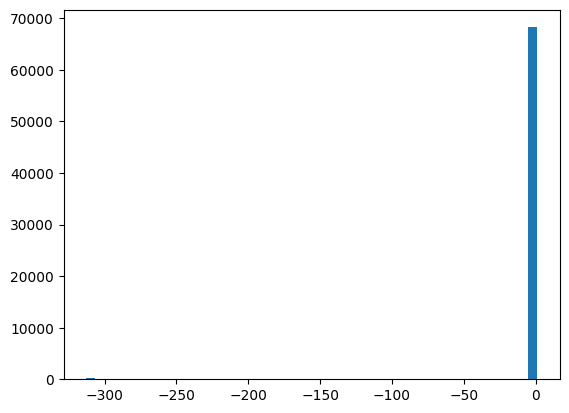

In [ ]:
plt.hist(preds[4],bins=50)

# Tabnet

In [ ]:
!pip install pytorch-tabnet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.5/44.5 kB 1.6 MB/s eta 0:00:00


In [ ]:
from pytorch_tabnet.tab_model import TabNetRegressor
from pytorch_tabnet.pretraining import TabNetPretrainer

import torch

In [ ]:
df = train.copy()
df = df.drop("players",axis=1)

In [ ]:
!export CUDA_LAUNCH_BLOCKING=1

In [ ]:
from sklearn import preprocessing
from sklearn.preprocessing import OneHotEncoder,LabelEncoder
from sklearn.preprocessing import OrdinalEncoder

for fold in tqdm(range(5)):

    train_df = df[df["fold"] != fold]
    test_df = df[df["fold"] == fold]

    drop_cols = ['utility_agent1',"fold",'num_losses_agent1','num_wins_agent1', 'num_draws_agent1',]#+remove_encoded

    X_train = train_df.drop(drop_cols, axis=1)
    y_train = train_df['utility_agent1']
    X_test = test_df.drop(drop_cols, axis=1)
    y_test = test_df['utility_agent1']

    # 数値特徴量とカテゴリカル特徴量を分離
    numeric_features = X_train.select_dtypes(include=['number']).columns
    categorical_features = X_train.select_dtypes(include=['object', 'category']).columns


    # class num
    categorical_dims = {}

    for col in categorical_features:
        categorical_dims[col] = train[col].nunique()

    cat_idxs = [ i for i, f in enumerate(X_train.columns) if f in categorical_features]

    cat_dims = [ categorical_dims[f] for i, f in enumerate(X_train.columns) if f in categorical_features]

    le = OrdinalEncoder()
    X_train[categorical_features] = le.fit_transform(X_train[categorical_features])
    X_test[categorical_features] = le.transform(X_test[categorical_features])

    # 数値特徴量の標準化
    scaler = MinMaxScaler()
    # X_train = np.log1p(X_train)
    # X_test = np.log1p(X_test)
    X_train[X_train.columns] = scaler.fit_transform(X_train)
    X_test[X_test.columns] = scaler.transform(X_test)

    X_train = torch.from_numpy(X_train.values).float().to("cuda" if torch.cuda.is_available() else "cpu")
    X_test = torch.from_numpy(X_test.values).float().to("cuda" if torch.cuda.is_available() else "cpu")
    y_train = torch.tensor(y_train, dtype=torch.float32).to("cuda" if torch.cuda.is_available() else "cpu")
    y_test = torch.tensor(y_test, dtype=torch.float32).to("cuda" if torch.cuda.is_available() else "cpu")

    tabnet_params = dict(n_d=32, n_a=32, n_steps=1, gamma=1.0,
                         n_independent=2, n_shared=2,
                         seed=0, lambda_sparse=2e-2,
                         optimizer_fn=torch.optim.Adam,
                         optimizer_params=dict(lr=2e-2),
                         mask_type="entmax",
                         scheduler_params=dict(mode="min",
                                              patience=5,
                                              min_lr=1e-5,
                                              factor=0.9,),
                         scheduler_fn=torch.optim.lr_scheduler.ReduceLROnPlateau,
                         verbose=2,
                        #  cat_idxs=cat_idxs, # comment out when Unsupervised
                        #  cat_dims=cat_dims, # comment out when Unsupervised
                        #  cat_emb_dim=1 # comment out when Unsupervised
                        )
    max_epochs = 200

    clf = TabNetRegressor(**tabnet_params
                          )

    clf.fit(
        X_train=X_train, y_train=y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        eval_name=['train', 'valid'],
        eval_metric=['rmse'],
        max_epochs=max_epochs , patience=100,
        batch_size=2048, virtual_batch_size=64,
        num_workers=0,
        drop_last=False,
        augmentations=None,
        # from_unsupervised=unsupervised_model
    )

    y_pred = clf.predict(X_test)
    print(np.sqrt(mean_squared_error(y_test, y_pred)))
    break

  0%|          | 0/5 [00:03<?, ?it/s]


RuntimeError: CUDA error: device-side assert triggered
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


In [ ]:
!nvidia-smi

Fri Nov 15 06:47:09 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   77C    P0              34W /  70W |  10661MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
print(set(list(X_train.dtypes)))

{dtype('float64')}


# Deeptable

In [ ]:
!pip install tensorflow==2.15.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 63.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 55.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 74.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 36.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 7.2 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.16.0
    Uninstalling wrapt-1.16.0:
      Successfully uninstalled wrapt-1.16.0
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.1
    Uninstalling ml-dtypes-0.4.1:
      Successfully uninstalled ml-dtypes-0.4.1
  Attempting uninstall: keras
    Found existing installation: keras 3.4.1
    Uninstalling keras-3.4.1:
      Successfully uninstalled keras-3.4.1
  Attempting uninstall: tensorboard
    Found existing installation

In [ ]:
!pip install deeptables==0.2.5

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 kB 4.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 833.1/833.1 kB 22.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.0/82.0 kB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 56.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 159.9/159.9 kB 17.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 227.1/227.1 kB 24.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 273.8/273.8 kB 27.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 73.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 856.7/856.7 kB 49.6 MB/s eta 0:00:00
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107721 sha256=022971b0f7ef0e2abde82875c37b78417867e71b740b8c0dea5e32e49e289b32
  Stored in directory: /root/.cache/pip/wheels/b8/58/ef/2cf4c306898c2338d51540e0922c8e0d

In [ ]:
!pip install --no-index -U --find-links=/content/drive/MyDrive/deeptables-0.2.6 deeptables==0.2.6

Looking in links: /content/drive/MyDrive/deeptables-0.2.6
Processing ./drive/MyDrive/deeptables-0.2.6/deeptables-0.2.6-py3-none-any.whl
  Attempting uninstall: deeptables
    Found existing installation: deeptables 0.2.5
    Uninstalling deeptables-0.2.5:
      Successfully uninstalled deeptables-0.2.5


In [ ]:
import tensorflow as tf, deeptables as dt
from tensorflow.keras import backend as K
from tensorflow.keras.utils import plot_model
from tensorflow.keras.optimizers.legacy import Adam
from deeptables.models import DeepTable, ModelConfig
from deeptables.models import deepnets
import math
import random
import warnings

In [ ]:
column.split("_")[-1]

'ratio'

In [ ]:
drop_cols = []
for column in train.columns:
    if "diff" == column.split("_")[-1]:
         drop_cols.append(column)
    if "ratio" == column.split("_")[-1]:
         drop_cols.append(column)

In [ ]:
train = train.drop(drop_cols,axis=1)

Learning rate schedule: 0.0001 to 0.001 to 0.0001


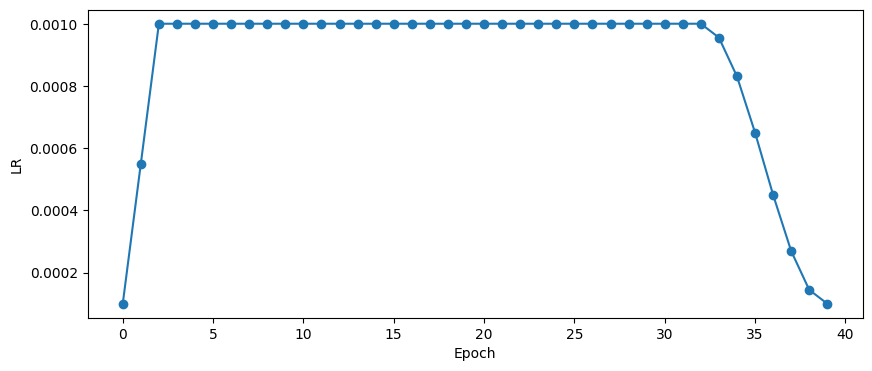

In [ ]:
LR_START = 1e-4
LR_MAX = 1e-3
LR_MIN = 1e-4
LR_RAMPUP_EPOCHS = 2
LR_SUSTAIN_EPOCHS = 30
EPOCHS = 40

def lrfn(epoch):
    if epoch < LR_RAMPUP_EPOCHS:
        lr = (LR_MAX - LR_START) / LR_RAMPUP_EPOCHS * epoch + LR_START
    elif epoch < LR_RAMPUP_EPOCHS + LR_SUSTAIN_EPOCHS:
        lr = LR_MAX
    else:
        decay_total_epochs = EPOCHS - LR_RAMPUP_EPOCHS - LR_SUSTAIN_EPOCHS - 1
        decay_epoch_index = epoch - LR_RAMPUP_EPOCHS - LR_SUSTAIN_EPOCHS
        phase = math.pi * decay_epoch_index / decay_total_epochs
        cosine_decay = 0.5 * (1 + math.cos(phase))
        lr = (LR_MAX - LR_MIN) * cosine_decay + LR_MIN
    return lr

def custom_lr_schedule(epoch):
    return lrfn(epoch)

rng = [i for i in range(EPOCHS)]
lr_y = [lrfn(x) for x in rng]
plt.figure(figsize=(10, 4))
plt.plot(rng, lr_y, '-o')
plt.xlabel('Epoch'); plt.ylabel('LR')
print("Learning rate schedule: {:.3g} to {:.3g} to {:.3g}". \
      format(lr_y[0], max(lr_y), lr_y[-1]))
LR_Scheduler = tf.keras.callbacks.LearningRateScheduler(custom_lr_schedule, verbose=True)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping
class CFG:
    epochs = 40
    batch_size = 256
    LR_Scheduler = [LR_Scheduler]
    optimizer = Adam(learning_rate=1e-3)

    early_stopping = EarlyStopping(
        monitor='val_root_mean_squared_error',  # 正しいメトリック名を指定
        patience=5,  # 改善が見られない場合、5エポック後に停止
        restore_best_weights=True  # 最良の重みに戻す
    )
    conf = ModelConfig(auto_imputation=False,
                        auto_discrete=False,
                        auto_discard_unique=True,
                        categorical_columns='auto',
                        apply_gbm_features=True,
                        fixed_embedding_dim=True,
                        embeddings_output_dim=4,
                        embedding_dropout=0.3,
                        nets=['dnn_nets'] + ['cin_nets'] + ['afm_nets'] ,
                        dnn_params={
                            'hidden_units': ((1024, 0.2, True),
                                            (512, 0.4, True),
                                            (128, 0.4, True),
                                            (8, 0.2, True)),
                            'dnn_activation': 'relu',
                        },
                        cin_params={
                            'cross_layer_size': (128, 128, 64),
                            'cin_activation': 'relu',
                            # 'use_residual': True,
                        },
                        afm_params={
                            'attention_factor': 4,
                            'dropout_rate': 0.3
                        },
                        stacking_op='concat',
                        output_use_bias=False,
                        optimizer=optimizer,
                        task='regression',
                        loss="auto",
                        metrics=['RootMeanSquaredError'],
                        # earlystopping_patience=1,
                        )

In [ ]:

def train_dnn(train,conf):
    test_rmse_scores = []
    pred_list = []
    for fold in tqdm(range(1)):

        train_df = train[train["fold"] != fold]
        test_df = train[train["fold"] == fold]

        X_train = train_df.drop("fold", axis=1)
        y_train = train_df["utility_agent1"]
        X_test = test_df.drop("fold", axis=1)
        y_test = test_df['utility_agent1']

        # scaler = joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/prepro/scaler_fold{fold}.pickle")
        # kmeans = joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/prepro/kmeans_fold{fold}.pickle")
        # target_mean_list = joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/prepro/map_fold{fold}.pickle")

        numeric_features = X_train.select_dtypes(include=['number']).columns
        scaler = MinMaxScaler()
        X_train[numeric_features] = scaler.fit_transform(X_train[numeric_features])
        X_test[numeric_features] = scaler.transform(X_test[numeric_features])

        # X_train["cluster"] = kmeans.predict(X_train[cluster_column])
        # X_test["cluster"] = kmeans.predict(X_test[cluster_column])

        # X_train["cluster"] = X_train["cluster"].astype("category")
        # X_test["cluster"] = X_test["cluster"].astype("category")

        # X_train,target_mean_list = get_target_encoding_cluster_train(X_train)
        # X_train = get_target_encoding_cluster_test(X_train,target_mean_list)
        # X_test = get_target_encoding_cluster_test(X_test,target_mean_list)

        X_train = X_train.drop(['utility_agent1','num_losses_agent1','num_wins_agent1', 'num_draws_agent1'], axis=1)
        X_test = X_test.drop(['utility_agent1','num_losses_agent1','num_wins_agent1', 'num_draws_agent1'], axis=1)

        K.clear_session()
        nn_model = DeepTable(config=CFG.conf)
        nn_model.fit(X_train, y_train,
                  validation_data=(X_test, y_test),
                  callbacks=[CFG.LR_Scheduler],
                  # callbacks=[CFG.early_stopping],
                  batch_size=CFG.batch_size, epochs=CFG.epochs, verbose=2)

        # filename = f'/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/nn_model_fold{fold}.pkl'
        # with open(filename, 'wb') as wb:
        #     pickle.dump(nn_model, wb)

        # nn_model.save(f'/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/nn_model_fold{fold}')
        # os.system(f'cp -r /tmp/workdir/dt_output/* /content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/nnmodel/')

        with K.name_scope(CFG.optimizer.__class__.__name__):
          for j, var in enumerate(CFG.optimizer.weights):
              name = 'variable{}'.format(j)
              CFG.optimizer.weights[j] = tf.Variable(var, name=name)
        CFG.conf = CFG.conf._replace(optimizer=CFG.optimizer)


        y_test_pred = nn_model.predict(X_test, verbose=1, batch_size=512).flatten().clip(-1,1)

        test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))

        test_rmse_scores.append(test_rmse)
        pred_list.append(y_test_pred)

        print(f"Fold {fold+1} Test RMSE: {test_rmse:.3f}")


    # print("\n--- Final Mean Scores ---")
    # print(f"Mean Test RMSE: {np.mean(test_rmse_scores)}")
    # results_df = pd.DataFrame({
    #     'Fold': np.arange(1, 6),
    #     'Test RMSE': test_rmse_scores
    # })

    # print("\n=== KFold RMSE Results ===")

    return pred_list

In [ ]:
pred_list = train_dnn(train,CFG.conf)

  0%|          | 0/1 [00:00<?, ?it/s]

11-15 05:41:02 I deeptables.m.deeptable.py 337 - X.Shape=(193642, 496), y.Shape=(193642,), batch_size=256, config=ModelConfig(name='conf-1', nets=['dnn_nets', 'cin_nets', 'afm_nets'], categorical_columns='auto', exclude_columns=[], task='regression', pos_label=None, metrics=['RootMeanSquaredError'], auto_categorize=False, cat_exponent=0.5, cat_remain_numeric=True, auto_encode_label=True, auto_imputation=False, auto_discrete=False, auto_discard_unique=True, apply_gbm_features=True, gbm_params={}, gbm_feature_type='embedding', fixed_embedding_dim=True, embeddings_output_dim=4, embeddings_initializer='uniform', embeddings_regularizer=None, embeddings_activity_regularizer=None, dense_dropout=0, embedding_dropout=0.3, stacking_op='concat', output_use_bias=False, apply_class_weight=False, optimizer=<keras.src.optimizers.legacy.adam.Adam object at 0x792b94106d40>, loss='auto', dnn_params={'hidden_units': ((1024, 0.2, True), (512, 0.4, True), (128, 0.4, True), (8, 0.2, True)), 'dnn_activation'

11-15 05:41:03 W hypernets.t.cache.py 210 - AttributeError: Can't pickle local object 'make_gradient_clipnorm_fn.<locals>.<lambda>'
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/hypernets/tabular/cache.py", line 165, in _cache_call
    cache_key = tb.data_hasher()(key_items)
  File "/usr/local/lib/python3.10/dist-packages/hypernets/tabular/data_hasher.py", line 20, in __call__
    for x in self._iter_data(data):
  File "/usr/local/lib/python3.10/dist-packages/hypernets/tabular/data_hasher.py", line 58, in _iter_data
    yield from self._iter_data(v)
  File "/usr/local/lib/python3.10/dist-packages/hypernets/tabular/data_hasher.py", line 53, in _iter_data
    yield from self._iter_data(x)
  File "/usr/local/lib/python3.10/dist-packages/hypernets/tabular/data_hasher.py", line 61, in _iter_data
    pickle.dump(data, buf, protocol=pickle.HIGHEST_PROTOCOL)



11-15 05:41:04 I deeptables.m.preprocessor.py 261 - Preparing features...
11-15 05:41:05 I deeptables.m.preprocessor.py 336 - Preparing features taken 0.6790814399719238s
11-15 05:41:05 I deeptables.m.preprocessor.py 388 - Categorical encoding...
11-15 05:41:05 I deeptables.m.preprocessor.py 393 - Categorical encoding taken 0.4462461471557617s
11-15 05:41:05 I deeptables.m.preprocessor.py 423 - Extracting GBM features...
11-15 05:41:06 I hypernets.t.sklearn_ex.py 640 - LightGBM task:regression
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.132130 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 18989
[LightGBM] [Info] Number of data points in the train set: 193642, number of used features: 489
[LightGBM] [Info] Start training from score 0.050299
11-15 05:41:15 I deeptables.m.preprocessor.py 434 - Extracting gbm features taken 9.57648444

756/756 - 81s - loss: 0.2057 - root_mean_squared_error: 0.4536 - val_loss: 38023116.0000 - val_root_mean_squared_error: 6166.2886 - lr: 1.0000e-04 - 81s/epoch - 108ms/step

Epoch 2: LearningRateScheduler setting learning rate to 0.00055.
Epoch 2/40


756/756 - 45s - loss: 0.1126 - root_mean_squared_error: 0.3356 - val_loss: 0.2140 - val_root_mean_squared_error: 0.4626 - lr: 5.5000e-04 - 45s/epoch - 59ms/step

Epoch 3: LearningRateScheduler setting learning rate to 0.001.
Epoch 3/40


756/756 - 45s - loss: 0.0965 - root_mean_squared_error: 0.3106 - val_loss: 0.2092 - val_root_mean_squared_error: 0.4574 - lr: 0.0010 - 45s/epoch - 59ms/step

Epoch 4: LearningRateScheduler setting learning rate to 0.001.
Epoch 4/40


756/756 - 45s - loss: 0.0884 - root_mean_squared_error: 0.2973 - val_loss: 0.2127 - val_root_mean_squared_error: 0.4611 - lr: 0.0010 - 45s/epoch - 59ms/step

Epoch 5: LearningRateScheduler setting learning rate to 0.001.
Epoch 5/40


756/756 - 44s - loss: 0.0835 - root_mean_squared_error: 0.2890 - val_loss: 0.2153 - val_root_mean_squared_error: 0.4640 - lr: 0.0010 - 44s/epoch - 59ms/step

Epoch 6: LearningRateScheduler setting learning rate to 0.001.
Epoch 6/40


756/756 - 44s - loss: 0.0790 - root_mean_squared_error: 0.2811 - val_loss: 0.2086 - val_root_mean_squared_error: 0.4568 - lr: 0.0010 - 44s/epoch - 59ms/step

Epoch 7: LearningRateScheduler setting learning rate to 0.001.
Epoch 7/40


756/756 - 44s - loss: 0.0753 - root_mean_squared_error: 0.2745 - val_loss: 0.2070 - val_root_mean_squared_error: 0.4549 - lr: 0.0010 - 44s/epoch - 59ms/step

Epoch 8: LearningRateScheduler setting learning rate to 0.001.
Epoch 8/40


756/756 - 45s - loss: 0.0723 - root_mean_squared_error: 0.2689 - val_loss: 0.2094 - val_root_mean_squared_error: 0.4576 - lr: 0.0010 - 45s/epoch - 59ms/step

Epoch 9: LearningRateScheduler setting learning rate to 0.001.
Epoch 9/40


756/756 - 44s - loss: 0.0693 - root_mean_squared_error: 0.2633 - val_loss: 0.2078 - val_root_mean_squared_error: 0.4558 - lr: 0.0010 - 44s/epoch - 59ms/step

Epoch 10: LearningRateScheduler setting learning rate to 0.001.
Epoch 10/40


756/756 - 44s - loss: 0.0667 - root_mean_squared_error: 0.2583 - val_loss: 0.2080 - val_root_mean_squared_error: 0.4561 - lr: 0.0010 - 44s/epoch - 59ms/step

Epoch 11: LearningRateScheduler setting learning rate to 0.001.
Epoch 11/40


756/756 - 44s - loss: 0.0648 - root_mean_squared_error: 0.2546 - val_loss: 0.2051 - val_root_mean_squared_error: 0.4528 - lr: 0.0010 - 44s/epoch - 58ms/step

Epoch 12: LearningRateScheduler setting learning rate to 0.001.
Epoch 12/40


756/756 - 44s - loss: 0.0630 - root_mean_squared_error: 0.2510 - val_loss: 276591.6562 - val_root_mean_squared_error: 525.9198 - lr: 0.0010 - 44s/epoch - 59ms/step

Epoch 13: LearningRateScheduler setting learning rate to 0.001.
Epoch 13/40


756/756 - 44s - loss: 0.0613 - root_mean_squared_error: 0.2476 - val_loss: 175331.8594 - val_root_mean_squared_error: 418.7265 - lr: 0.0010 - 44s/epoch - 58ms/step

Epoch 14: LearningRateScheduler setting learning rate to 0.001.
Epoch 14/40


756/756 - 45s - loss: 0.0600 - root_mean_squared_error: 0.2449 - val_loss: 1507861.2500 - val_root_mean_squared_error: 1227.9500 - lr: 0.0010 - 45s/epoch - 59ms/step

Epoch 15: LearningRateScheduler setting learning rate to 0.001.
Epoch 15/40


756/756 - 45s - loss: 0.0586 - root_mean_squared_error: 0.2420 - val_loss: 149982.3594 - val_root_mean_squared_error: 387.2755 - lr: 0.0010 - 45s/epoch - 59ms/step

Epoch 16: LearningRateScheduler setting learning rate to 0.001.
Epoch 16/40


756/756 - 46s - loss: 0.0576 - root_mean_squared_error: 0.2399 - val_loss: 102845.2500 - val_root_mean_squared_error: 320.6949 - lr: 0.0010 - 46s/epoch - 60ms/step

Epoch 17: LearningRateScheduler setting learning rate to 0.001.
Epoch 17/40


756/756 - 45s - loss: 0.0563 - root_mean_squared_error: 0.2373 - val_loss: 4909.6821 - val_root_mean_squared_error: 70.0691 - lr: 0.0010 - 45s/epoch - 60ms/step

Epoch 18: LearningRateScheduler setting learning rate to 0.001.
Epoch 18/40


756/756 - 46s - loss: 0.0553 - root_mean_squared_error: 0.2352 - val_loss: 1486373.1250 - val_root_mean_squared_error: 1219.1689 - lr: 0.0010 - 46s/epoch - 61ms/step

Epoch 19: LearningRateScheduler setting learning rate to 0.001.
Epoch 19/40


756/756 - 45s - loss: 0.0542 - root_mean_squared_error: 0.2329 - val_loss: 954190.0000 - val_root_mean_squared_error: 976.8265 - lr: 0.0010 - 45s/epoch - 60ms/step

Epoch 20: LearningRateScheduler setting learning rate to 0.001.
Epoch 20/40


756/756 - 45s - loss: 0.0535 - root_mean_squared_error: 0.2312 - val_loss: 1363093.1250 - val_root_mean_squared_error: 1167.5157 - lr: 0.0010 - 45s/epoch - 60ms/step

Epoch 21: LearningRateScheduler setting learning rate to 0.001.
Epoch 21/40


756/756 - 45s - loss: 0.0523 - root_mean_squared_error: 0.2287 - val_loss: 4644465.5000 - val_root_mean_squared_error: 2155.1023 - lr: 0.0010 - 45s/epoch - 59ms/step

Epoch 22: LearningRateScheduler setting learning rate to 0.001.
Epoch 22/40


756/756 - 45s - loss: 0.0517 - root_mean_squared_error: 0.2274 - val_loss: 0.2055 - val_root_mean_squared_error: 0.4534 - lr: 0.0010 - 45s/epoch - 59ms/step

Epoch 23: LearningRateScheduler setting learning rate to 0.001.
Epoch 23/40


756/756 - 45s - loss: 0.0510 - root_mean_squared_error: 0.2259 - val_loss: 1362528.2500 - val_root_mean_squared_error: 1167.2738 - lr: 0.0010 - 45s/epoch - 59ms/step

Epoch 24: LearningRateScheduler setting learning rate to 0.001.
Epoch 24/40


756/756 - 45s - loss: 0.0503 - root_mean_squared_error: 0.2242 - val_loss: 0.2054 - val_root_mean_squared_error: 0.4533 - lr: 0.0010 - 45s/epoch - 59ms/step

Epoch 25: LearningRateScheduler setting learning rate to 0.001.
Epoch 25/40


756/756 - 44s - loss: 0.0495 - root_mean_squared_error: 0.2225 - val_loss: 47819.3242 - val_root_mean_squared_error: 218.6763 - lr: 0.0010 - 44s/epoch - 59ms/step

Epoch 26: LearningRateScheduler setting learning rate to 0.001.
Epoch 26/40


756/756 - 44s - loss: 0.0489 - root_mean_squared_error: 0.2211 - val_loss: 1102607.6250 - val_root_mean_squared_error: 1050.0513 - lr: 0.0010 - 44s/epoch - 59ms/step

Epoch 27: LearningRateScheduler setting learning rate to 0.001.
Epoch 27/40


756/756 - 45s - loss: 0.0485 - root_mean_squared_error: 0.2202 - val_loss: 0.2077 - val_root_mean_squared_error: 0.4558 - lr: 0.0010 - 45s/epoch - 59ms/step

Epoch 28: LearningRateScheduler setting learning rate to 0.001.
Epoch 28/40


756/756 - 44s - loss: 0.0475 - root_mean_squared_error: 0.2180 - val_loss: 0.2096 - val_root_mean_squared_error: 0.4578 - lr: 0.0010 - 44s/epoch - 59ms/step

Epoch 29: LearningRateScheduler setting learning rate to 0.001.
Epoch 29/40


756/756 - 45s - loss: 0.0474 - root_mean_squared_error: 0.2178 - val_loss: 0.2087 - val_root_mean_squared_error: 0.4568 - lr: 0.0010 - 45s/epoch - 59ms/step

Epoch 30: LearningRateScheduler setting learning rate to 0.001.
Epoch 30/40


756/756 - 44s - loss: 0.0465 - root_mean_squared_error: 0.2157 - val_loss: 0.2096 - val_root_mean_squared_error: 0.4578 - lr: 0.0010 - 44s/epoch - 59ms/step

Epoch 31: LearningRateScheduler setting learning rate to 0.001.
Epoch 31/40


756/756 - 44s - loss: 0.0461 - root_mean_squared_error: 0.2148 - val_loss: 0.2093 - val_root_mean_squared_error: 0.4575 - lr: 0.0010 - 44s/epoch - 59ms/step

Epoch 32: LearningRateScheduler setting learning rate to 0.001.
Epoch 32/40


756/756 - 45s - loss: 0.0457 - root_mean_squared_error: 0.2137 - val_loss: 0.2078 - val_root_mean_squared_error: 0.4558 - lr: 0.0010 - 45s/epoch - 60ms/step

Epoch 33: LearningRateScheduler setting learning rate to 0.001.
Epoch 33/40


756/756 - 45s - loss: 0.0449 - root_mean_squared_error: 0.2120 - val_loss: 0.2094 - val_root_mean_squared_error: 0.4576 - lr: 0.0010 - 45s/epoch - 59ms/step

Epoch 34: LearningRateScheduler setting learning rate to 0.0009554359905560886.
Epoch 34/40


756/756 - 45s - loss: 0.0443 - root_mean_squared_error: 0.2105 - val_loss: 0.2108 - val_root_mean_squared_error: 0.4591 - lr: 9.5544e-04 - 45s/epoch - 59ms/step

Epoch 35: LearningRateScheduler setting learning rate to 0.0008305704108364302.
Epoch 35/40


756/756 - 44s - loss: 0.0433 - root_mean_squared_error: 0.2081 - val_loss: 0.2083 - val_root_mean_squared_error: 0.4564 - lr: 8.3057e-04 - 44s/epoch - 59ms/step

Epoch 36: LearningRateScheduler setting learning rate to 0.0006501344202803415.
Epoch 36/40


756/756 - 44s - loss: 0.0418 - root_mean_squared_error: 0.2044 - val_loss: 0.2091 - val_root_mean_squared_error: 0.4573 - lr: 6.5013e-04 - 44s/epoch - 59ms/step

Epoch 37: LearningRateScheduler setting learning rate to 0.00044986557971965854.
Epoch 37/40


756/756 - 44s - loss: 0.0406 - root_mean_squared_error: 0.2014 - val_loss: 0.2090 - val_root_mean_squared_error: 0.4571 - lr: 4.4987e-04 - 44s/epoch - 58ms/step

Epoch 38: LearningRateScheduler setting learning rate to 0.00026942958916356994.
Epoch 38/40


756/756 - 44s - loss: 0.0394 - root_mean_squared_error: 0.1984 - val_loss: 0.2102 - val_root_mean_squared_error: 0.4585 - lr: 2.6943e-04 - 44s/epoch - 58ms/step

Epoch 39: LearningRateScheduler setting learning rate to 0.00014456400944391144.
Epoch 39/40


756/756 - 44s - loss: 0.0385 - root_mean_squared_error: 0.1961 - val_loss: 0.2108 - val_root_mean_squared_error: 0.4591 - lr: 1.4456e-04 - 44s/epoch - 59ms/step

Epoch 40: LearningRateScheduler setting learning rate to 0.0001.
Epoch 40/40


756/756 - 44s - loss: 0.0378 - root_mean_squared_error: 0.1945 - val_loss: 0.2102 - val_root_mean_squared_error: 0.4585 - lr: 1.0000e-04 - 44s/epoch - 58ms/step
11-15 06:11:42 I deeptables.m.deepmodel.py 122 - Training finished.
11-15 06:11:42 I deeptables.m.deeptable.py 369 - Training finished.
11-15 06:11:43 I deeptables.m.deeptable.py 704 - Model has been saved to:dt_output/dt_20241115054102_dnn_nets_cin_nets_afm_nets/dnn_nets+cin_nets+afm_nets.h5
11-15 06:11:43 I deeptables.m.deeptable.py 685 - Perform prediction...
11-15 06:11:43 I deeptables.m.preprocessor.py 242 - Transform [X]...
11-15 06:11:44 I deeptables.m.preprocessor.py 249 - transform_X taken 0.7841246128082275s
11-15 06:11:44 I deeptables.m.deepmodel.py 130 - Performing predictions...
11-15 06:11:44 I deeptables.u.dataset_generator.py 250 - create dataset generator with _TFDGForPandas, batch_size=512, shuffle=False, drop_remainder=False
78/78 [==============================] - 4s 28ms/step
11-15 06:11:48 I deeptables.m.d

100%|██████████| 1/1 [30:48<00:00, 1848.60s/it]

Fold 1 Test RMSE: 0.459


In [ ]:
print(np.sqrt(mean_squared_error(a[1],a[0])))
print(np.sqrt(mean_squared_error(a[1],a[0] * 0.9 + pred_list[0]*0.1)))

0.4282470710207174
0.42759319511594834


In [ ]:
for fold in tqdm(range(1)):

    train_df = train[train["fold"] != fold]
    test_df = train[train["fold"] == fold]

    X_train = train_df.drop("fold", axis=1)
    y_train = train_df["utility_agent1"]
    X_test = test_df.drop("fold", axis=1)
    y_test = test_df['utility_agent1']

    scaler = joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/prepro/scaler_fold{fold}.pickle")

    numeric_features = X_train.select_dtypes(include=['number']).columns

    X_train[numeric_features] = scaler.transform(X_train[numeric_features])
    X_test[numeric_features] = scaler.transform(X_test[numeric_features])

    X_train = X_train.drop(['utility_agent1','num_losses_agent1','num_wins_agent1', 'num_draws_agent1'], axis=1)
    X_test = X_test.drop(['utility_agent1','num_losses_agent1','num_wins_agent1', 'num_draws_agent1'], axis=1)
    print(np.sqrt(mean_squared_error(y_test,(all_predss[fold]*0.9 + pred_list[fold]*0.12).clip(-1,1))))

100%|██████████| 1/1 [00:02<00:00,  2.12s/it]

0.4245697488132394


(array([ 114.,  224.,  310.,  265.,  284.,  322.,  326.,  308.,  352.,
         383.,  394.,  456.,  495.,  508.,  579.,  673.,  723.,  784.,
         826.,  942., 1081., 1200., 1451., 1886., 2589., 2937., 2384.,
        1747., 1480., 1236., 1082.,  867.,  860.,  785.,  712.,  671.,
         655.,  607.,  587.,  619.,  668.,  658.,  716.,  718.,  617.,
         546.,  426.,  314.,  160.,   65.]),
 array([-1.        , -0.95999998, -0.92000002, -0.88      , -0.83999997,
        -0.80000001, -0.75999999, -0.72000003, -0.68000001, -0.63999999,
        -0.60000002, -0.56      , -0.51999998, -0.47999999, -0.44      ,
        -0.40000001, -0.36000001, -0.31999999, -0.28      , -0.23999999,
        -0.2       , -0.16      , -0.12      , -0.08      , -0.04      ,
         0.        ,  0.04      ,  0.08      ,  0.12      ,  0.16      ,
         0.2       ,  0.23999999,  0.28      ,  0.31999999,  0.36000001,
         0.40000001,  0.44      ,  0.47999999,  0.51999998,  0.56      ,
         0.60000

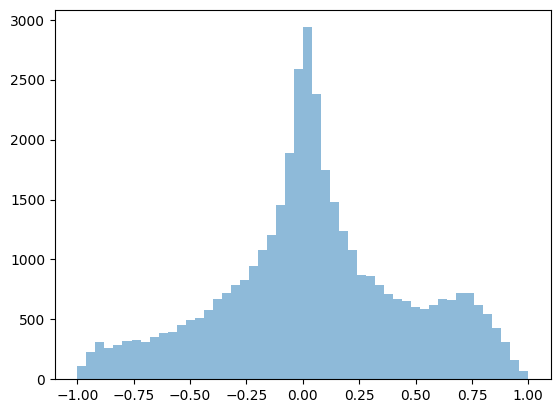

In [ ]:
plt.hist(pred_list[0], bins=50, alpha=0.5,)

# スタッキング

## first

In [ ]:
import joblib

In [ ]:
def create_2stgpred(data,modellist_1st,modellist_2nd,fold):
    model1 = modellist_1st[fold]
    model2 = modellist_2nd[fold]
    pred_df = pd.DataFrame(data)
    pred_df["original_index"] = data.index

    y_test_pred = model1.predict(data)

    pred_df["pred"] = y_test_pred
    pred_df["pred_prob"] = np.max(model1.predict_proba(data), axis=1)
    pred_df_1st = pred_df[(pred_df['pred'].isin([0, 1])) & (pred_df['pred_prob'] >= 0.8)]
    pred_df_2st = pred_df[~((pred_df['pred'].isin([0, 1])) & (pred_df['pred_prob'] >= 0.8))]
    X_test_2nd = pred_df_2st.drop(["pred","pred_prob","original_index"], axis=1)

    y_test_pred = model2.predict(X_test_2nd)
    pred_df_2st["pred"] = y_test_pred
    pred_df_1st["pred"] = pred_df_1st["pred"].apply(lambda x: -1 if x == 0 else 1)

    pred_df = pd.concat([pred_df_1st, pred_df_2st])

    df_combine = pred_df.sort_values("original_index")
    return df_combine["pred"].clip(-1,1)

In [ ]:
def create_3tarpred(data,modellist_win,modellist_loss,modellist_draw,fold):
    model_win = modellist_win[fold]
    model_loss = modellist_loss[fold]
    model_draw = modellist_draw[fold]
    pred_win = model_win.predict(data)
    pred_loss = model_loss.predict(data)
    pred_draw = model_draw.predict(data)
    pred = (pred_win-pred_loss)/(pred_win+pred_loss+pred_draw)
    return pred.clip(-1,1)

In [ ]:
models_simple_cat_0 = [joblib.load(f'/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_normal_seed0_fold{i}.pickle') for i in range(5)]
models_simple_cat_1 = [joblib.load(f'/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_normal_seed1_fold{i}.pickle') for i in range(5)]
models_simple_cat_2 = [joblib.load(f'/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_normal_seed2_fold{i}.pickle') for i in range(5)]

models_simple_lgb_0 = [joblib.load(f'/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/lgb_model_seed0_fold{i}.pickle') for i in range(5)]
models_simple_lgb_1 = [joblib.load(f'/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/lgb_model_seed1_fold{i}.pickle') for i in range(5)]
models_simple_lgb_2 = [joblib.load(f'/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/lgb_model_seed2_fold{i}.pickle') for i in range(5)]

models_unbalance_cat_1st_0 = [joblib.load(f'/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_unbalance_1st_seed0_fold{i}.pickle') for i in range(5)]
models_unbalance_cat_2nd_0 = [joblib.load(f'/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_unbalance_2nd_seed0_fold{i}.pickle') for i in range(5)]
models_unbalance_cat_1st_1 = [joblib.load(f'/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_unbalance_1st_seed1_fold{i}.pickle') for i in range(5)]
models_unbalance_cat_2nd_1 = [joblib.load(f'/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_unbalance_2nd_seed1_fold{i}.pickle') for i in range(5)]
models_unbalance_cat_1st_2 = [joblib.load(f'/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_unbalance_1st_seed2_fold{i}.pickle') for i in range(5)]
models_unbalance_cat_2nd_2 = [joblib.load(f'/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_unbalance_2nd_seed2_fold{i}.pickle') for i in range(5)]

models_target_win_0 = [joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_target_win_seed0_fold{i}.pickle") for i in range(5)]
models_target_loss_0 = [joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_target_loss_seed0_fold{i}.pickle") for i in range(5)]
models_target_draw_0 = [joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_target_draw_seed0_fold{i}.pickle") for i in range(5)]
models_target_win_1 = [joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_target_win_seed1_fold{i}.pickle") for i in range(5)]
models_target_loss_1 = [joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_target_loss_seed1_fold{i}.pickle") for i in range(5)]
models_target_draw_1 = [joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_target_draw_seed1_fold{i}.pickle") for i in range(5)]
models_target_win_2 = [joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_target_win_seed2_fold{i}.pickle") for i in range(5)]
models_target_loss_2 = [joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_target_loss_seed2_fold{i}.pickle") for i in range(5)]
models_target_draw_2 = [joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_target_draw_seed2_fold{i}.pickle") for i in range(5)]

# models_lgb = [joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline19/1015_model_fold{i}.pickle") for i in range(5)]

In [ ]:
mapping_rules = [
    (-1.0, -0.93, -1.0),
    (-0.93, -0.87, -0.93),
    (-0.87, -0.73, -0.87),
    (-0.73, -0.6, -0.73),
    (-0.6, -0.47, -0.6),
    (-0.47, -0.33, -0.47),
    (-0.33, -0.2, -0.33),
    (-0.2, -0.13, -0.2),
    (-0.13, -0.06, -0.13),
    (-0.06, 0.0, 0.0),
    (0.0, 0.06, 0.0),
    (0.06, 0.13, 0.13),
    (0.13, 0.2, 0.2),
    (0.2, 0.33, 0.33),
    (0.33, 0.47, 0.47),
    (0.47, 0.6, 0.6),
    (0.6, 0.73, 0.73),
    (0.73, 0.87, 0.87),
    (0.87, 0.93, 0.93),
    (0.93, 1.0, 1.0)
]

# マッピング関数を定義
def map_value(value, rules):
    for lower, upper, mapped_value in rules:
        if lower <= value < upper:
            return mapped_value
    return value  # どの範囲にも該当しない場合は元の値を返す

In [ ]:
np.array([map_value(v,mapping_rules) for v in pred_lgb])*0.2

array([0.066, 0.094, 0.066, ..., 0.186, 0.066, 0.12 ])

In [ ]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import KFold
from lightgbm import LGBMRegressor
all_preds = []
all_predss = []
alpha = 1.1
for fold in tqdm(range(5)):

    train_df = train[train["fold"] != fold]
    test_df = train[train["fold"] == fold]

    X_test = test_df.drop("fold", axis=1)
    y_test = test_df['utility_agent1']
    X_test = X_test.drop(['utility_agent1','num_losses_agent1','num_wins_agent1', 'num_draws_agent1'], axis=1)

    # lgb simple
    pred = models_simple_lgb_0[fold].predict(X_test)
    pred2 = models_simple_lgb_1[fold].predict(X_test)
    pred3 = models_simple_lgb_2[fold].predict(X_test)

    pred_lgb = (pred*0.4+pred2*0.3+pred3*0.3)*1.1
    pred_lgb = np.array([map_value(v,mapping_rules) for v in pred_lgb])

    # catboost simple
    pred = models_simple_cat_0[fold].predict(X_test)
    pred2 = models_simple_cat_1[fold].predict(X_test)
    pred3 = models_simple_cat_2[fold].predict(X_test)

    pred_cat = (pred*0.35+pred2*0.35+pred3*0.3)*1.1
    pred_cat = np.array([map_value(v,mapping_rules) for v in pred_cat])

    # catboost unbalance

    pred_unbalance_0 = create_2stgpred(X_test,models_unbalance_cat_1st_0,models_unbalance_cat_2nd_0,fold)
    pred_unbalance_1 = create_2stgpred(X_test,models_unbalance_cat_1st_1,models_unbalance_cat_2nd_1,fold)
    pred_unbalance_2 = create_2stgpred(X_test,models_unbalance_cat_1st_2,models_unbalance_cat_2nd_2,fold)

    pred_unbalance = (pred_unbalance_0*0.4 + pred_unbalance_1*0.3 + pred_unbalance_2*0.3)*1.1
    pred_unbalance = np.array([map_value(v,mapping_rules) for v in pred_unbalance])

    # catboost 3target
    pred_target_0 = create_3tarpred(X_test,models_target_win_0,models_target_loss_0,models_target_draw_0,fold)
    pred_target_1 = create_3tarpred(X_test,models_target_win_1,models_target_loss_1,models_target_draw_1,fold)
    pred_target_2 = create_3tarpred(X_test,models_target_win_2,models_target_loss_2,models_target_draw_2,fold)
    pred_target = (pred_target_0*0.2 + pred_target_1*0.4 + pred_target_2*0.4)*1.1
    pred_target = np.array([map_value(v,mapping_rules) for v in pred_target])

    predss = pred_unbalance*0.2 + pred_cat*0.2 + pred_target*0.5 + pred_lgb*0.1
    all_predss.append(predss)

    test_rmse = np.sqrt(mean_squared_error(y_test, predss.clip(-1,1)))
    print(test_rmse)

    # pred_df = pd.DataFrame({
    #     'pred_cat': pred_cat,
    #     'pred_lgb': pred_lgb,
    #     'pred_unbalance': pred_unbalance,
    #     'pred_3target': pred_target,
    #     "pred_nn" : pred_list[fold],
    #     'target': y_test
    # })
    # features = ['pred_cat', 'pred_lgb', 'pred_unbalance',"pred_3target","pred_nn"]
    # target = 'target'

    # pred_df["fold"] = fold
    # all_preds.append(pred_df)


 20%|██        | 1/5 [00:20<01:21, 20.31s/it]

0.4331411319339094


 40%|████      | 2/5 [00:40<01:00, 20.17s/it]

0.4046301127583263


 60%|██████    | 3/5 [00:58<00:38, 19.19s/it]

0.42114246395777605


 80%|████████  | 4/5 [01:17<00:19, 19.29s/it]

0.3987371679728563


100%|██████████| 5/5 [01:44<00:00, 20.87s/it]

0.5549585609970727


In [ ]:
from sklearn.linear_model import Ridge,Lasso
from sklearn.model_selection import KFold
from sklearn.ensemble import RandomForestRegressor
from lightgbm import LGBMRegressor
from sklearn.svm import SVR

stacking_df = pd.concat(all_preds)

# 2. メタモデルのトレーニングと予測
features = ['pred_cat', 'pred_lgb', 'pred_unbalance',"pred_3target","pred_nn"]
target = 'target'

meta_model_preds = np.zeros(len(stacking_df))

params_lgb = {'boosting_type': 'gbdt','learning_rate': 0.05, 'objective': 'regression','metric': 'rmse',"seed":77}

for fold in range(5):
    train_df_stack = stacking_df[stacking_df["fold"] != fold]
    test_df_stack = stacking_df[stacking_df["fold"] == fold]

    X_train = train_df_stack[features]
    y_train = train_df_stack[target]
    X_val = test_df_stack[features]
    y_val = test_df_stack[target]

    dtrain = lgb.Dataset(X_train, y_train)
    dvalid = lgb.Dataset(X_val, y_val)

    # Ridge回帰を使用 (任意で他のモデルに変更可能)
    meta_model = Ridge(alpha=0.1)
    meta_model.fit(X_train, y_train)
    pred = meta_model.predict(X_val)

    # meta_model = LGBMRegressor(n_estimators=100, learning_rate=0.1, max_depth=3,verbose=0)
    # meta_model.fit(X_train, y_train, eval_set=[(X_val, y_val)], eval_metric='rmse')
    # pred = meta_model.predict(X_val)

    # meta_model = SVR(kernel='linear', C=1.0, epsilon=0.1)
    # meta_model.fit(X_train, y_train)
    # pred = meta_model.predict(X_val)

    # model = lgb.train(params_lgb,dtrain,valid_sets=[dtrain, dvalid],num_boost_round=1000,callbacks=[lgb.early_stopping(50)])
    # pred = model.predict(X_val).clip(-1,1)
    rmse = np.sqrt(mean_squared_error(y_val, pred.clip(-1,1)))
    print(f"RMSE: {rmse}")

# 3. 評価
# final_rmse = np.sqrt(mean_squared_error(stacking_df[target], meta_model_preds))
# print(f"Final Stacking RMSE: {final_rmse}")

RMSE: 0.42817694386795635
RMSE: 0.40675805537279563
RMSE: 0.41431913373267965
RMSE: 0.3979786314615025
RMSE: 0.5540875978250963


## second

In [ ]:
import joblib

models_simple_cat_0 = [joblib.load(f'/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline25/cat_model_normal_seed0_fold{i}.pickle') for i in range(5)]
models_simple_cat_1 = [joblib.load(f'/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline25/cat_model_normal_seed1_fold{i}.pickle') for i in range(5)]
models_simple_cat_2 = [joblib.load(f'/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline25/cat_model_normal_seed2_fold{i}.pickle') for i in range(5)]

models_simple_cat_0_s = [joblib.load(f'/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_normal_seed0_fold{i}.pickle') for i in range(5)]
models_simple_cat_1_s = [joblib.load(f'/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_normal_seed1_fold{i}.pickle') for i in range(5)]
models_simple_cat_2_s = [joblib.load(f'/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_normal_seed2_fold{i}.pickle') for i in range(5)]

# models_simple_lgb_0 = [joblib.load(f'/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/lgb_model_seed0_fold{i}.pickle') for i in range(5)]
# models_simple_lgb_1 = [joblib.load(f'/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/lgb_model_seed1_fold{i}.pickle') for i in range(5)]
# models_simple_lgb_2 = [joblib.load(f'/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/lgb_model_seed2_fold{i}.pickle') for i in range(5)]

# models_unbalance_cat_1st_0 = [joblib.load(f'/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_unbalance_1st_seed0_fold{i}.pickle') for i in range(5)]
# models_unbalance_cat_2nd_0 = [joblib.load(f'/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_unbalance_2nd_seed0_fold{i}.pickle') for i in range(5)]
# models_unbalance_cat_1st_1 = [joblib.load(f'/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_unbalance_1st_seed1_fold{i}.pickle') for i in range(5)]
# models_unbalance_cat_2nd_1 = [joblib.load(f'/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_unbalance_2nd_seed1_fold{i}.pickle') for i in range(5)]
# models_unbalance_cat_1st_2 = [joblib.load(f'/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_unbalance_1st_seed2_fold{i}.pickle') for i in range(5)]
# models_unbalance_cat_2nd_2 = [joblib.load(f'/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_unbalance_2nd_seed2_fold{i}.pickle') for i in range(5)]

# models_target_win_0 = [joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_target_win_seed0_fold{i}.pickle") for i in range(5)]
# models_target_loss_0 = [joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_target_loss_seed0_fold{i}.pickle") for i in range(5)]
# models_target_draw_0 = [joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_target_draw_seed0_fold{i}.pickle") for i in range(5)]
# models_target_win_1 = [joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_target_win_seed1_fold{i}.pickle") for i in range(5)]
# models_target_loss_1 = [joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_target_loss_seed1_fold{i}.pickle") for i in range(5)]
# models_target_draw_1 = [joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_target_draw_seed1_fold{i}.pickle") for i in range(5)]
# models_target_win_2 = [joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_target_win_seed2_fold{i}.pickle") for i in range(5)]
# models_target_loss_2 = [joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_target_loss_seed2_fold{i}.pickle") for i in range(5)]
# models_target_draw_2 = [joblib.load(f"/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/baseline24/cat_model_target_draw_seed2_fold{i}.pickle") for i in range(5)]

In [ ]:
k = ['EnglishRules_ARI',
 'EnglishRules_McAlpine_EFLAW',
 'EnglishRules_CLRI',
 'LudRules_ARI',
 'LudRules_McAlpine_EFLAW',
 'LudRules_CLRI']

['EnglishRules_ARI',
 'EnglishRules_McAlpine_EFLAW',
 'EnglishRules_CLRI',
 'LudRules_ARI',
 'LudRules_McAlpine_EFLAW',
 'LudRules_CLRI']

In [ ]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import KFold
from lightgbm import LGBMRegressor
all_preds = []
all_predss = []
alpha = 1.1
for fold in tqdm(range(5)):

    train_df = df[df["fold"] != fold]
    test_df = df[df["fold"] == fold]

    X_test = test_df.drop("fold", axis=1)
    y_test = test_df['utility_agent1']
    X_test = X_test.drop(['utility_agent1','num_losses_agent1','num_wins_agent1', 'num_draws_agent1'], axis=1)

    # # lgb simple
    # pred = models_simple_lgb_0[fold].predict(X_test)
    # pred2 = models_simple_lgb_1[fold].predict(X_test)
    # pred3 = models_simple_lgb_2[fold].predict(X_test)

    # pred_lgb = (pred*0.4+pred2*0.3+pred3*0.3)*1.1
    # pred_lgb = np.array([map_value(v,mapping_rules) for v in pred_lgb])

    # catboost simple
    pred = models_simple_cat_0[fold].predict(X_test)
    pred2 = models_simple_cat_1[fold].predict(X_test)
    pred3 = models_simple_cat_2[fold].predict(X_test)

    pred_cat_ff = (pred*0.4+pred2*0.3+pred3*0.3)

    train_df = train[train["fold"] != fold]
    test_df = train[train["fold"] == fold]

    X_test = test_df.drop("fold", axis=1)
    y_test = test_df['utility_agent1']
    X_test = X_test.drop(['utility_agent1','num_losses_agent1','num_wins_agent1', 'num_draws_agent1'], axis=1)


    X_test_w = X_test.drop(k,axis=1)
    pred = models_simple_cat_0_s[fold].predict(X_test_w)
    pred2 = models_simple_cat_1_s[fold].predict(X_test_w)
    pred3 = models_simple_cat_2_s[fold].predict(X_test_w)

    pred_cat = (pred*0.35+pred2*0.35+pred3*0.3)


    # # catboost unbalance

    # pred_unbalance_0 = create_2stgpred(X_test,models_unbalance_cat_1st_0,models_unbalance_cat_2nd_0,fold)
    # pred_unbalance_1 = create_2stgpred(X_test,models_unbalance_cat_1st_1,models_unbalance_cat_2nd_1,fold)
    # pred_unbalance_2 = create_2stgpred(X_test,models_unbalance_cat_1st_2,models_unbalance_cat_2nd_2,fold)

    # pred_unbalance = (pred_unbalance_0*0.4 + pred_unbalance_1*0.3 + pred_unbalance_2*0.3)*1.1
    # pred_unbalance = np.array([map_value(v,mapping_rules) for v in pred_unbalance])

    # # catboost 3target
    # pred_target_0 = create_3tarpred(X_test,models_target_win_0,models_target_loss_0,models_target_draw_0,fold)
    # pred_target_1 = create_3tarpred(X_test,models_target_win_1,models_target_loss_1,models_target_draw_1,fold)
    # pred_target_2 = create_3tarpred(X_test,models_target_win_2,models_target_loss_2,models_target_draw_2,fold)
    # pred_target = (pred_target_0*0.2 + pred_target_1*0.4 + pred_target_2*0.4)*1.1
    # pred_target = np.array([map_value(v,mapping_rules) for v in pred_target])

    # predss = pred_unbalance*0.2 + pred_cat*0.2 + pred_target*0.5 + pred_lgb*0.1
    # all_predss.append(predss)

    test_rmse = np.sqrt(mean_squared_error(y_test, pred_cat_ff*0.5 + pred_cat*0.5))
    print(test_rmse)

 20%|██        | 1/5 [00:04<00:17,  4.32s/it]

0.4281464589504538


 40%|████      | 2/5 [00:08<00:13,  4.39s/it]

0.4080385935871703


 60%|██████    | 3/5 [00:13<00:08,  4.34s/it]

0.41782169274421865


 80%|████████  | 4/5 [00:18<00:04,  4.74s/it]

0.39801277966132814


100%|██████████| 5/5 [00:24<00:00,  4.94s/it]

0.5703909544458131


# 実験 : utility_agent1の分布からみる最適なクラスター数の考察

In [ ]:
train = pl.read_csv("/content/drive/MyDrive/um-game-playing-strength-of-mcts-variants/train.csv")
train = get_fold(train,random_state = 7)
# g = train["GameRulesetName"]
train = remove_useless(train,nomean_cols,freq_cols,duplicate_cols)
rain = train.to_pandas()

In [ ]:
df = rain.select_dtypes(include=['number'])
# df["g"] = g
# df2 = df.groupby("g").mean()
# df2 = df2.reset_index()
df2 = df.drop(['utility_agent1','num_losses_agent1','num_wins_agent1', 'num_draws_agent1'], axis=1)

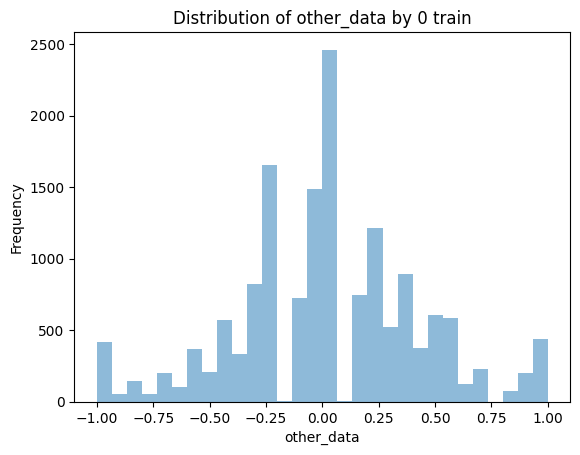

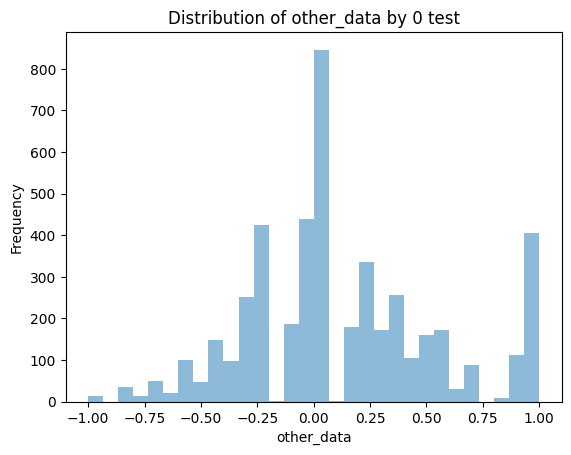

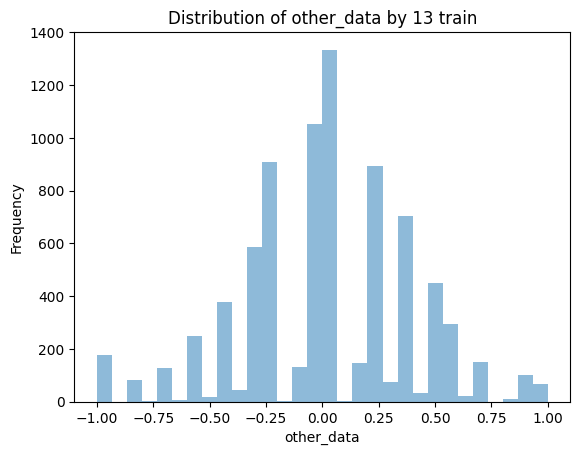

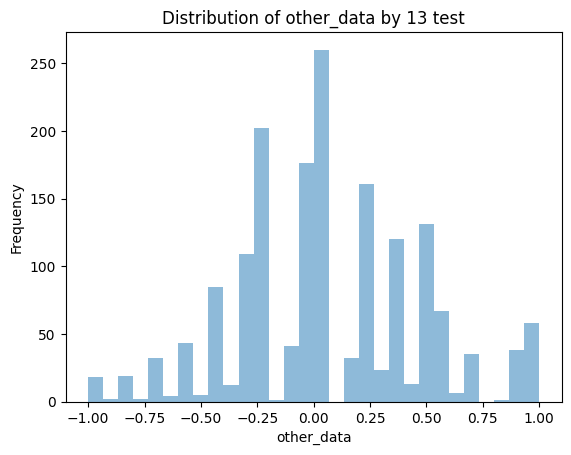

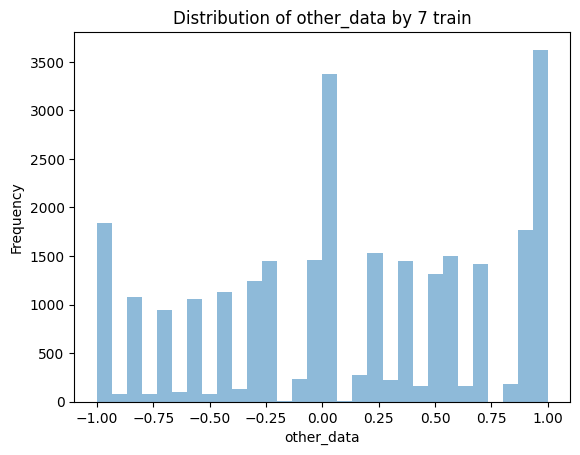

...

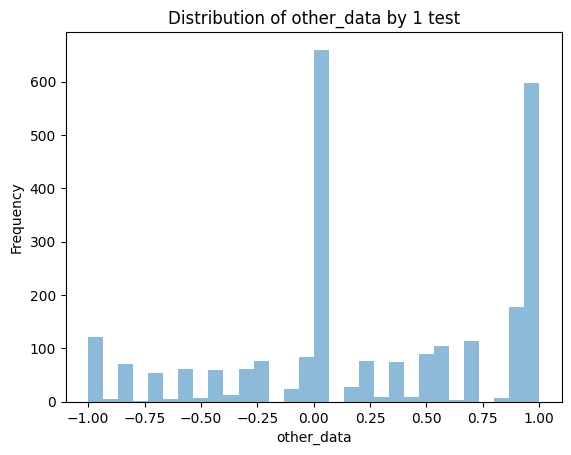

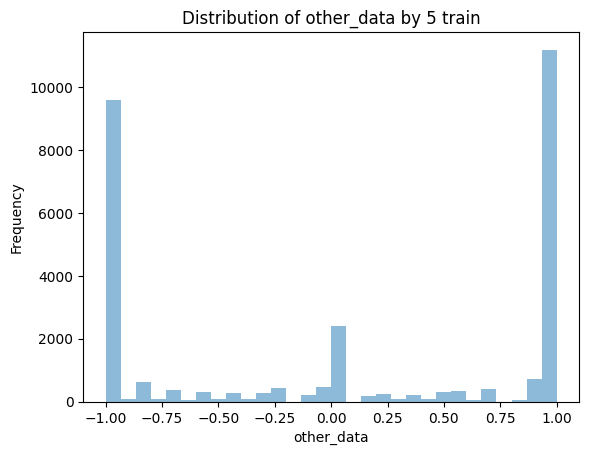

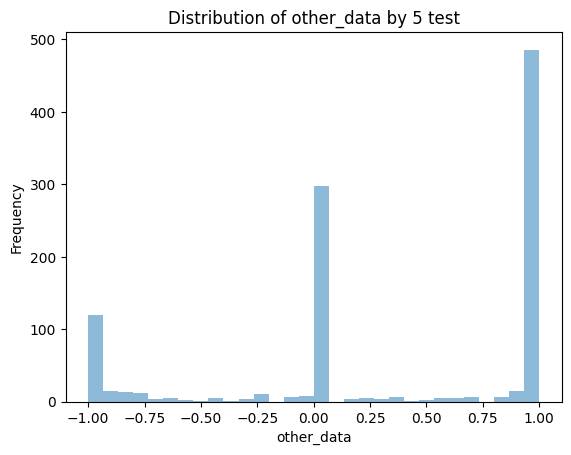

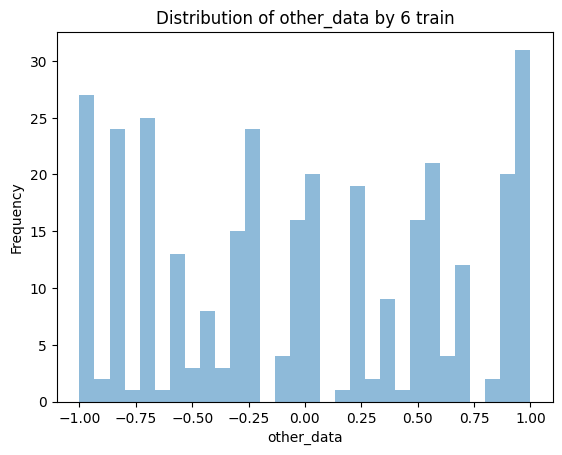

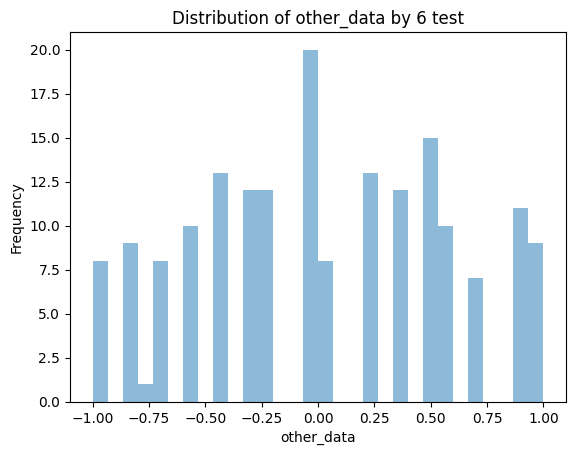

In [ ]:
from catboost import CatBoostRegressor, Pool,CatBoostClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from scipy.stats import entropy
from scipy.spatial.distance import jensenshannon
from scipy.stats import wasserstein_distance

cluster_list = []
for i in range(1):
    # 連続値の列を標準化
    X_train = df2[df2["fold"] != 1]
    y_test = df2[df2["fold"] == 1]
    X_train_dr = X_train.drop(["fold"],axis=1)
    y_test_dr = y_test.drop(["fold"],axis=1)
    scaler = StandardScaler()
    df_scaled = scaler.fit_transform(X_train_dr)

    kmeans = KMeans(n_clusters=15, random_state=42)
    labels = kmeans.fit_predict(df_scaled)
    X_train["label"] = labels

    y_test_scale = scaler.transform(y_test_dr)
    y_test["label"] = kmeans.predict(y_test_scale)

    df_train = df[df["fold"] != 1]
    df_test = df[df["fold"] == 1]

    df_train["label"] = X_train["label"]
    df_test["label"] = y_test["label"]

    df3 = df_train
    df4 = df_test

    # df3 = pd.merge(df_train[["g","utility_agent1"]],X_train[["g","label"]],on="g")
    # df4 = pd.merge(df_test[["g","utility_agent1"]],y_test[["g","label"]],on="g")
    labels = df3['label'].unique()

    label_list= []
    for label in labels:
        if label not in df4["label"].unique():
            continue
        subset0 = df3[df3['label'] == label]
        plt.hist(subset0['utility_agent1'], bins=30, alpha=0.5,)

        # グラフのタイトルとラベルを追加
        plt.title(f'Distribution of other_data by {label} train')
        plt.xlabel('other_data')
        plt.ylabel('Frequency')

        # グラフを表示
        plt.show()

        subset1 = df4[df4['label'] == label]
        plt.hist(subset1['utility_agent1'], bins=30, alpha=0.5,)

        # グラフのタイトルとラベルを追加
        plt.title(f'Distribution of other_data by {label} test')
        plt.xlabel('other_data')
        plt.ylabel('Frequency')

        # グラフを表示
        plt.show()

        hist_0, bins_0 = np.histogram(subset0["utility_agent1"], bins=30, density=True)
        hist_1, bins_1 = np.histogram(subset1["utility_agent1"], bins=30, density=True)

        # ゼロ以外の部分に限定して比較
        non_zero_idx_0 = hist_0 > 1e-10
        non_zero_idx_1 = hist_1 > 1e-10
        common_non_zero_idx = non_zero_idx_0 & non_zero_idx_1

        # ゼロでない部分だけに絞ってJSダイバージェンスを計算
        js_div_non_zero = jensenshannon(hist_0[common_non_zero_idx], hist_1[common_non_zero_idx])
        label_list.append((len(subset1),js_div_non_zero))

    # 分子と分母の合計を計算
    numerator = sum(quantity * value for quantity, value in label_list)  # Σ(数量 × 値)
    denominator = sum(quantity for quantity, value in label_list)        # Σ(数量)

    # 加重平均の計算
    weighted_average = numerator / denominator
    cluster_list.append(weighted_average)

In [ ]:
subset1

,Stochastic,Asymmetric,PlayersWithDirections,Cooperation,Shape,SquareShape,HexShape,TriangleShape,DiamondShape,RectangleShape,...,DoLudeme,Trigger,PlayoutsPerSecond,MovesPerSecond,num_wins_agent1,num_draws_agent1,num_losses_agent1,utility_agent1,fold,label
21338,0,0,0,0,1,0,1,0,0,0,...,1,0,4.33,279.81,9,0,6,0.200000,0,6
21339,0,0,0,0,1,0,1,0,0,0,...,1,0,4.33,279.81,7,0,8,-0.066667,0,6
21340,0,0,0,0,1,0,1,0,0,0,...,1,0,4.33,279.81,8,0,7,0.066667,0,6
21341,0,0,0,0,1,0,1,0,0,0,...,1,0,4.33,279.81,3,0,12,-0.600000,0,6
21342,0,0,0,0,1,0,1,0,0,0,...,1,0,4.33,279.81,5,0,10,-0.333333,0,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21521,0,0,0,0,1,0,1,0,0,0,...,1,0,4.33,279.81,7,0,8,-0.066667,0,6
21522,0,0,0,0,1,0,1,0,0,0,...,1,0,4.33,279.81,9,0,6,0.200000,0,6
21523,0,0,0,0,1,0,1,0,0,0,...,1,0,4.33,279.81,5,0,10,-0.333333,0,6
21524,0,0,0,0,1,0,1,0,0,0,...,1,0,4.33,279.81,5,0,10,-0.333333,0,6


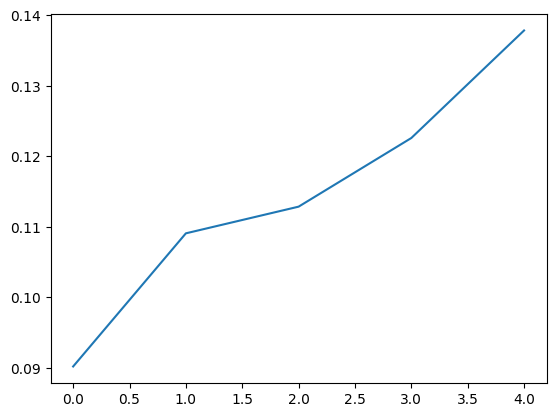

In [ ]:
plt.plot(cluster_list)

In [ ]:
df3 = pd.merge(df[["g","utility_agent1"]],df2[["g","label"]],on="g")

In [ ]:
df3[df3["label"]==9]["g"].unique()

array(['Co_Chan_Cho', 'Gurvan_Xudag', 'Ho-Bag_Gonu',
       'Hund_efter_Hare_ThyHare_wins_Suggested',
       'Hund_efter_Hare_ThyHund_efter_Hare_Thy_Observed',
       'Hund_efter_Hare_VendsysselHare_Wins_Suggested',
       'Hund_efter_Hare_VendsysselHund_efter_Hare_Vendsyssel_Observed',
       'Ludus_CoriovalliHaretavl_Four_Dogs_Two_Hares_Starting_Position_1_-_Both_Extensions_Joined_Diagonal_Suggested',
       'Ludus_CoriovalliHaretavl_Four_Dogs_Two_Hares_Starting_Position_1_-_Both_Extensions_No_Joined_Diagonal_Suggested',
       'Ludus_CoriovalliHaretavl_Four_Dogs_Two_Hares_Starting_Position_1_-_No_Extension_Joined_Diagonal_Suggested',
       'Ludus_CoriovalliHaretavl_Four_Dogs_Two_Hares_Starting_Position_1_-_No_Extension_No_Joined_Diagonal_Suggested',
       'Ludus_CoriovalliHaretavl_Four_Dogs_Two_Hares_Starting_Position_1_-_Top_Extension_Joined_Diagonal_Suggested',
       'Ludus_CoriovalliHaretavl_Four_Dogs_Two_Hares_Starting_Position_1_-_Top_Extension_No_Joined_Diagonal_Suggested',

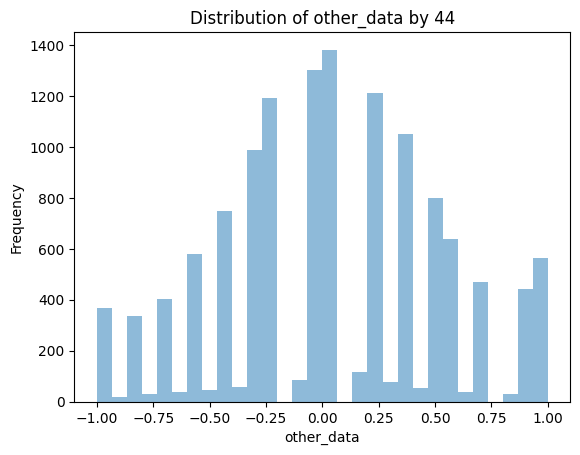

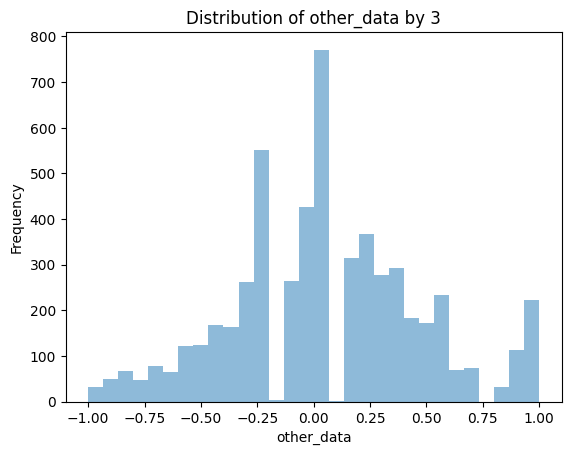

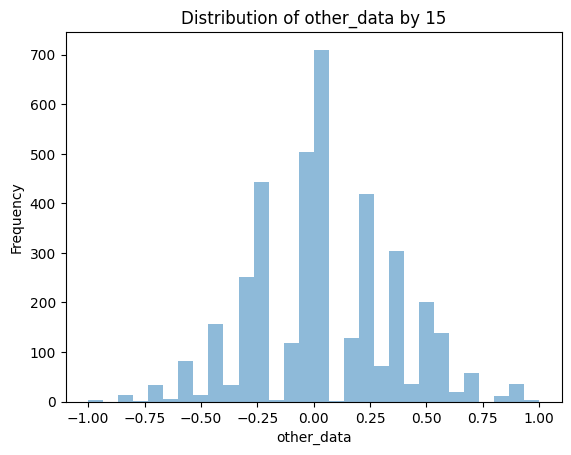

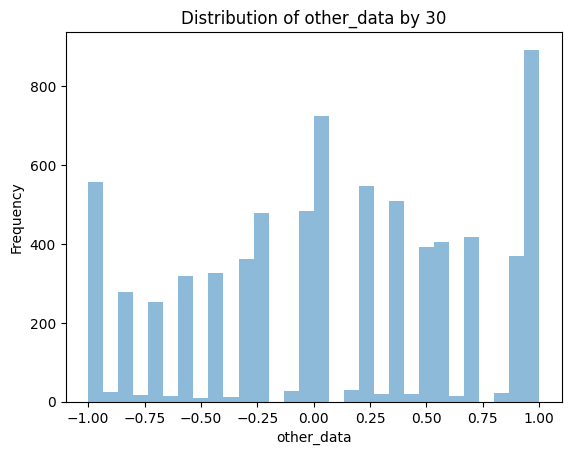

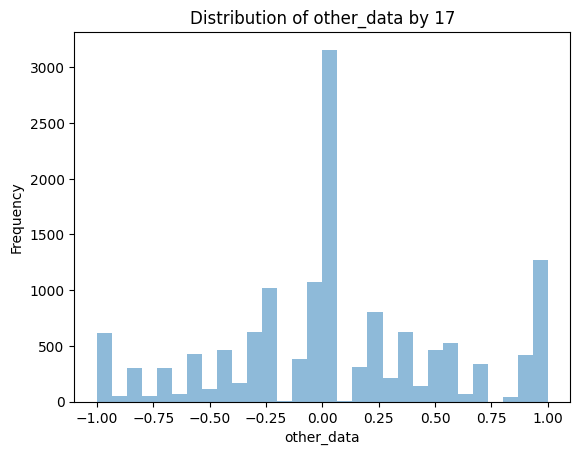

...

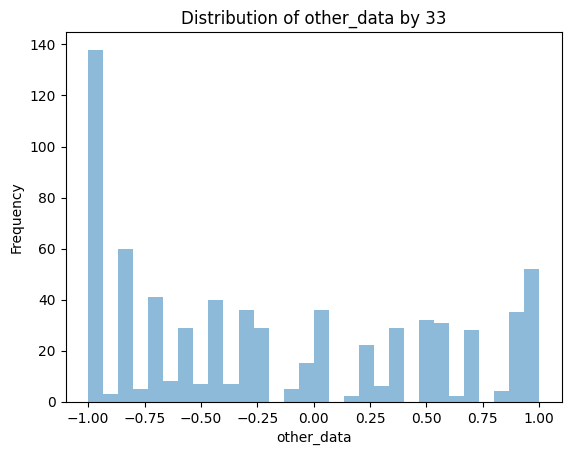

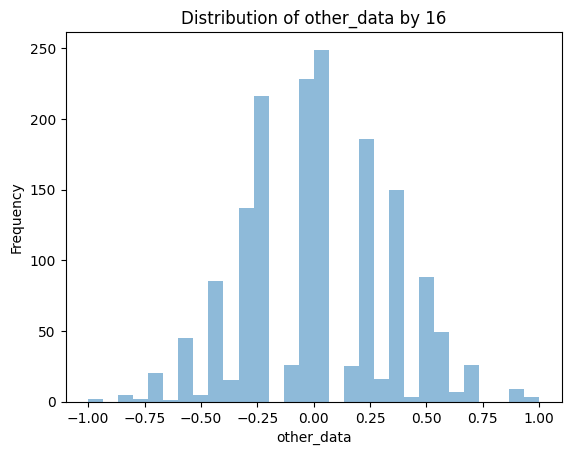

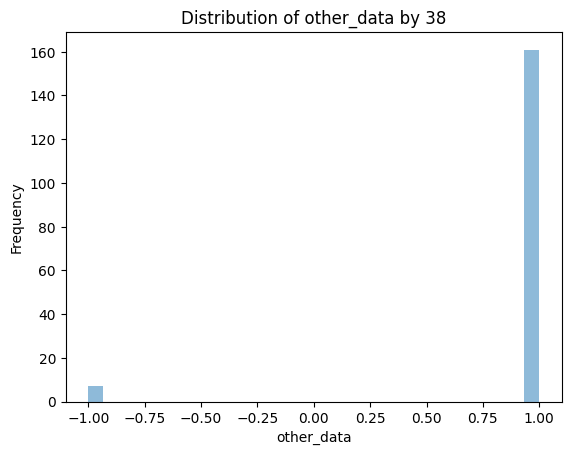

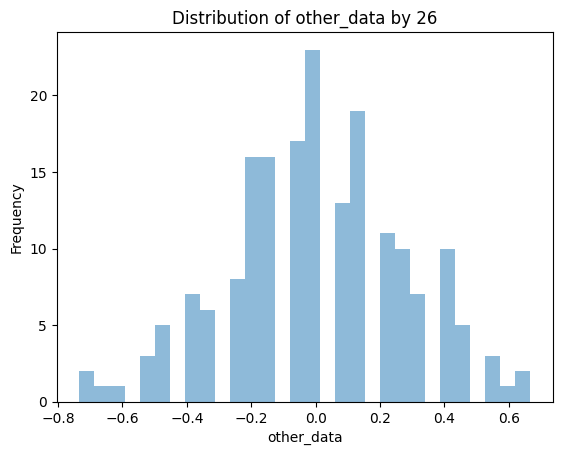

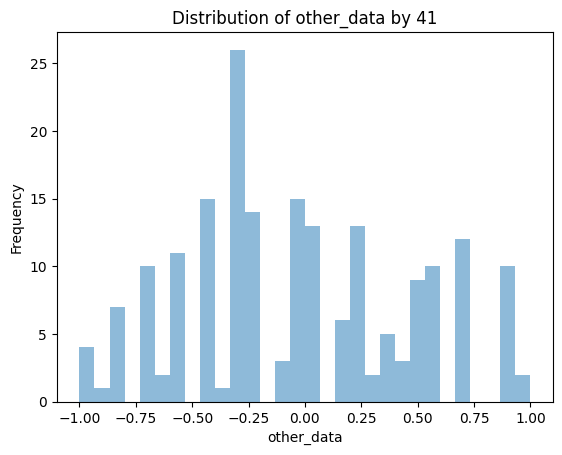

In [ ]:
labels = df3['label'].unique()

for label in labels:
    subset = df3[df3['label'] == label]
    plt.hist(subset['utility_agent1'], bins=30, alpha=0.5,)

    # グラフのタイトルとラベルを追加
    plt.title(f'Distribution of other_data by {label}')
    plt.xlabel('other_data')
    plt.ylabel('Frequency')

    # グラフを表示
    plt.show()